In [32]:
import networkx as nx
import pandas as pd
import itertools
import math
import random
import json
from tqdm import tqdm
import sys
import time
import timeit
import nltk
import json
from tqdm import tqdm

import ast
import spacy

nlp = spacy.load('en_core_web_sm')

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None

nltk.download('stopwords')
nltk_stopwords = nltk.corpus.stopwords.words('english')
nltk_stopwords += ["like", "gone", "did", "going", "would", "could", "get", "in", "up", "may", "wanter"]

new_events_csv = f'../../generated/new_events_from_comet/ROCStories_with_new_triples_topk_pruned_sample.csv'
new_events_df = pd.read_csv(new_events_csv, sep='\t', header=0)




# config = configparser.ConfigParser()
# config.read("paths.cfg")

# cpnet = None
# concept2id = None
# relation2id = None
# id2relation = None
# id2concept = None
# blacklist = set(["uk", "us", "take", "make", "object", "person", "people"])

# def load_resources():
#     global concept2id, relation2id, id2relation, id2concept
#     concept2id = {}
#     id2concept = {}
#     with open(config["paths"]["concept_vocab"], "r", encoding="utf8") as f:
#         for w in f.readlines():
#             concept2id[w.strip()] = len(concept2id)
#             id2concept[len(id2concept)] = w.strip()

#     print("concept2id done")
#     id2relation = {}
#     relation2id = {}
#     with open(config["paths"]["relation_vocab"], "r", encoding="utf8") as f:
#         for w in f.readlines():
#             id2relation[len(id2relation)] = w.strip()
#             relation2id[w.strip()] = len(relation2id)
#     print("relation2id done")

# def save_cpnet():
#     global concept2id, relation2id, id2relation, id2concept, blacklist
#     load_resources()
#     graph = nx.MultiDiGraph()
#     with open(config["paths"]["conceptnet_en"], "r", encoding="utf8") as f:
#         lines = f.readlines()

#         def not_save(cpt):
#             if cpt in blacklist:
#                 return True
#             for t in cpt.split("_"):
#                 if t in nltk_stopwords:
#                     return True
#             return False

#         for line in tqdm(lines, desc="saving to graph"):
#             ls = line.strip().split('\t')
#             rel = relation2id[ls[0]]
#             subj = concept2id[ls[1]]
#             obj = concept2id[ls[2]]
#             weight = float(ls[3])
#             if id2relation[rel] == "hascontext":
#                 continue
#             if not_save(ls[1]) or not_save(ls[2]):
#                 continue
#             if id2relation[rel] == "relatedto" or id2relation[rel] == "antonym":
#                 weight -= 0.3
#                 # continue
#             if subj == obj: # delete loops
#                 continue
#             weight = 1+float(math.exp(1-weight))
#             graph.add_edge(subj, obj, rel=rel, weight=weight)
#             graph.add_edge(obj, subj, rel=rel+len(relation2id), weight=weight)


#     nx.write_gpickle(graph, config["paths"]["conceptnet_en_graph"])
    

# save_cpnet()

[nltk_data] Downloading package stopwords to /Users/omar/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [33]:
new_events_df.iloc[:1]

Unnamed: 0  Unnamed: 0.1                               storyid  \
0           0             0  9a51198e-96f1-42c3-b09d-a3e1e067d803   

       storytitle                       sentence1  \
0  Overweight Kid  Dan's parents were overweight.   

                     sentence2  \
0  Dan was overweight as well.   

                                        sentence3  \
0  The doctors told his parents it was unhealthy.   

                                              sentence4  \
0  His parents understood and decided to make a change.   

                                sentence5  \
0  They got themselves and Dan on a diet.   

                                                                                                 coref_clusters  \
0  [Dan: [Dan, Dan, his, His, Dan], Dan's parents: [Dan's parents, his parents, His parents, They, themselves]]   

                        resolved1                    resolved2  \
0  Dan's parents were overweight.  Dan was overweight as well.   

                                          resolved3  \
0  The doctors told Dan's parents it was unhealthy.   

                                                resolved4  \
0  Dan's parents understood and decided to make a change.   

                                            resolved5  \
0  Dan's parents got Dan's parents and Dan on a diet.   

                                     triples1  \
0  [["Dan 's parents", 'were', 'overweight']]   

                                                    triples2  \
0  [['Dan', 'was', 'overweight'], ['Dan', 'was', 'as well']]   

                                                                                                               triples3  \
0  [['The doctors', 'told', "Dan 's parents"], ['The doctors', 'told', 'it was unhealthy'], ['it', 'was', 'unhealthy']]   

                                                                                      triples4  \
0  [["Dan 's parents", 'decided', 'to make a change'], ["Dan 's parents", 'make', 'a change']]   

                                                                                        triples5  \
0  [["Dan 's parents", 'got', "Dan 's parents and Dan"], ["Dan 's parents", 'got', 'on a diet']]   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      sentence_1  \
0  [[["Dan 's parents", 'were', 'overweight'], 'xWant', [' to get rid of the extra weight.', ' to get rid of the excess weight.', ' to buy new clothes for his parents.', ' to eat a lot of junk food.', ' to eat les

In [34]:
import matplotlib.pyplot as plt

In [35]:
def lemmatize(token):
#     print(token.text, token.pos_)
    if token.text == "n't":
        return "not"
    return token.lemma_

0it [00:00, ?it/s]

Dan PROPN
[["Dan 's parents", 'were', 'overweight']]


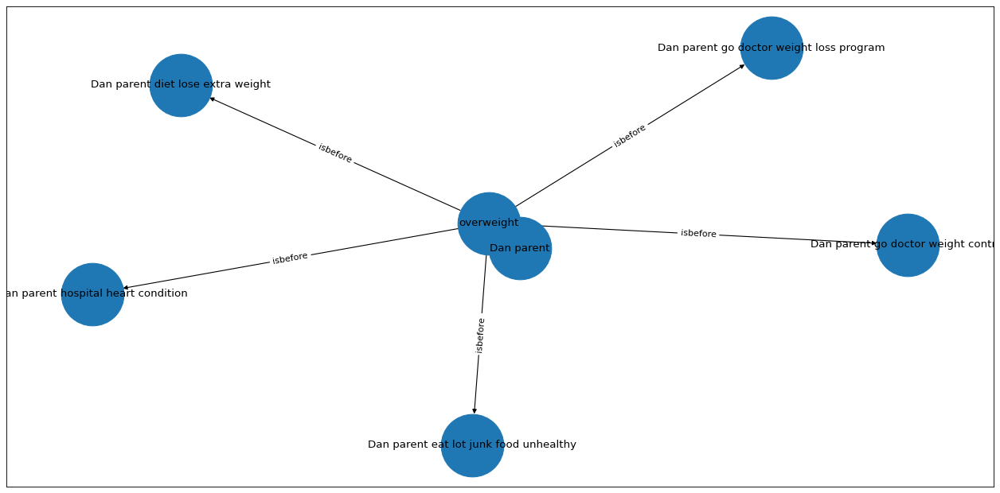

1it [00:00,  2.74it/s]

Carrie PROPN
Carrie PROPN
Carrie PROPN
Carrie PROPN
[['Carrie', 'learned', 'just'], ['Carrie', 'learned', 'how to ride a bike'], ['Carrie', 'ride', 'how'], ['Carrie', 'ride', 'a bike']]


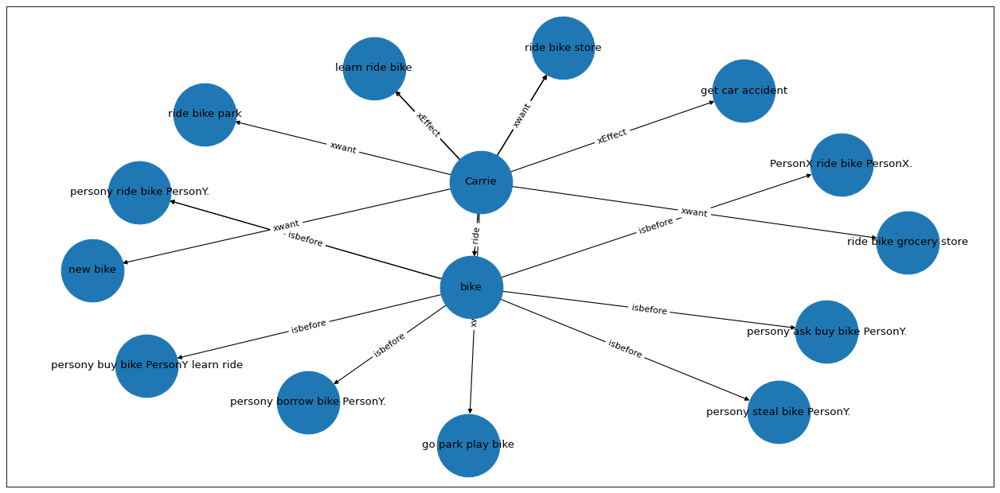

2it [00:01,  1.80it/s]

Morgan PROPN
[['Morgan', 'enjoyed', 'long walks on the beach']]


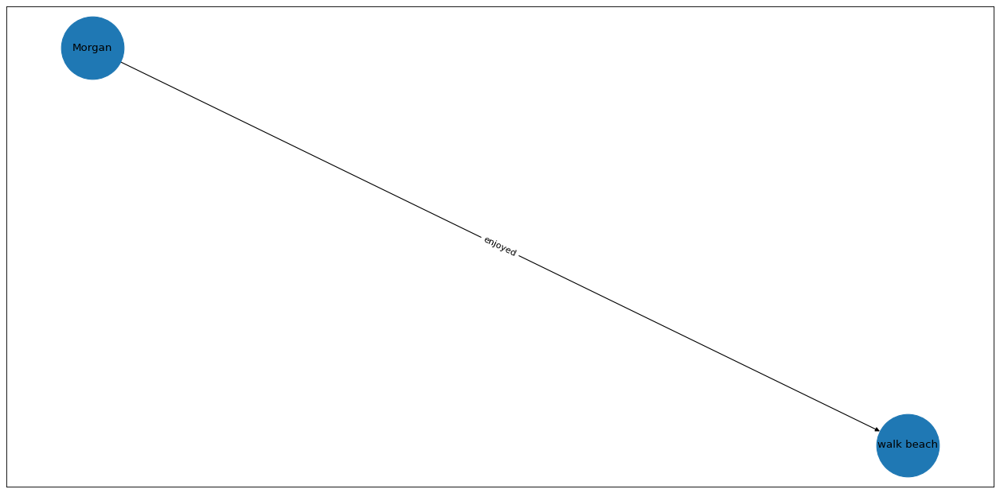

3it [00:01,  2.59it/s]

Jane PROPN
[['Jane', 'working', 'at a diner']]


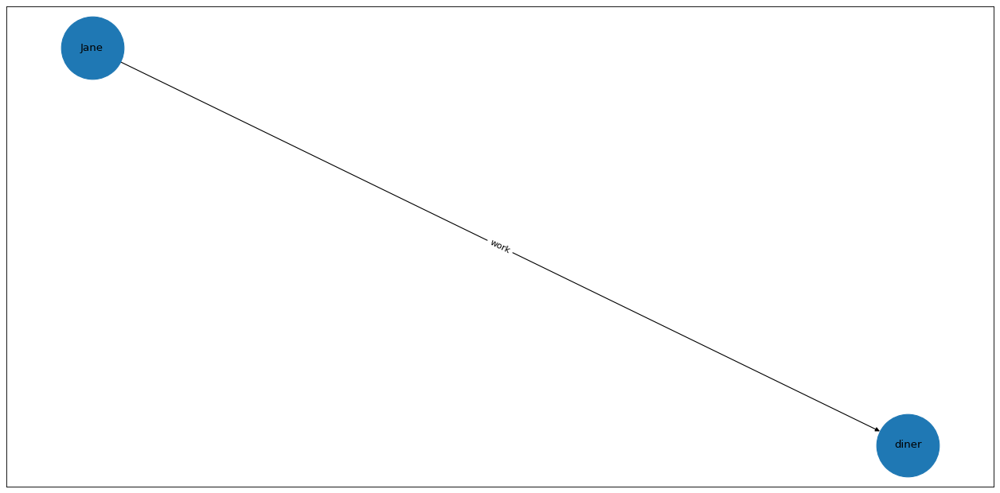

4it [00:01,  3.23it/s]

I PRON
I PRON
[['I', 'talking', 'to my crush'], ['I', 'talking', 'today']]


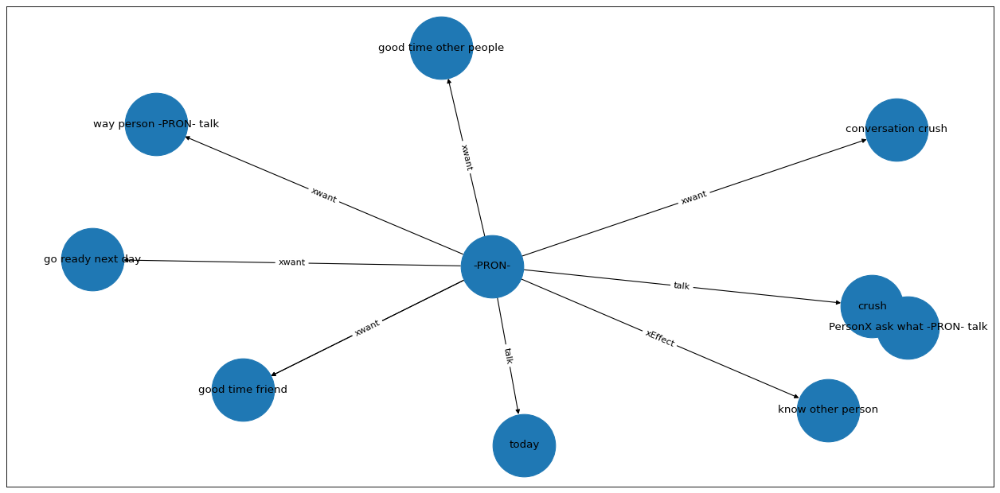

5it [00:01,  2.89it/s]

Frank PROPN
[['Frank', 'drinking', 'beer']]


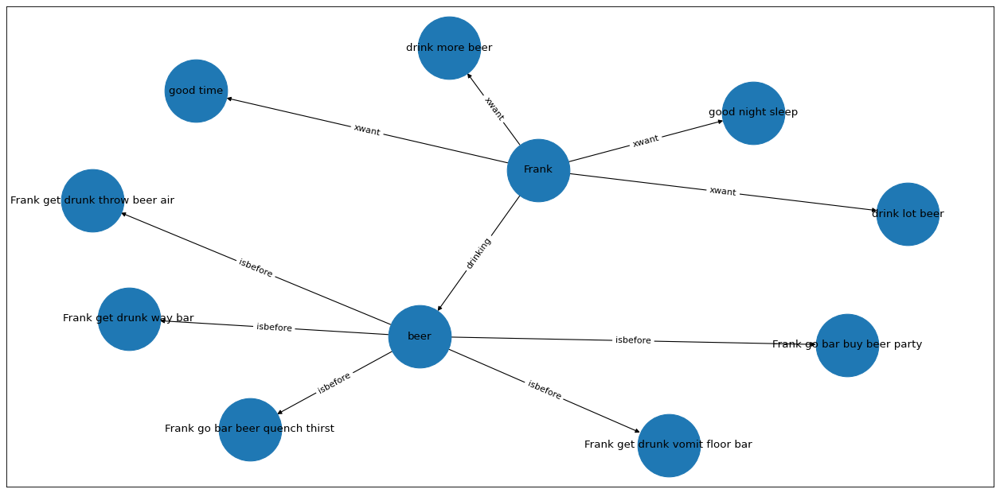

6it [00:02,  2.71it/s]

Dave PROPN
Dave PROPN
[['Dave', 'was', 'in the Bahamas'], ['Dave', 'was', 'on vacation']]


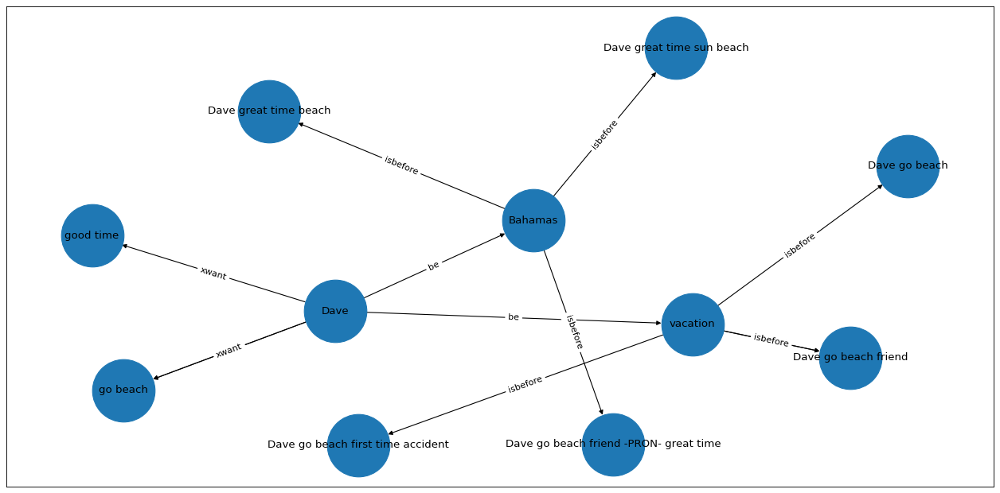

7it [00:02,  2.53it/s]

Sunny ADJ
Sunny ADJ
[['Sunny', 'enjoyed', 'going to the beach'], ['Sunny', 'going', 'to the beach']]


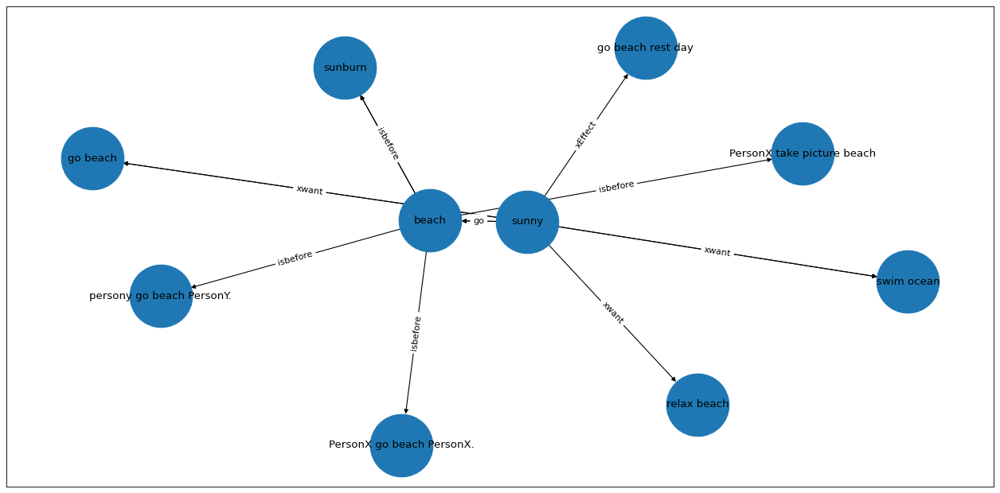

8it [00:03,  2.42it/s]

Sally PROPN
Sally PROPN
Sally PROPN
Sally PROPN
[['Sally', 'was', 'happy'], ['Sally', 'was', 'when Sally widowed mom found a new man'], ['Sally widowed mom', 'found', 'when'], ['Sally widowed mom', 'found', 'a new man']]


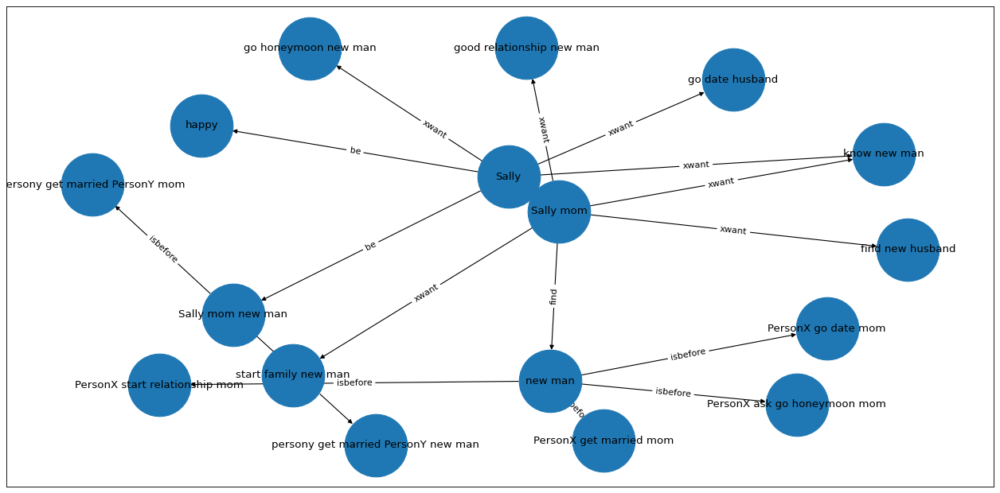

9it [00:03,  2.14it/s]

Dan PROPN
Dan PROPN
Dan PROPN
[['Dan', 'hit', 'Dan'], ['Dan', 'hit', 'golf ball'], ['Dan', 'watched', 'his golf ball go']]


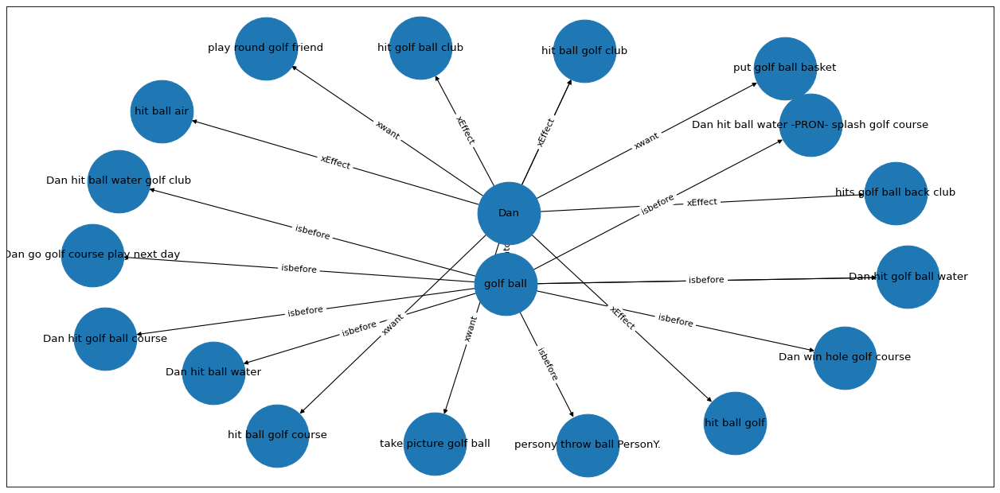

10it [00:04,  1.81it/s]

Josh PROPN
[['Josh', 'had', 'a parrot that talked']]


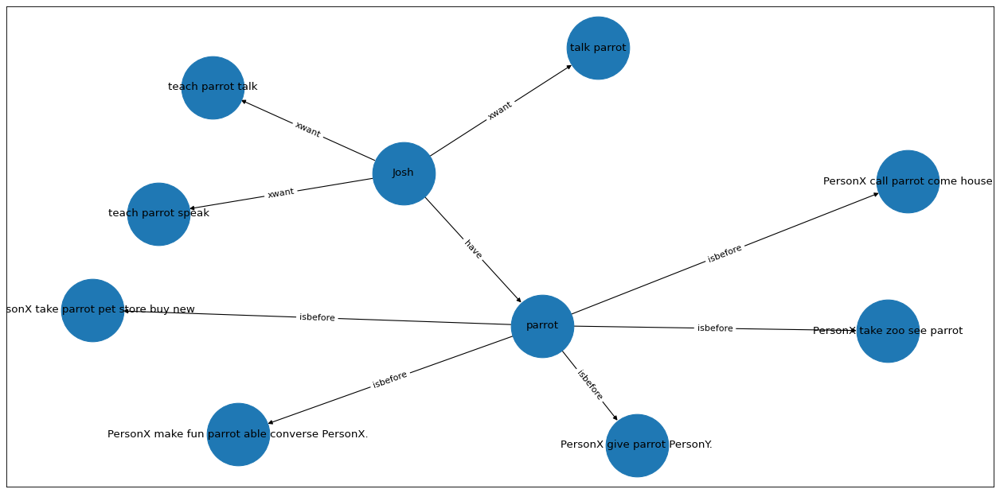

11it [00:04,  1.98it/s]

Hal INTJ
[['Hal', 'walking', 'one morning']]


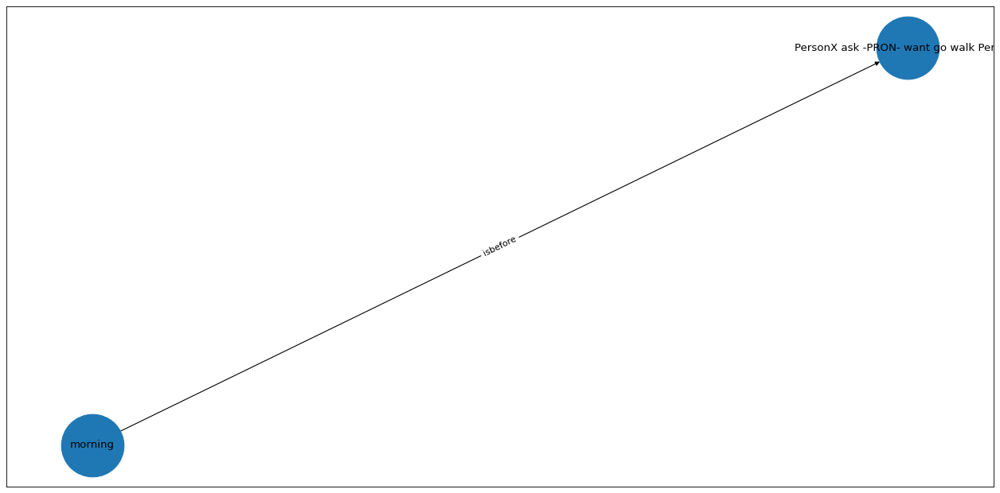

12it [00:05,  2.44it/s]

Brenda PROPN
[['Brenda', 'was', 'in love with Brenda boyfriend Maxwell']]


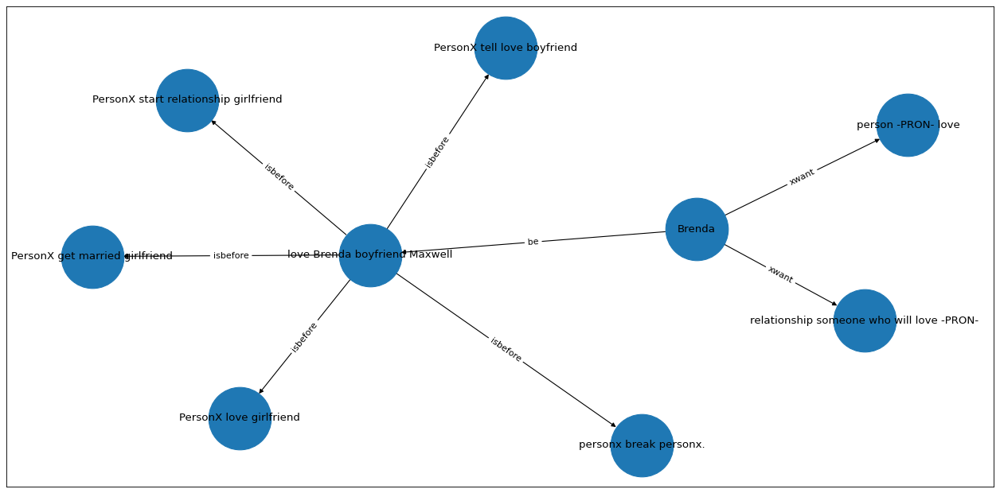

13it [00:05,  2.48it/s]

Yanice PROPN
Yanice PROPN
[['Yanice', 'opened', 'the fridge'], ['Yanice', 'found', 'nothing to eat']]


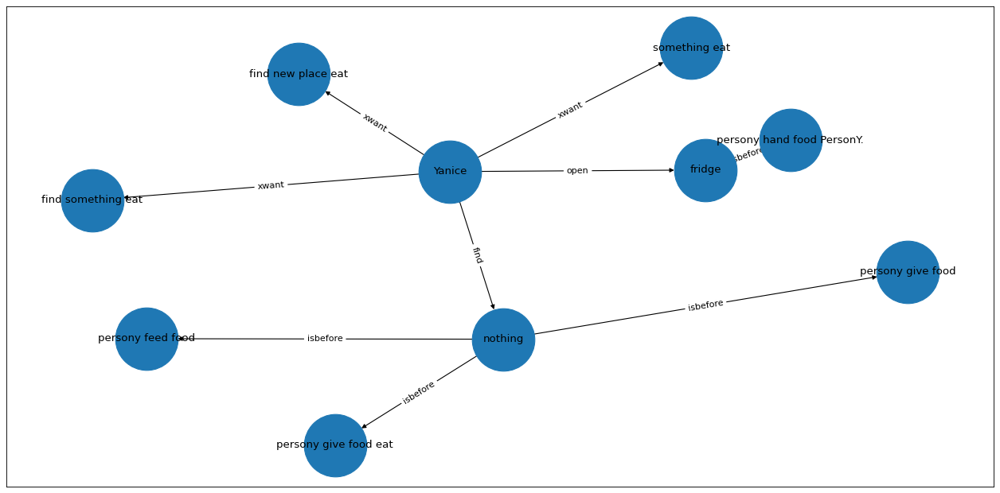

14it [00:05,  2.51it/s]

I PRON
my DET
my DET
[['I', 'saw', 'my friend Joe sitting in lobby today'], ['my friend Joe', 'sitting', 'in lobby'], ['my friend Joe', 'sitting', 'today']]


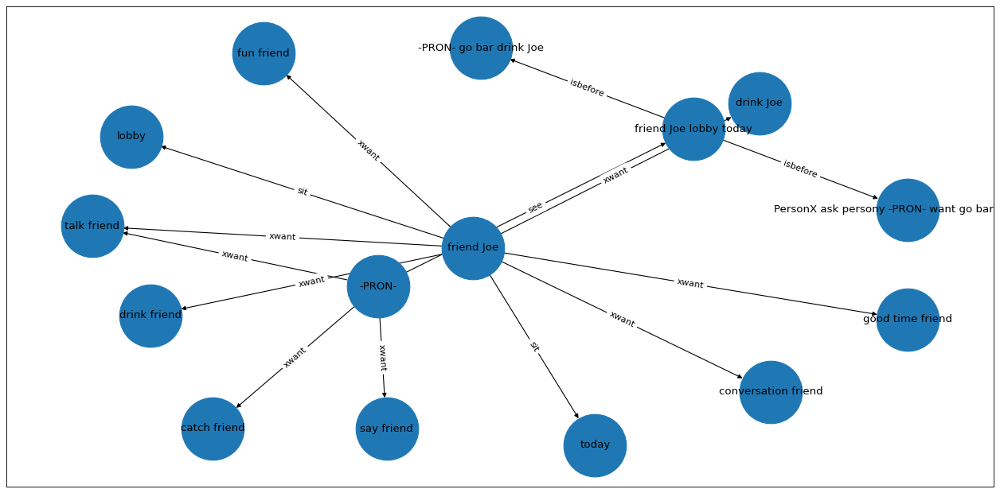

15it [00:06,  2.15it/s]

[]


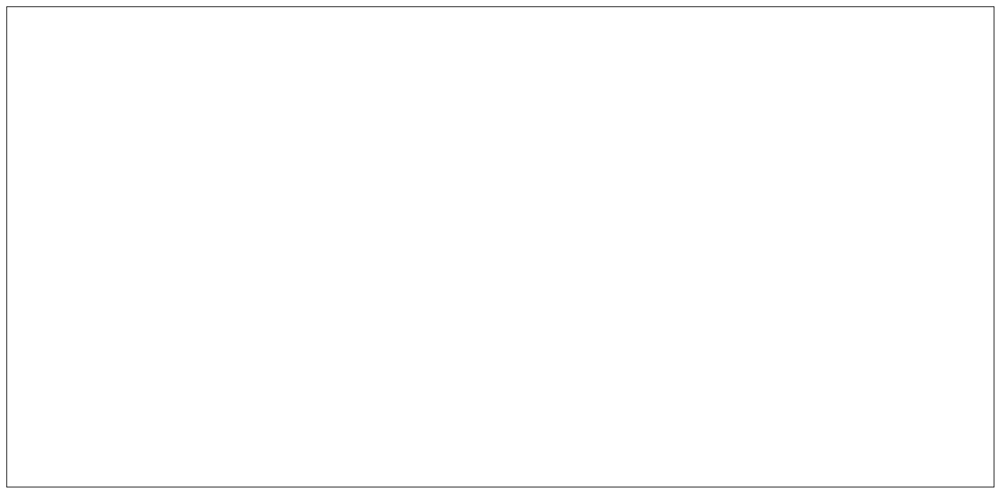

16it [00:06,  2.76it/s]

I PRON
a DET
[['I', 'knew', 'of a young man who won the lottery'], ['a young man', 'won', 'the lottery']]


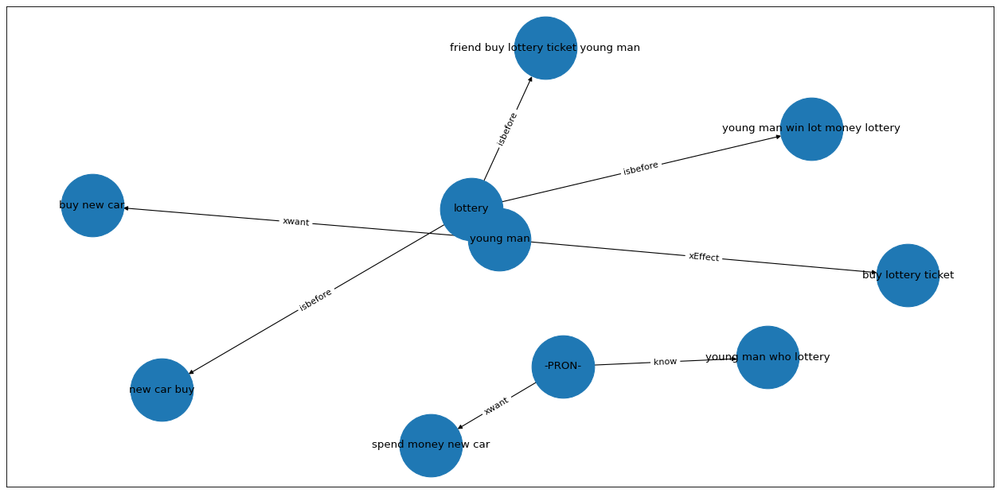

17it [00:06,  2.75it/s]

A DET
[['A die hard shopper', 'waiting', 'in the long line outside']]


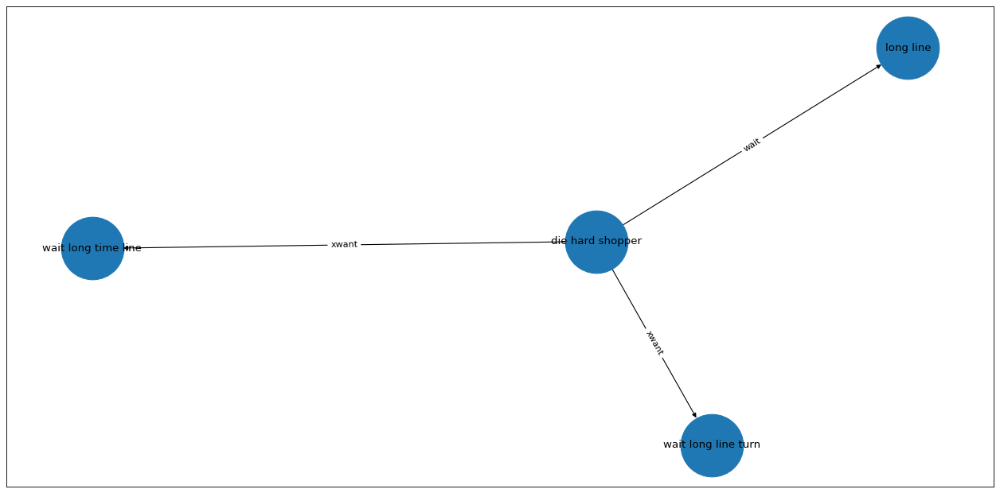

18it [00:07,  3.09it/s]

Jeff PROPN
Jeff PROPN
Jeff PROPN
Jeff PROPN
Jeff PROPN
[['Jeff', 'invited', 'Jeff friends'], ['Jeff', 'invited', 'over'], ['Jeff', 'invited', 'to play board games on Saturday night'], ['Jeff friends', 'play', 'board games'], ['Jeff friends', 'play', 'on Saturday night']]


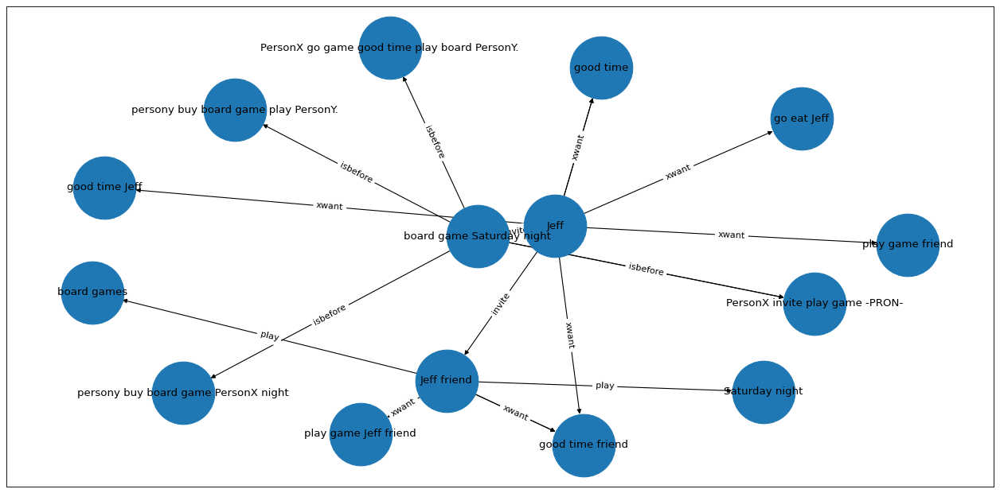

19it [00:07,  2.41it/s]

Chuck PROPN
Chuck PROPN
Chuck PROPN
Chuck PROPN
[['Chuck', 'reclined', 'on the back porch'], ['Chuck', 'reclined', 'as Chuck sipped Chuck morning coffee'], ['Chuck', 'sipped', 'Chuck'], ['Chuck', 'sipped', 'morning coffee']]


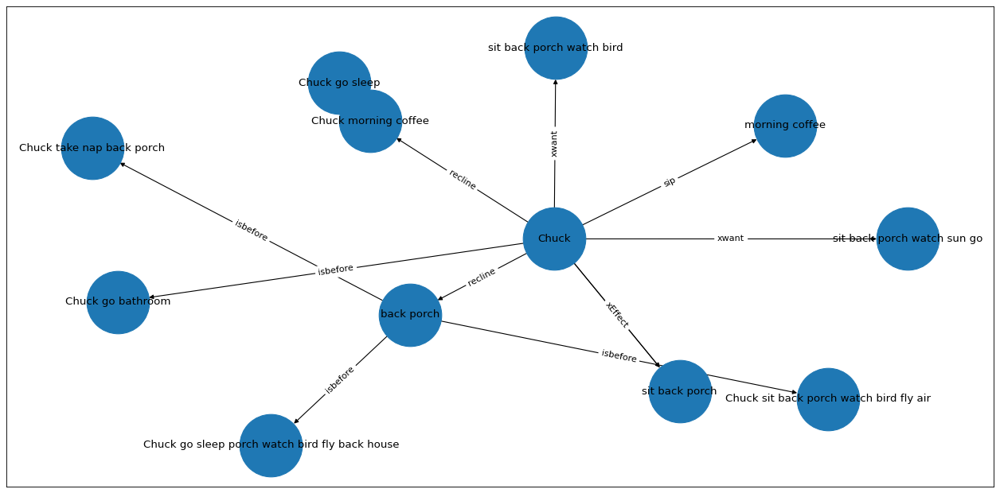

20it [00:08,  2.32it/s]

Jessica PROPN
Jessica PROPN
Jessica PROPN
[['Jessica', 'decided', 'Jessica wanted to go to the beach'], ['Jessica', 'wanted', 'to go to the beach'], ['Jessica', 'go', 'to the beach']]


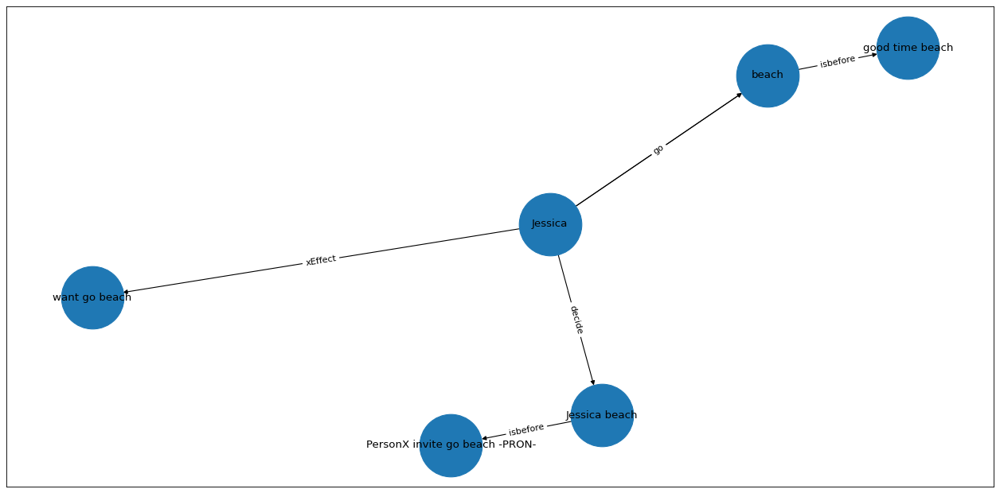

21it [00:08,  2.55it/s]

Dan PROPN
Dan PROPN
[['Dan', 'wanted', 'a pet'], ['Dan', 'wanted', 'for Christmas']]


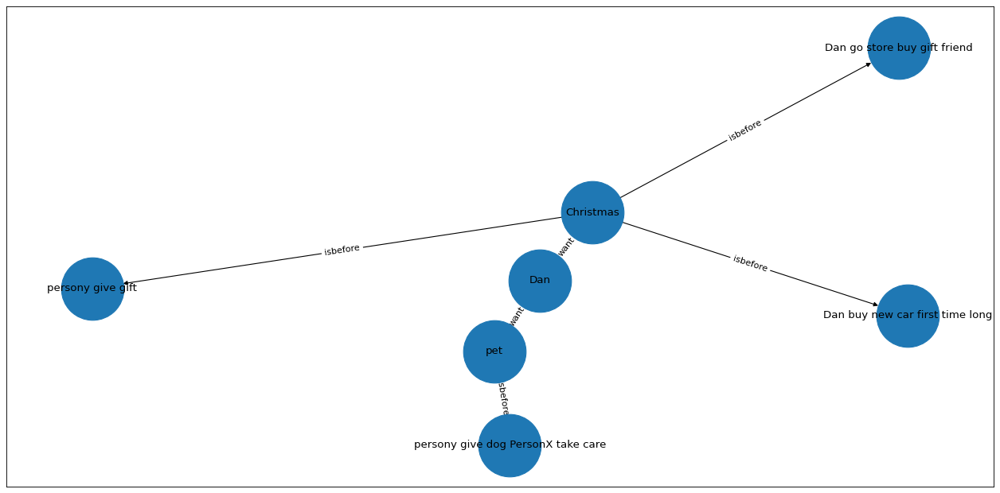

22it [00:08,  2.73it/s]

Kelly PROPN
Kelly PROPN
[['Kelly and her friends', 'decided', 'to have a hot dog contest'], ['Kelly and her friends', 'have', 'a hot dog contest']]


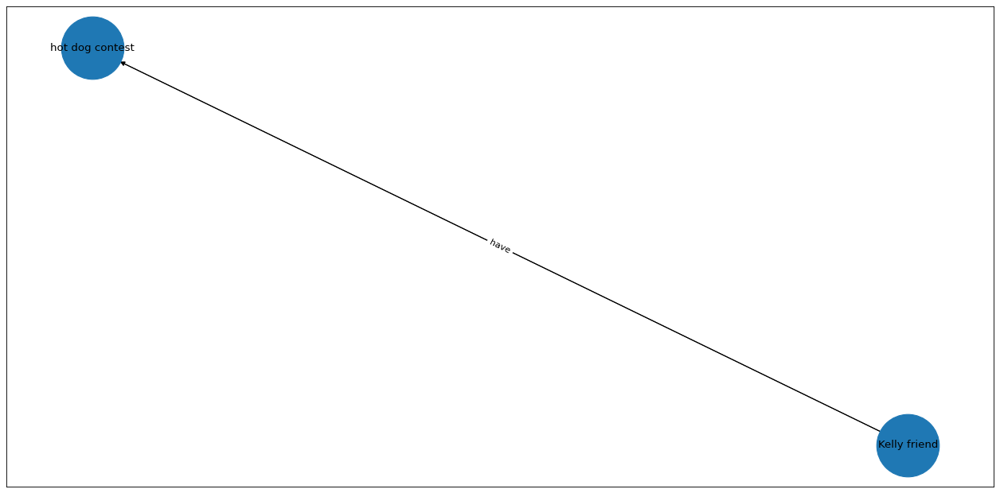

23it [00:09,  3.17it/s]

Dan PROPN
[['Dan', 'watching', 'a Youtube video']]


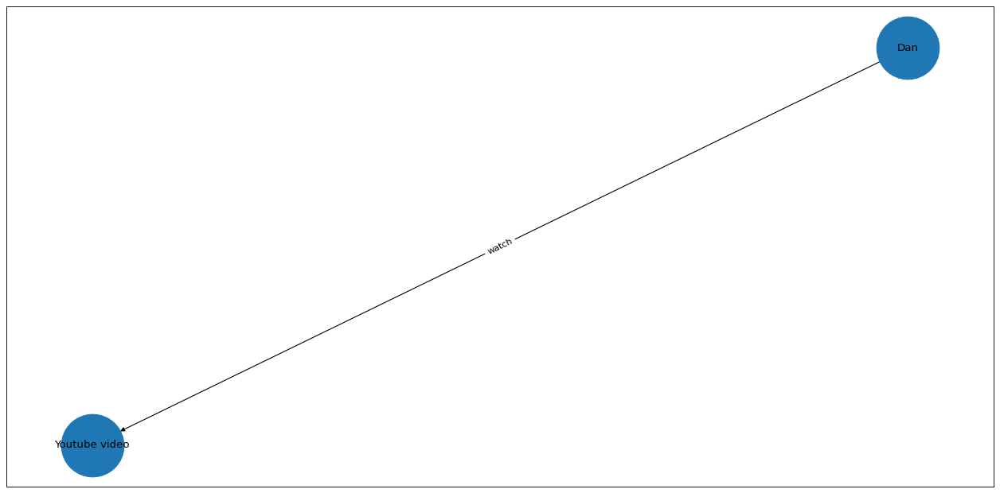

24it [00:09,  3.62it/s]

Jeff PROPN
Jeff PROPN
[['Jeff', 'wanted', 'to move out of Jeff house'], ['Jeff', 'move', 'out of Jeff house']]


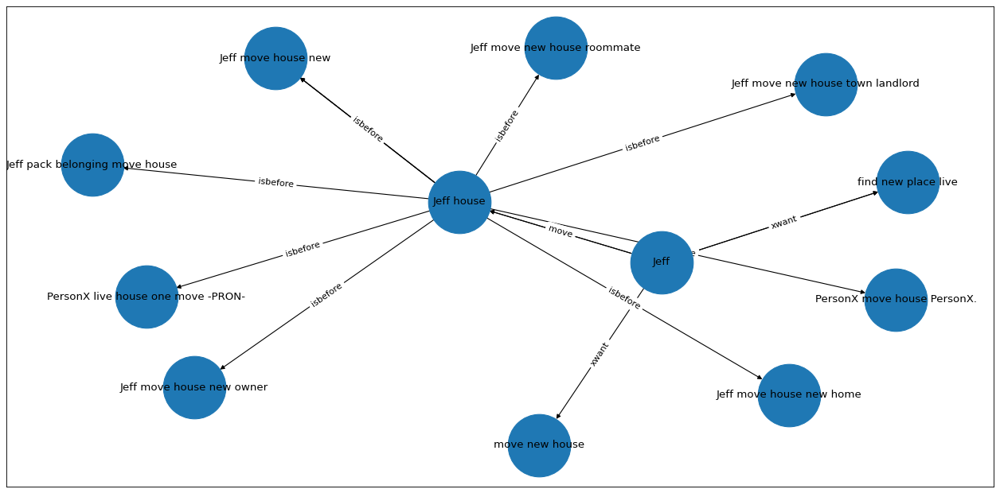

25it [00:09,  2.86it/s]

I PRON
[['I', 'walking', 'to school']]


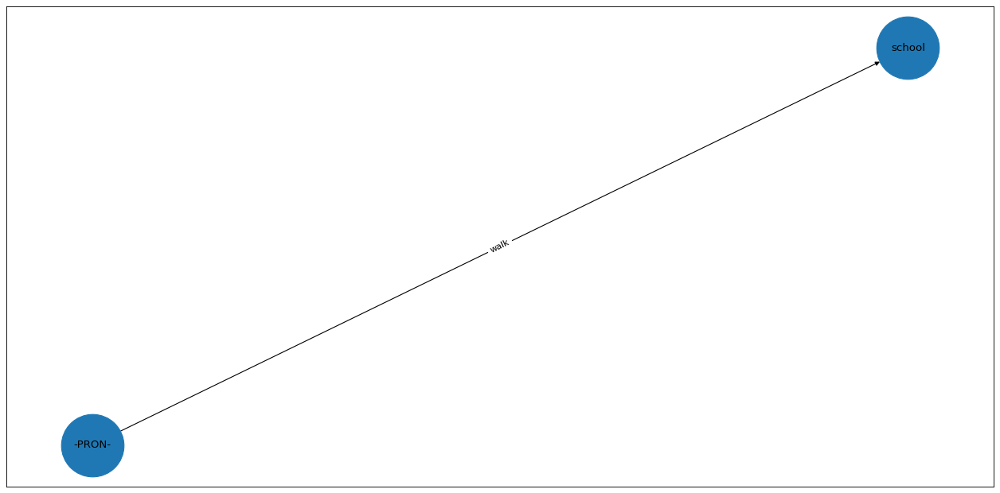

26it [00:09,  3.34it/s]

Lily ADV
Lily ADV
[['Lily', 'drove', 'into town'], ['Lily', 'drove', 'for some errands']]


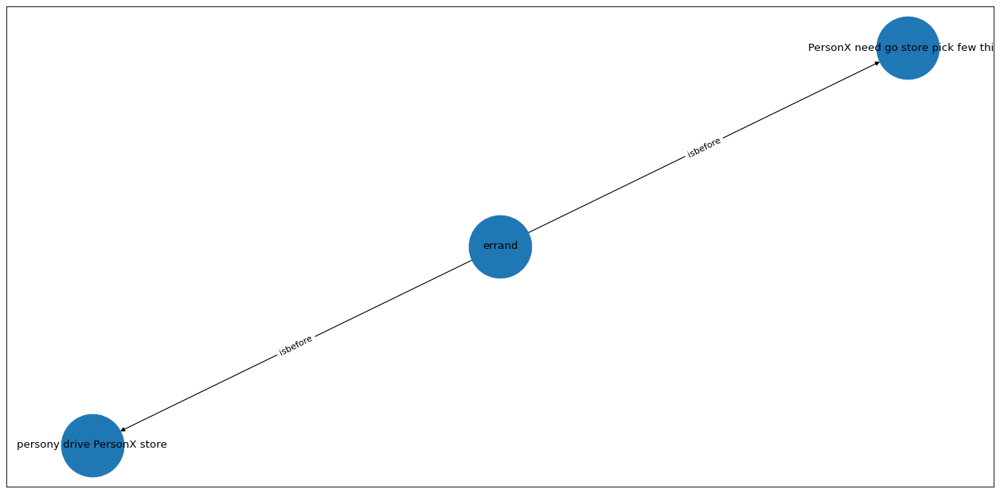

27it [00:10,  3.44it/s]

Todd PROPN
[['Todd', 'was', 'hungry']]


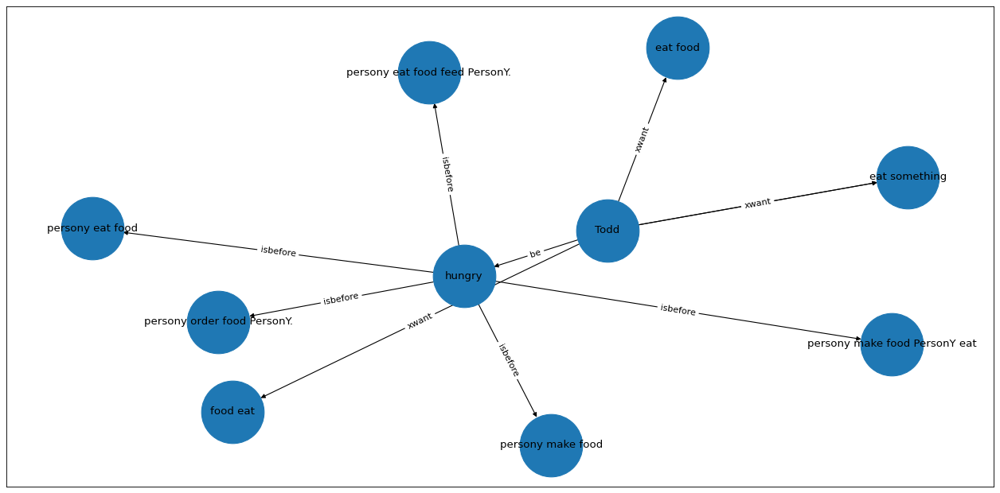

28it [00:10,  3.09it/s]

Virgil PROPN
Virgil PROPN
Virgil PROPN
Virgil PROPN
[['Virgil', 'brought', 'home'], ['Virgil', 'brought', 'a bright blue recliner Virgil had found online'], ['Virgil', 'found', 'a bright blue recliner'], ['Virgil', 'found', 'online']]


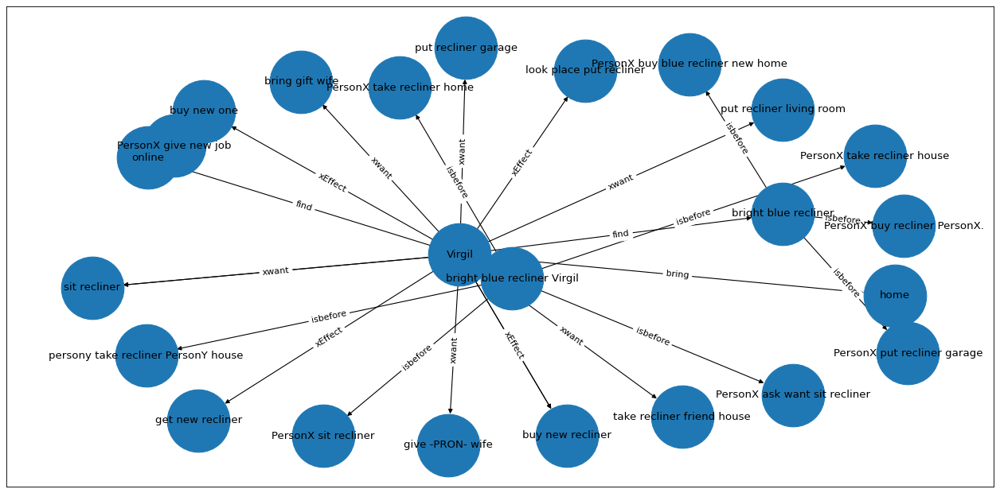

29it [00:11,  2.19it/s]

Jenna PROPN
Jenna PROPN
[['Jenna', 'was', 'at the community pool'], ['Jenna', 'was', 'with Jenna family']]


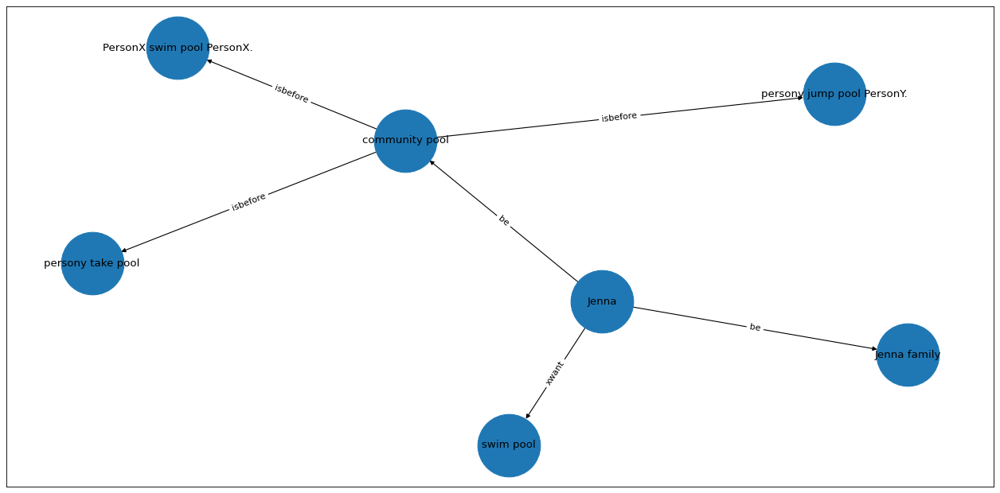

30it [00:11,  2.27it/s]

Joan PROPN
[['Joan', 'entered', 'the confessional']]


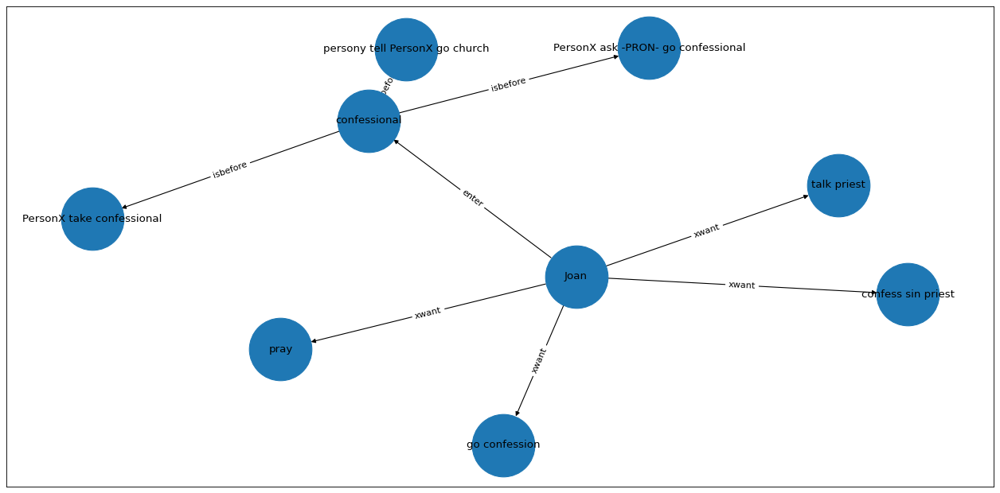

31it [00:12,  2.40it/s]

Homer PROPN
Homer PROPN
Homer PROPN
[['Homer', 'decided', 'to go watch a movie'], ['Homer', 'go', 'watch a movie'], ['Homer', 'watch', 'a movie']]


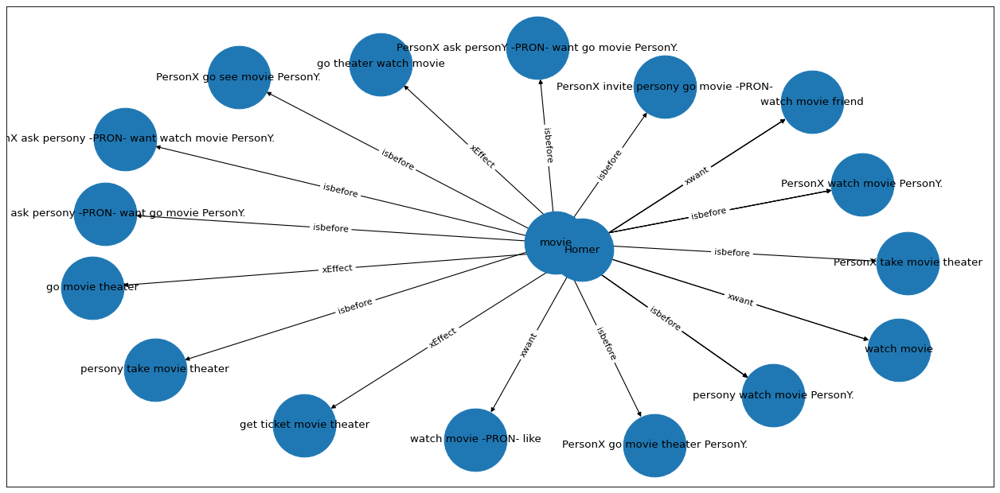

32it [00:12,  1.94it/s]

Chip NOUN
[['Chip', 'loved', 'dip']]


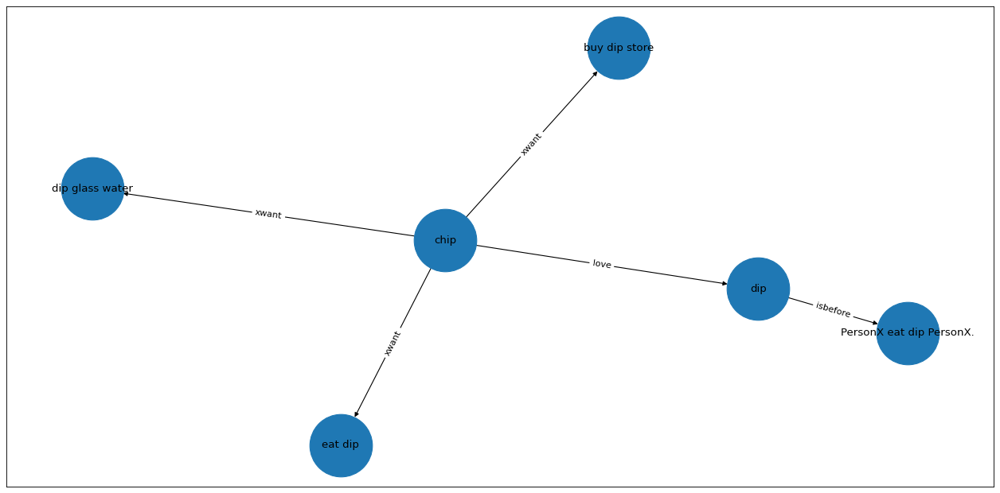

33it [00:13,  2.25it/s]

Anna PROPN
Anna PROPN
Anna PROPN
Anna PROPN
Anna PROPN
[['Anna', 'wanted', 'to invite Anna crush Peter to the Sadie Hawkins dance'], ['Anna', 'invite', 'Anna crush Peter'], ['Anna', 'invite', 'to the Sadie Hawkins dance'], ['Anna', 'crush', 'Peter'], ['Anna', 'crush', 'to the Sadie Hawkins dance']]


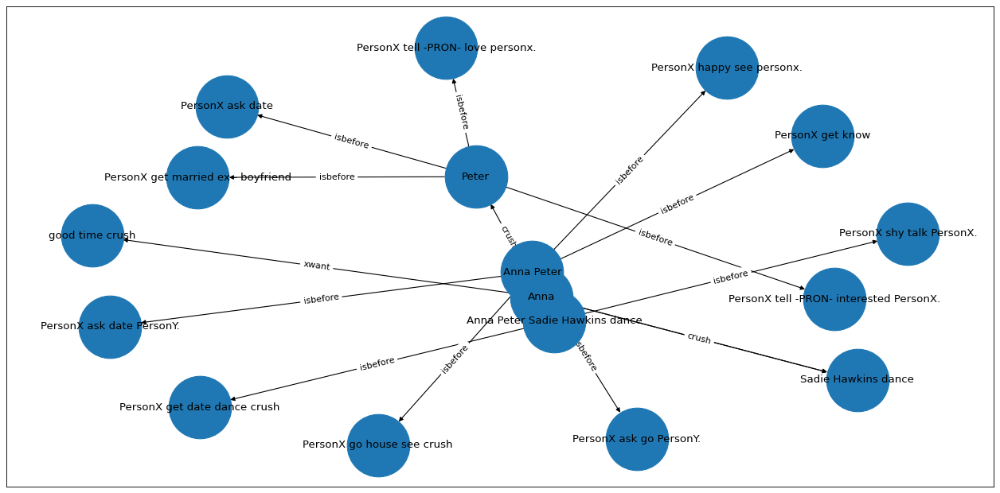

34it [00:13,  2.06it/s]

Gina PROPN
[['Gina', 'being', 'mean to the new boy in Gina class']]


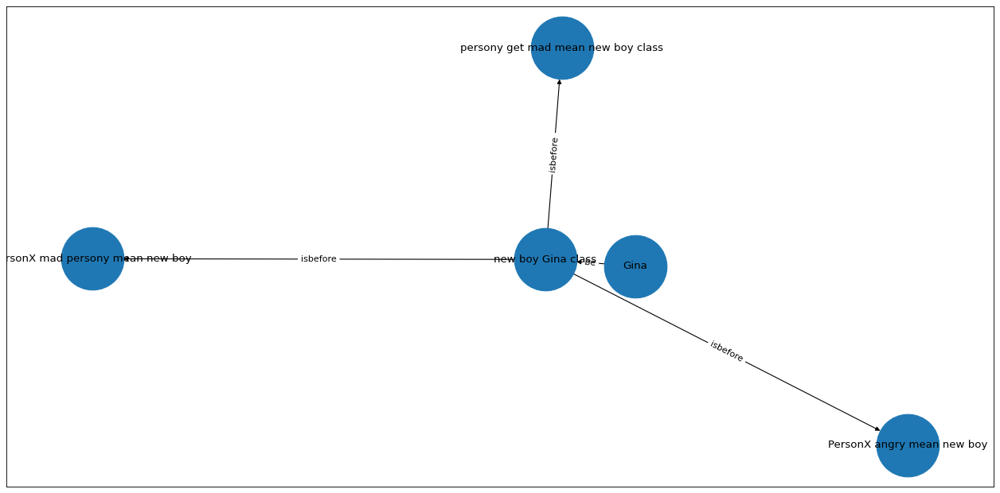

35it [00:14,  2.40it/s]

Jerry PROPN
[['Jerry', 'making', 'toast']]


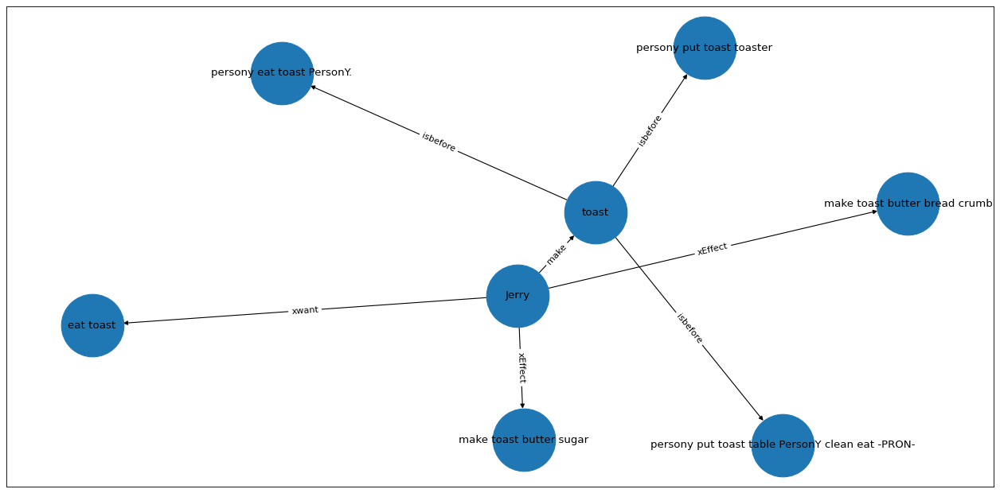

36it [00:14,  2.52it/s]

I PRON
I PRON
I PRON
[['I', 'overdrafted', 'Last week'], ['I', 'overdrafted', 'accidentally'], ['I', 'overdrafted', 'my account']]


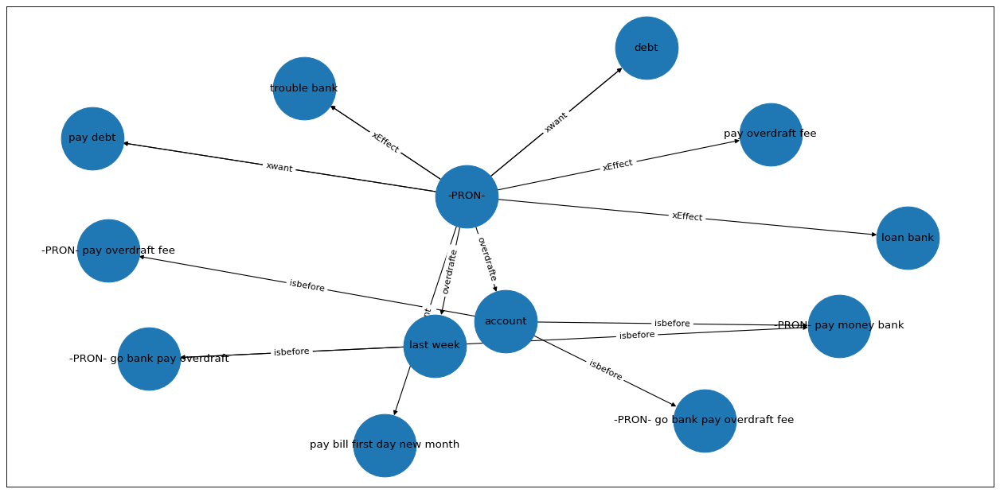

37it [00:15,  2.16it/s]

Frank PROPN
Frank PROPN
[['Frank', 'laughing', 'so hard Frank started crying'], ['Frank', 'started', 'crying']]


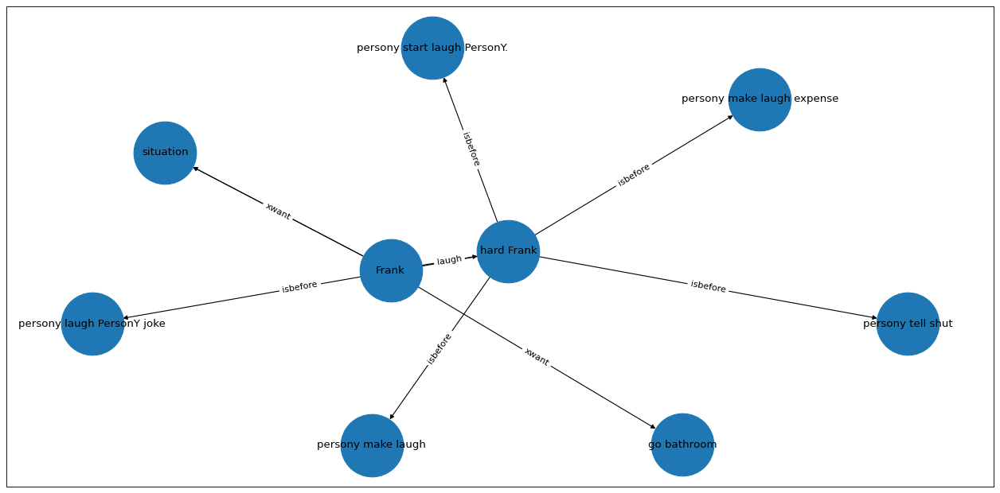

38it [00:15,  2.25it/s]

Ty NOUN
Ty NOUN
her PRON
her PRON
[['Ty', 'been', 'deaf'], ['Ty', 'been', 'all her life'], ['her', 'hoping', 'now'], ['her', 'hoping', 'to hear']]


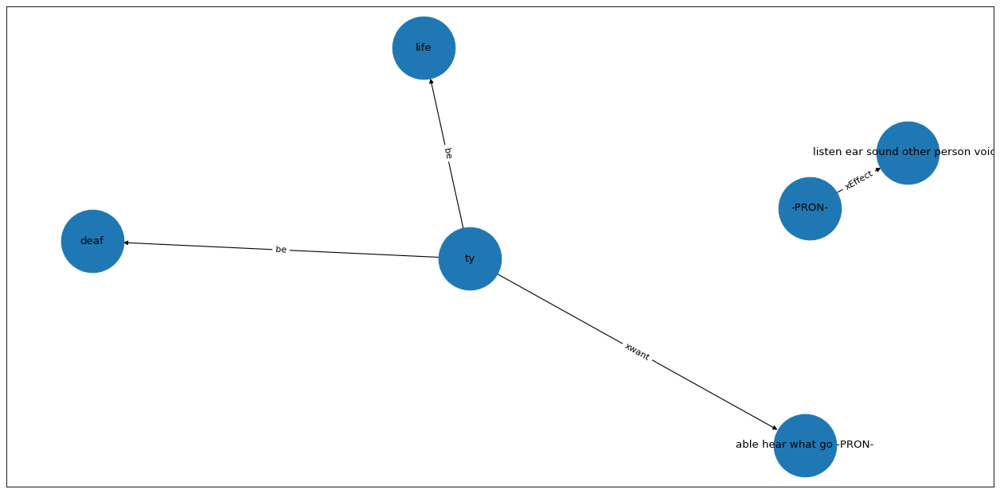

39it [00:15,  2.47it/s]

Bob PROPN
Bob PROPN
Bob PROPN
[['Bob', 'walked', 'into the ship elevator'], ['Bob', 'heard', 'a voice'], ['Bob', 'heard', 'on the speaker']]


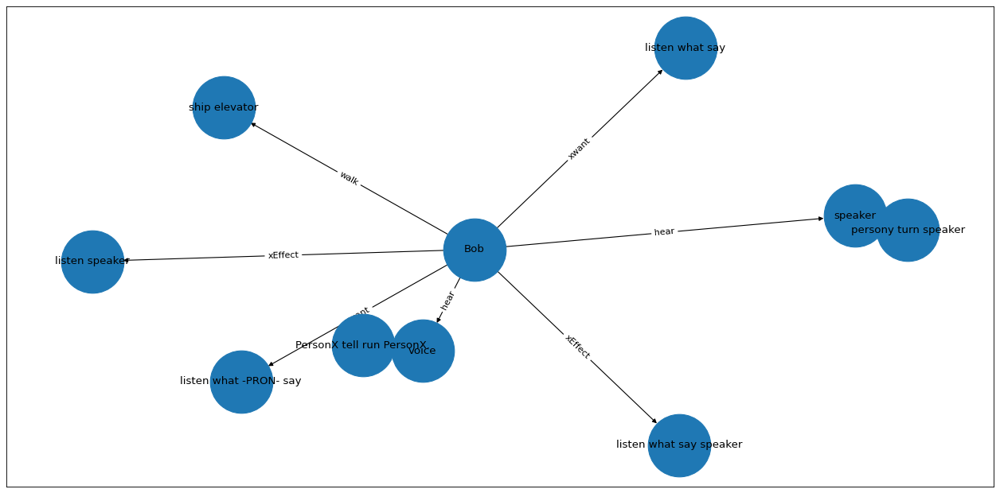

40it [00:16,  2.51it/s]

John PROPN
[['John', 'is', 'sleepy']]


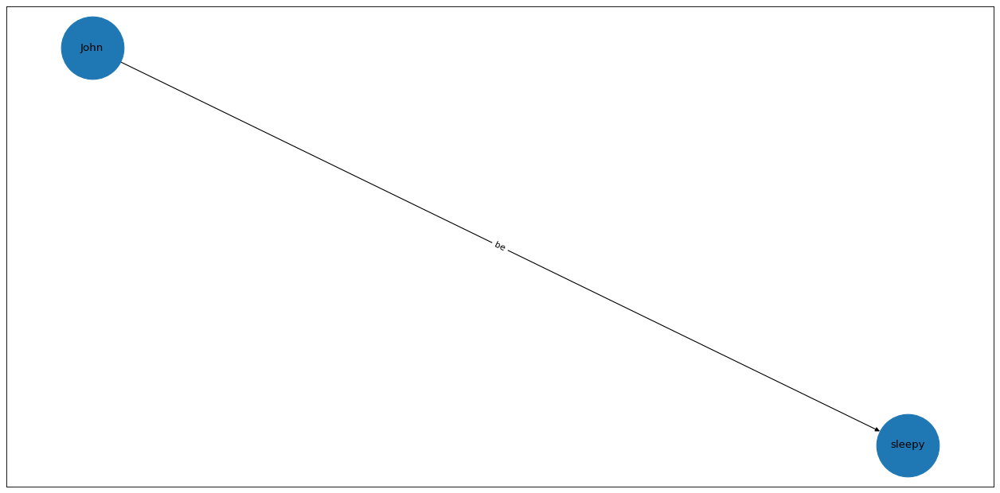

41it [00:16,  3.01it/s]

Susan PROPN
Susan PROPN
[['Susan', 'was', 'excited to plan the egg hunt'], ['Susan', 'plan', 'the egg hunt']]


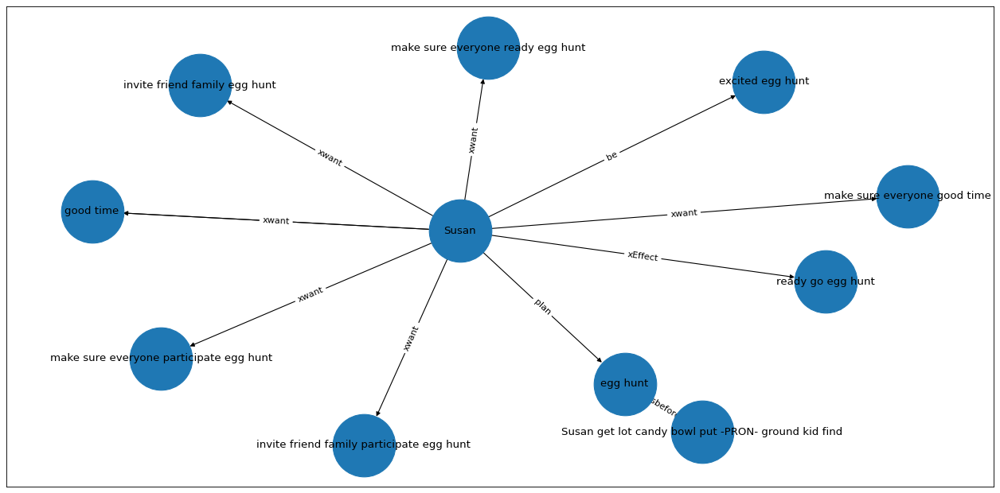

42it [00:16,  2.72it/s]

Bob PROPN
they PRON
[['Bob', 'met', 'Ann'], ['they', 'started', 'dating']]


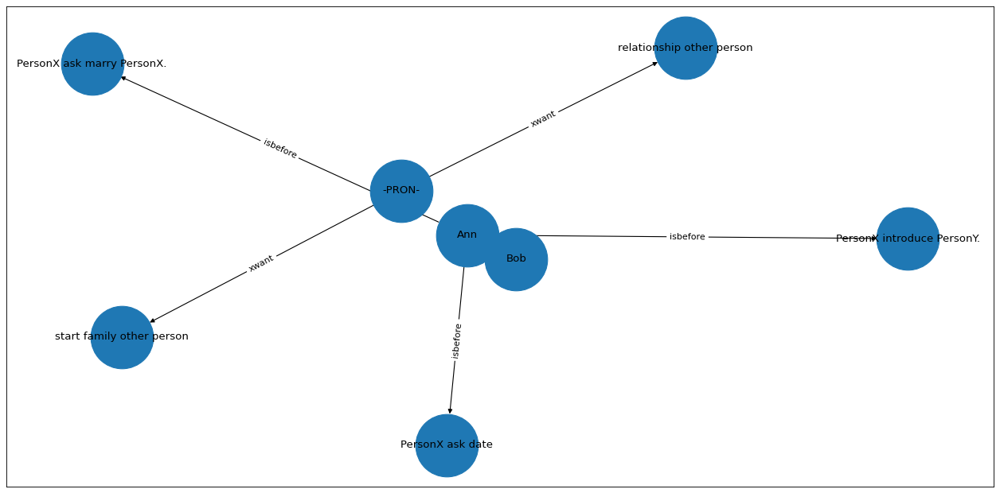

43it [00:17,  2.62it/s]

[]


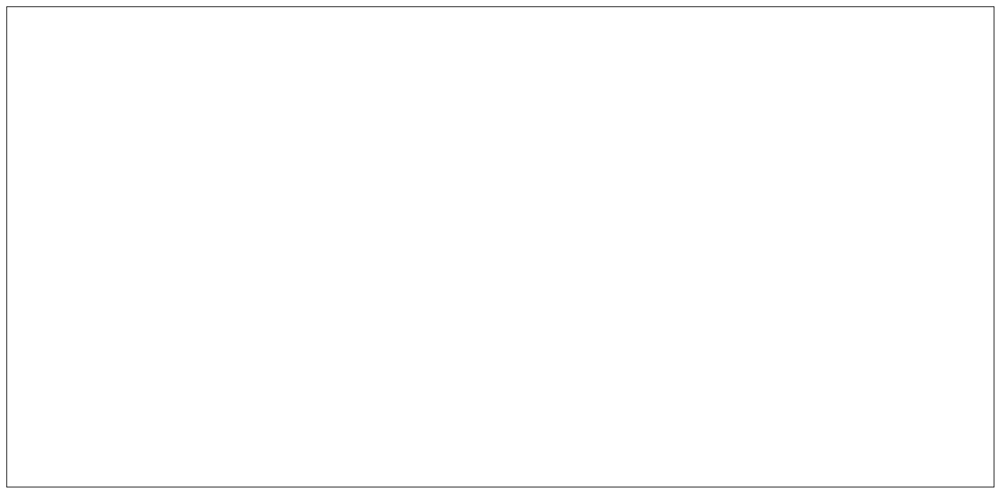

44it [00:17,  3.32it/s]

The DET
The DET
[['The woodworker', 'was', 'not'], ['The woodworker', 'was', 'satisfied with the cuts from a bit']]


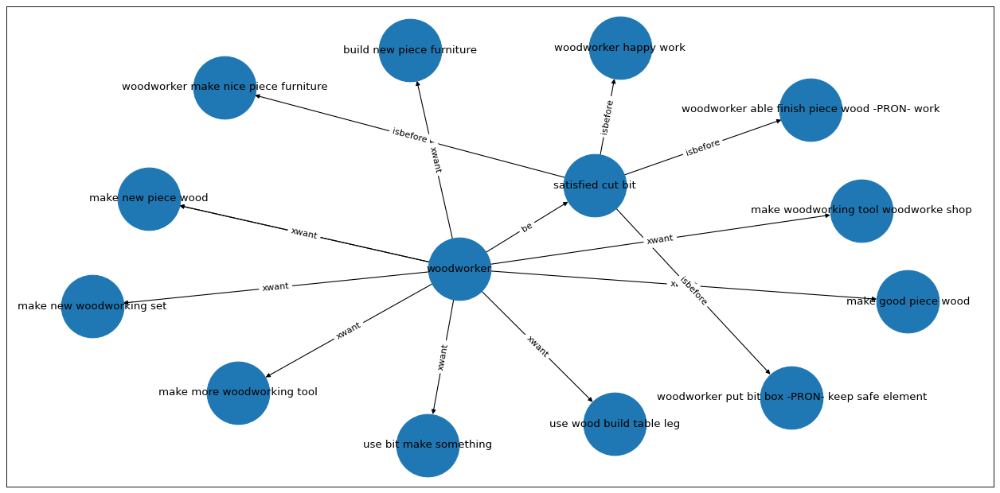

45it [00:17,  2.57it/s]

I PRON
I PRON
[['I', 'came', 'out of my class'], ['I', 'walked', 'to my locker']]


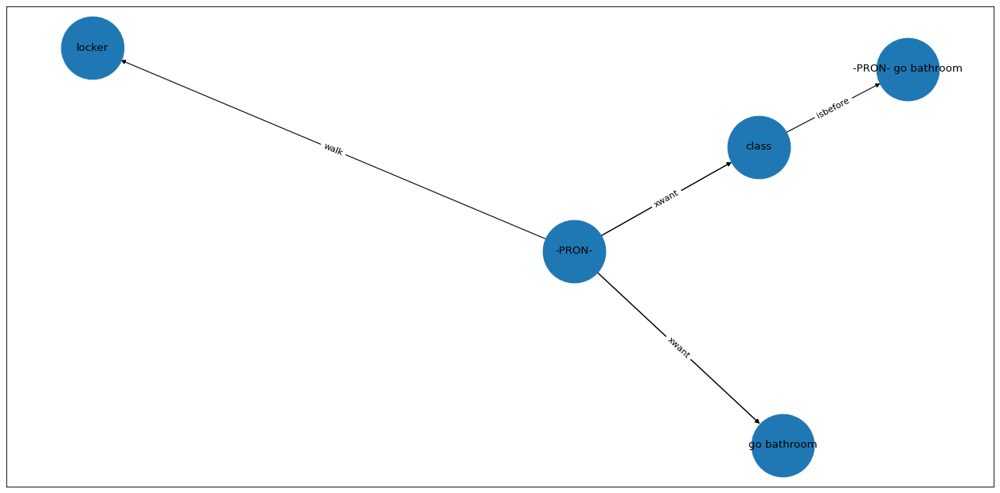

46it [00:18,  2.75it/s]

Timmy PROPN
Timmy PROPN
[['Timmy', 'obsessed', 'always'], ['Timmy', 'obsessed', 'with airplanes']]


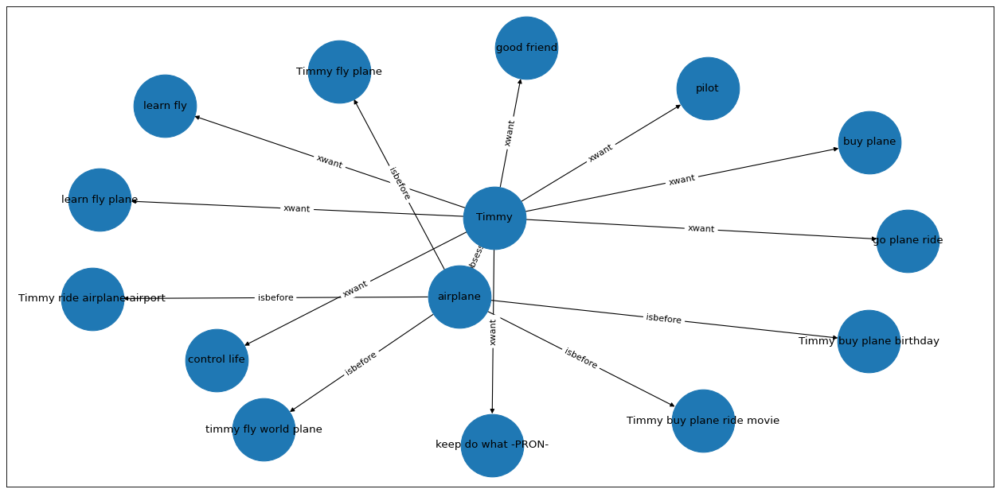

47it [00:18,  2.38it/s]

my DET
my DET
[['my wife and I', 'went', 'Last night'], ['my wife and I', 'went', 'to the spa']]


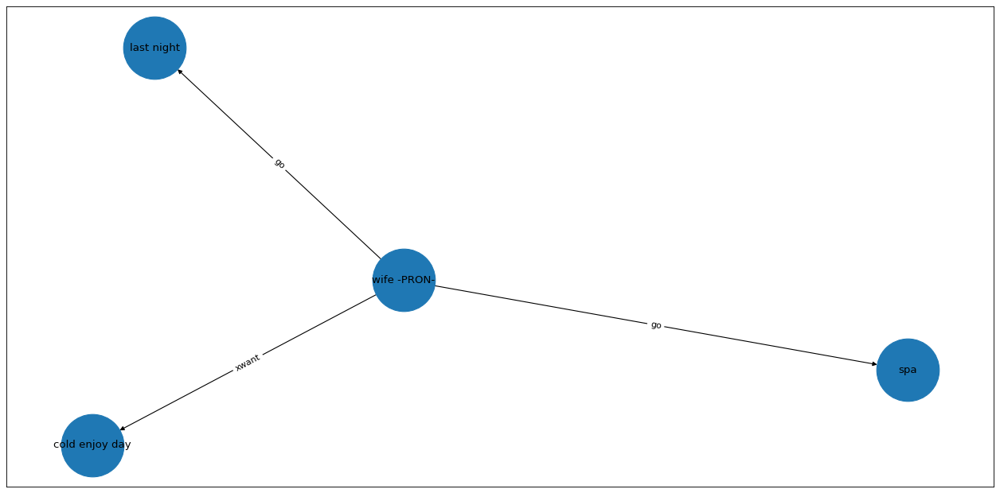

48it [00:18,  2.75it/s]

Greg PROPN
Greg PROPN
[['Greg', 'decided', 'to join marching band'], ['Greg', 'join', 'marching band']]


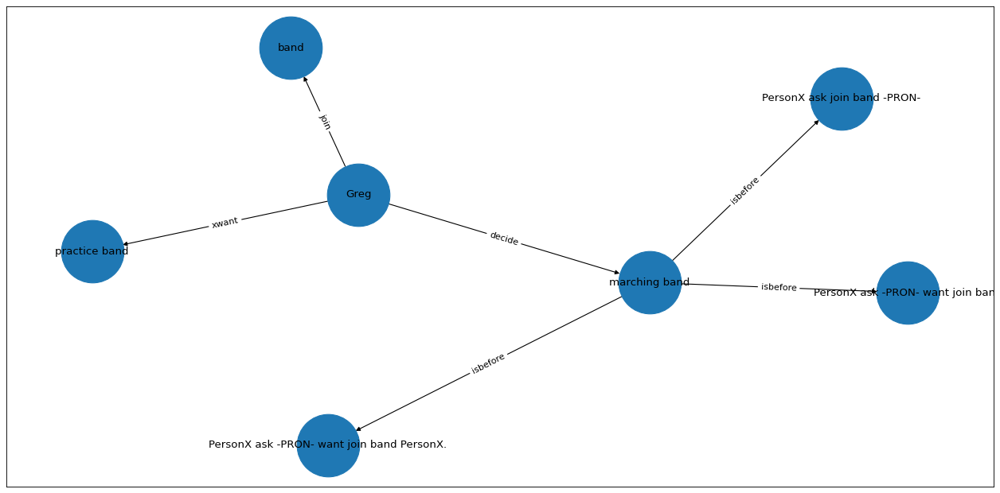

49it [00:19,  2.85it/s]

Lisa PROPN
[['Lisa', 'has', 'a beautiful sapphire ring']]


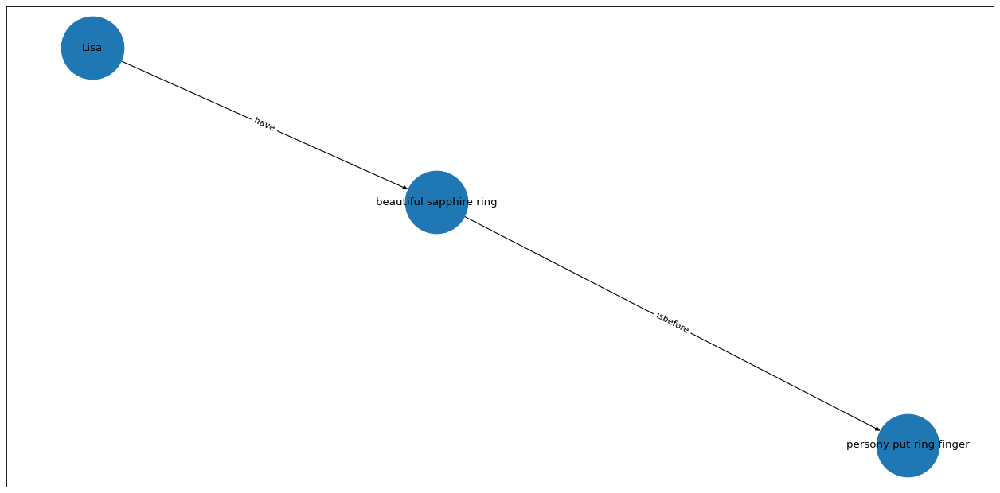

50it [00:19,  3.25it/s]

It PRON
It PRON
[['It', 'was', 'usually'], ['It', 'was', 'hot']]


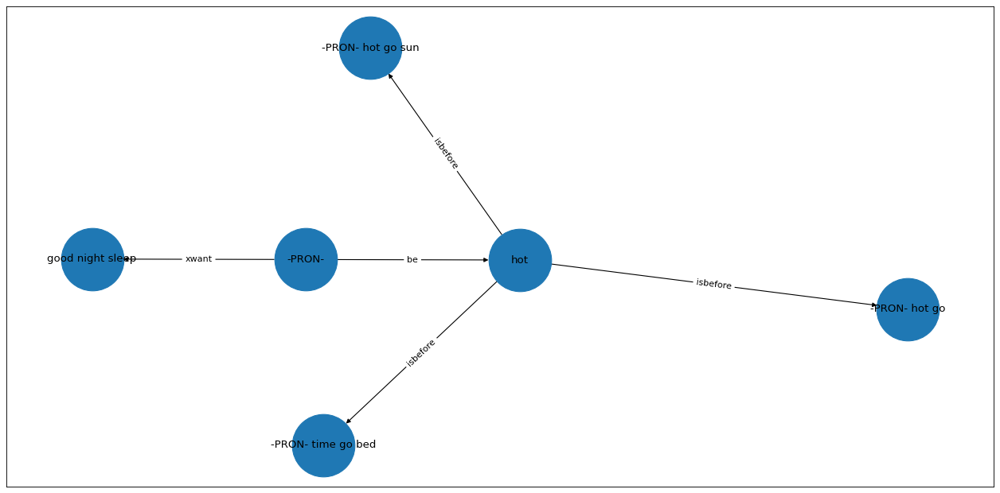

51it [00:19,  3.28it/s]

A DET
A DET
A DET
A DET
A DET
[['A bus driver', 'wanted', 'to save gas'], ['A bus driver', 'wanted', "so A bus driver did n't come to a full stop"], ['A bus driver', 'save', 'gas'], ['A bus driver', 'come', "n't"], ['A bus driver', 'come', 'to a full stop']]


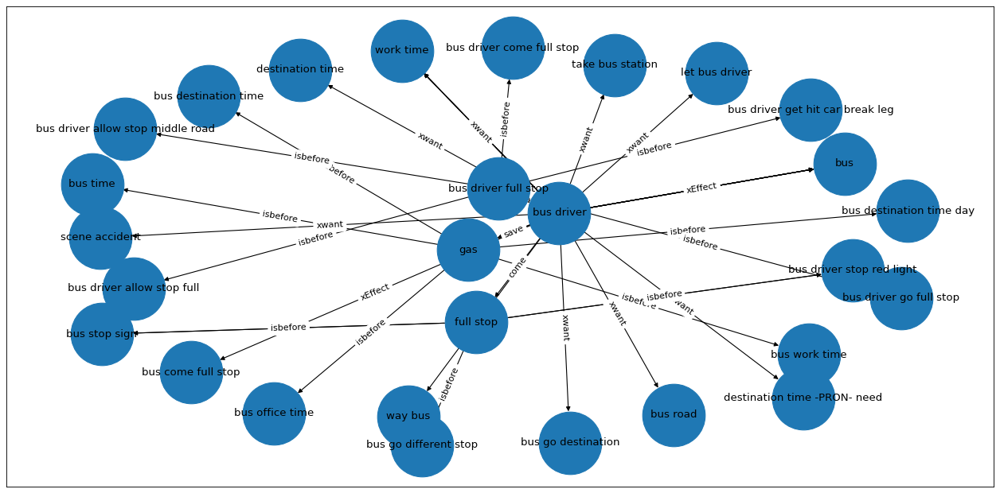

52it [00:20,  1.85it/s]

Gary PROPN
Gary PROPN
[['Gary', 'looking', 'through Gary fridge'], ['Gary', 'looking', 'for snacks']]


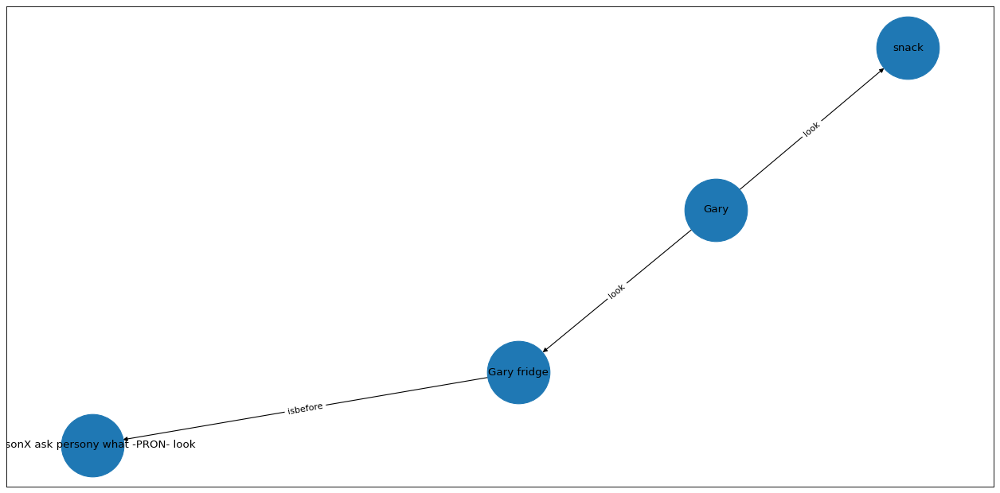

53it [00:21,  2.22it/s]

Natalie PROPN
[['Natalie', 'auditioned', 'for the lead in the school play']]


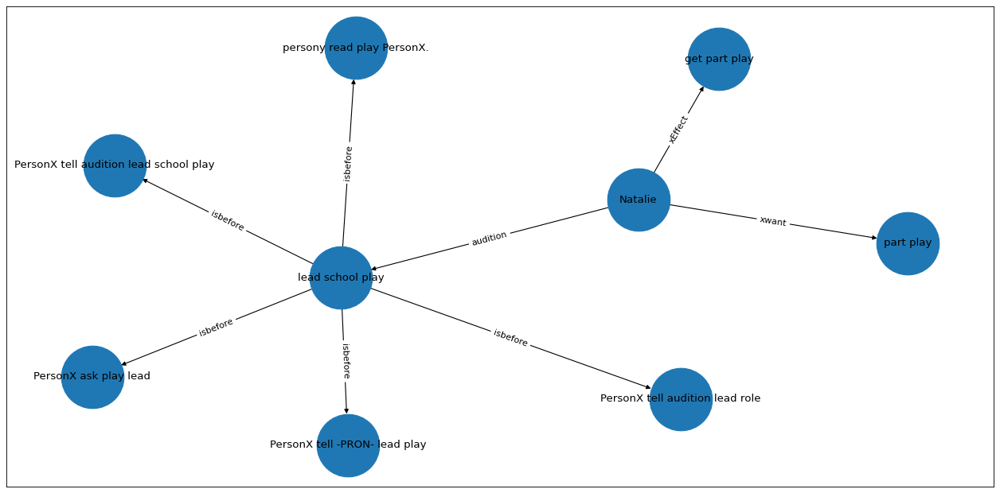

54it [00:21,  2.33it/s]

Mr PROPN
Mr PROPN
[['Mr Egg', 'presenting', 'a volcanic eruption'], ['Mr Egg', 'presenting', 'to the science class']]


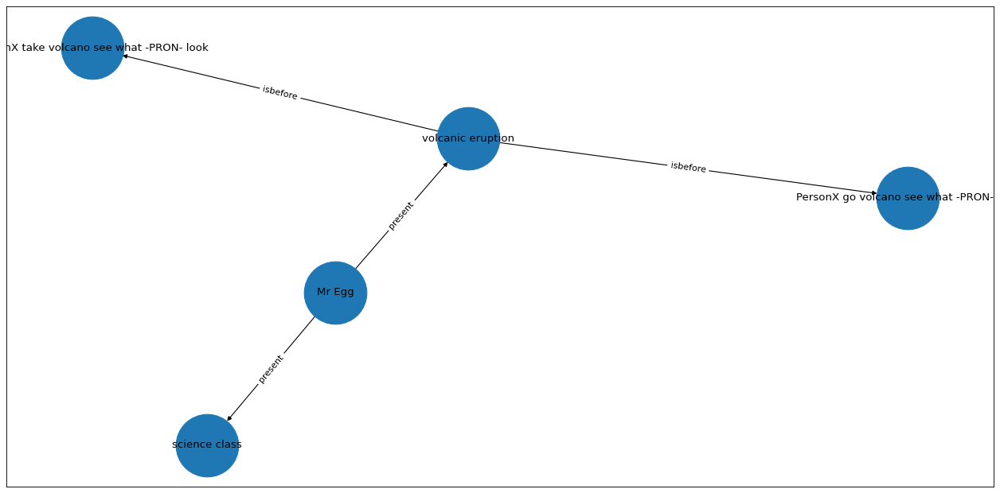

55it [00:21,  2.63it/s]

Samantha PROPN
Samantha PROPN
Samantha PROPN
Samantha PROPN
Samantha PROPN
[["Samantha 's dad", 'taught', 'always'], ["Samantha 's dad", 'taught', "Samantha 's dad"], ["Samantha 's dad", 'taught', 'how to be self - sufficient'], ["Samantha 's dad", 'be', 'how'], ["Samantha 's dad", 'be', 'self - sufficient']]


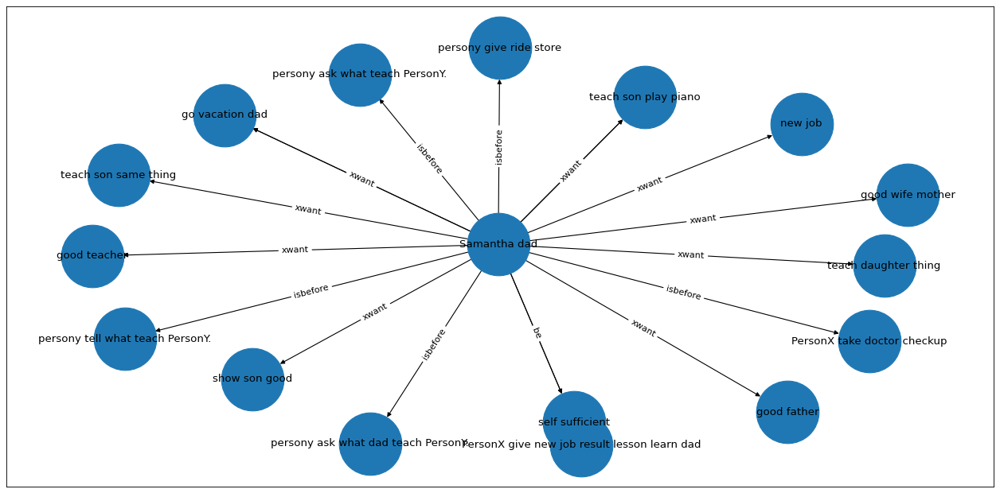

56it [00:22,  2.08it/s]

a DET
a DET
[['a pig', 'wandered', 'One day'], ['a pig', 'wandered', 'onto my parents farm']]


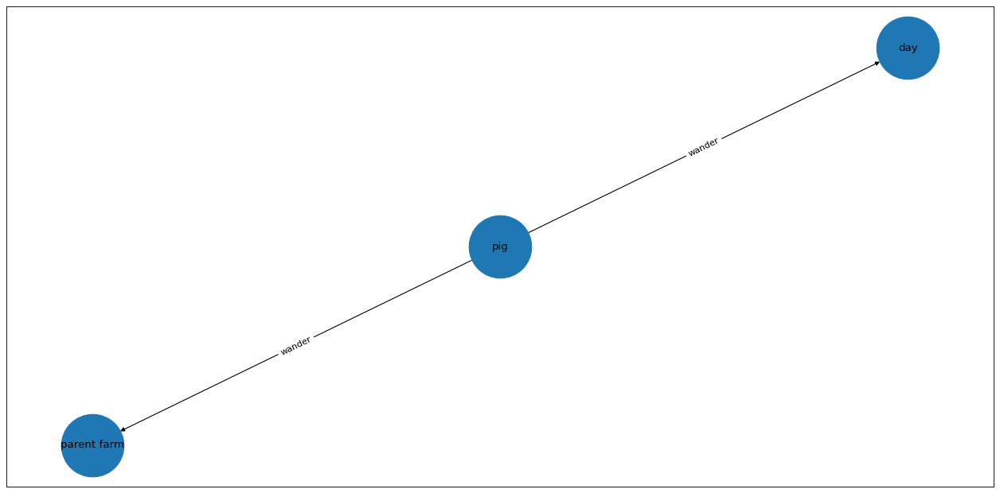

57it [00:22,  2.34it/s]

Jane PROPN
Jane PROPN
Jane PROPN
Jane PROPN
[['Jane', 'passed', 'a small park - like zoo Jane remembered visiting as a child'], ['Jane', 'remembered', 'visiting as a child'], ['Jane', 'visiting', 'a small park - like zoo'], ['Jane', 'visiting', 'as a child']]


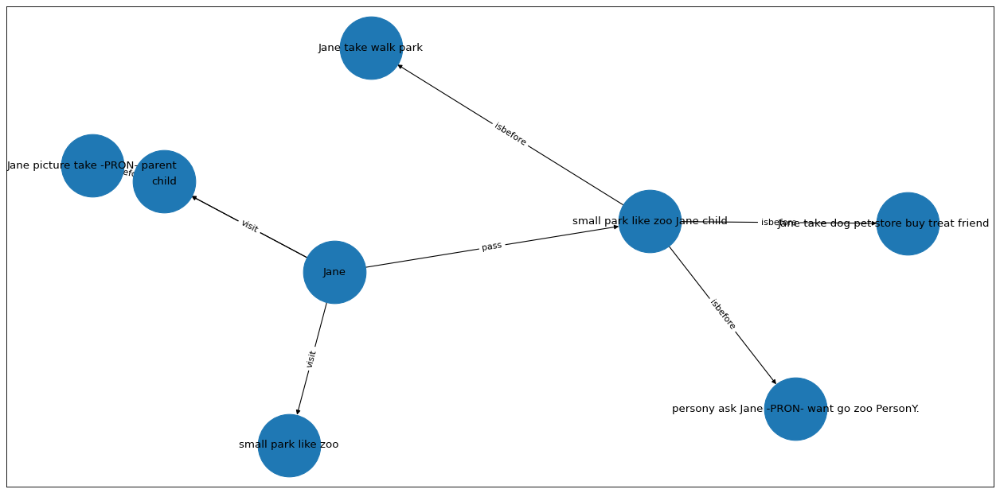

58it [00:23,  2.43it/s]

[]


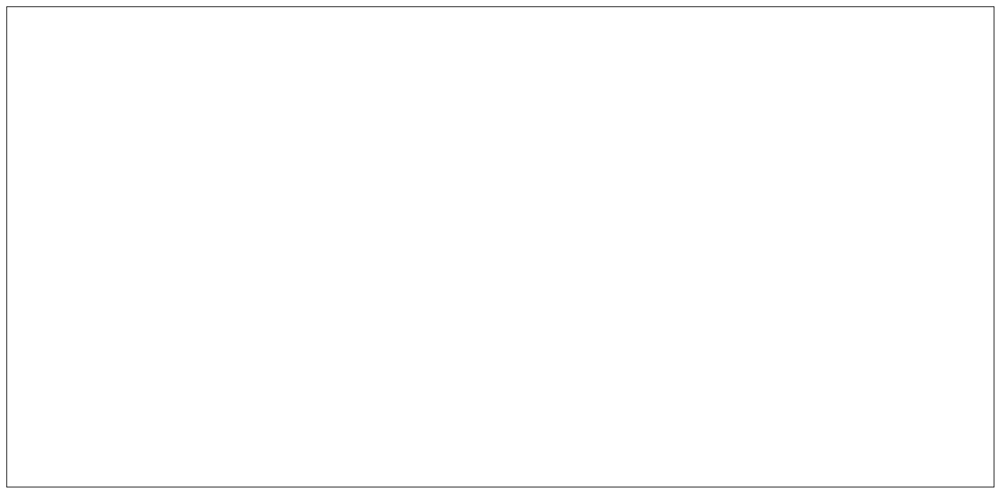

59it [00:23,  3.11it/s]

Jill PROPN
Jill PROPN
Jill PROPN
[['Jill', 'was', 'excited to ski'], ['Jill', 'was', 'for the first time'], ['Jill', 'ski', 'for the first time']]


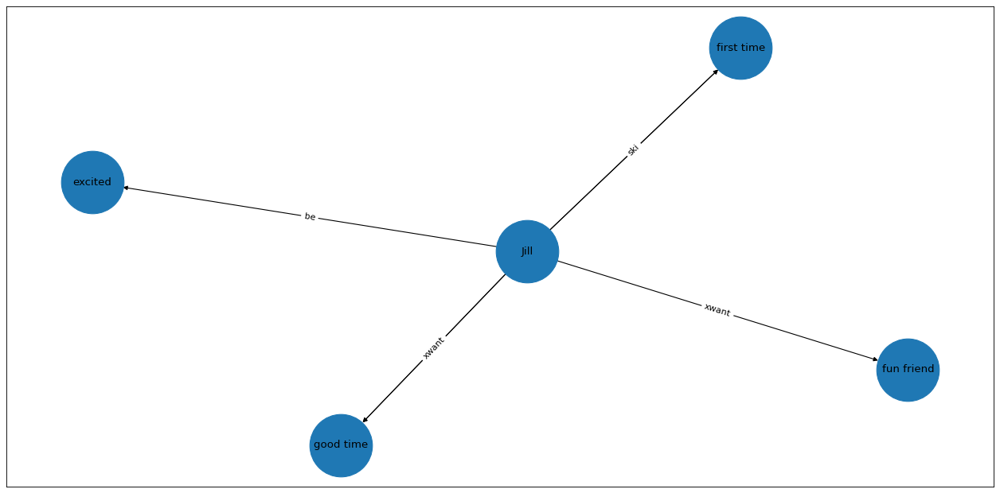

60it [00:23,  3.19it/s]

Mark PROPN
Mark PROPN
[['Mark', 'likes', 'to play guitar'], ['Mark', 'play', 'guitar']]


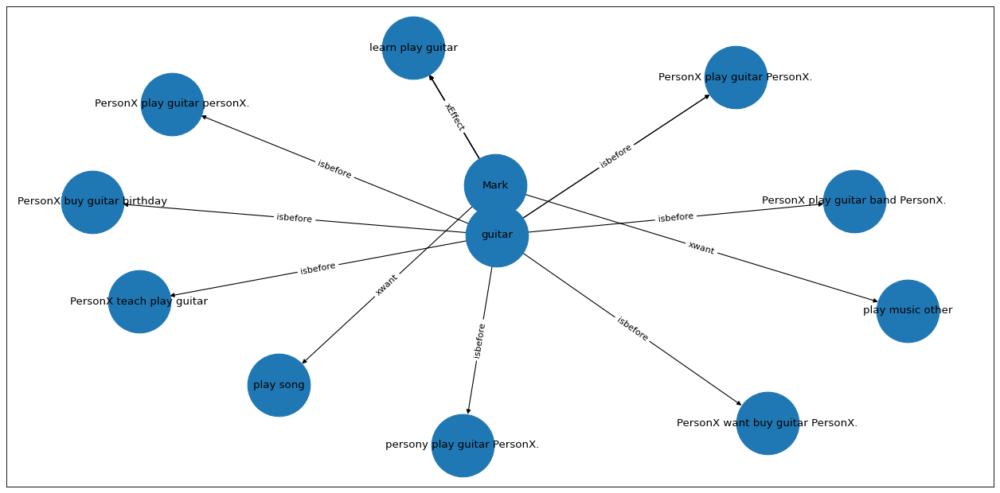

61it [00:24,  2.66it/s]

Billy PROPN
[["Billy 's car", 'broke', 'on the highway']]


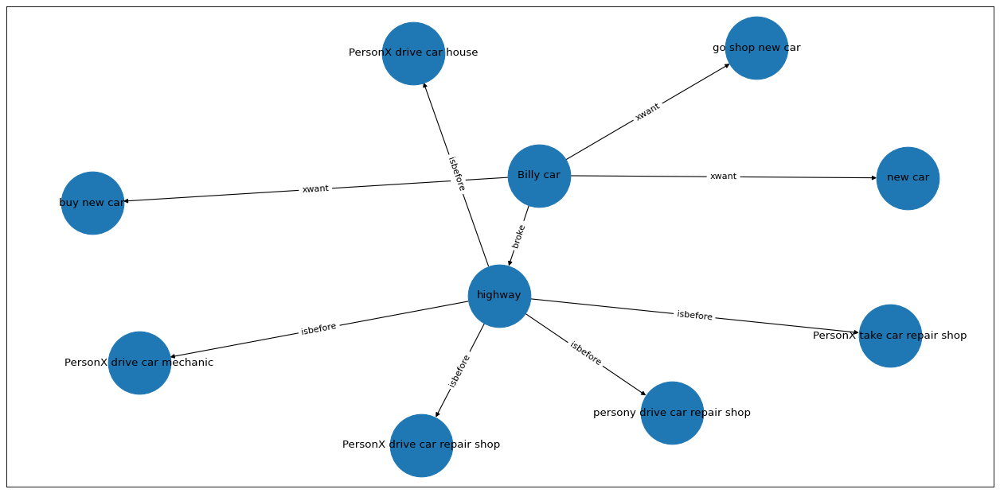

62it [00:24,  2.63it/s]

Frankie PROPN
[['Frankie', 'had', 'Christmas shopping to do']]


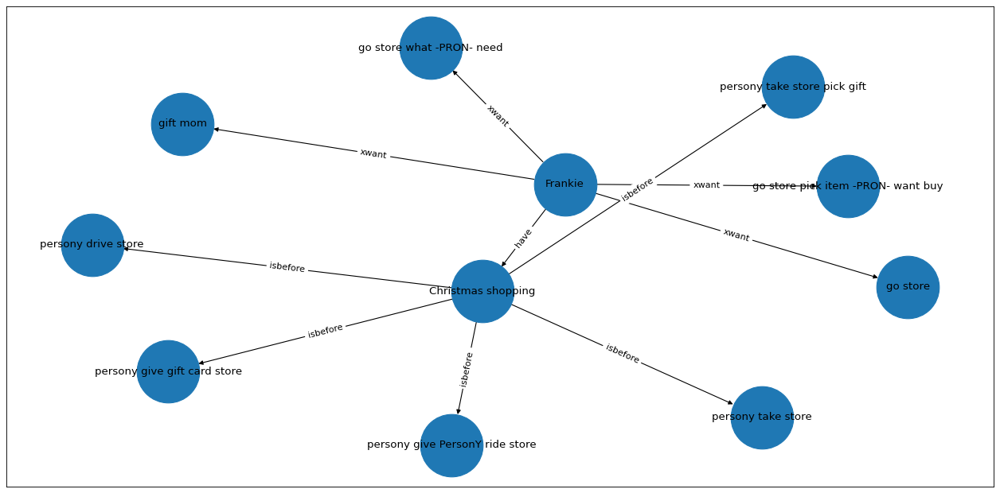

63it [00:24,  2.54it/s]

Rex PROPN
Rex PROPN
[['Rex', 'given', 'on any dreams of becoming a father'], ['Rex', 'becoming', 'a father']]


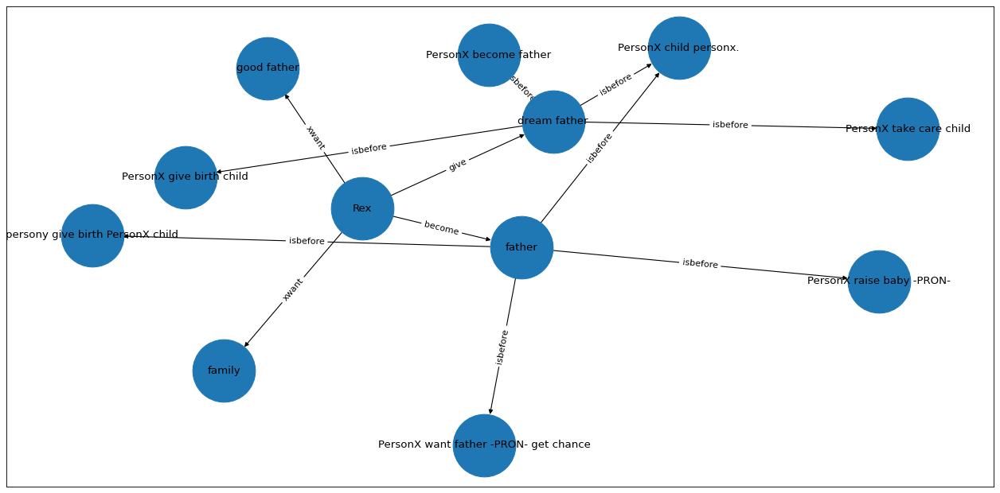

64it [00:25,  2.41it/s]

Laura PROPN
Laura PROPN
[['Laura', 'graduated', 'just'], ['Laura', 'graduated', 'college']]


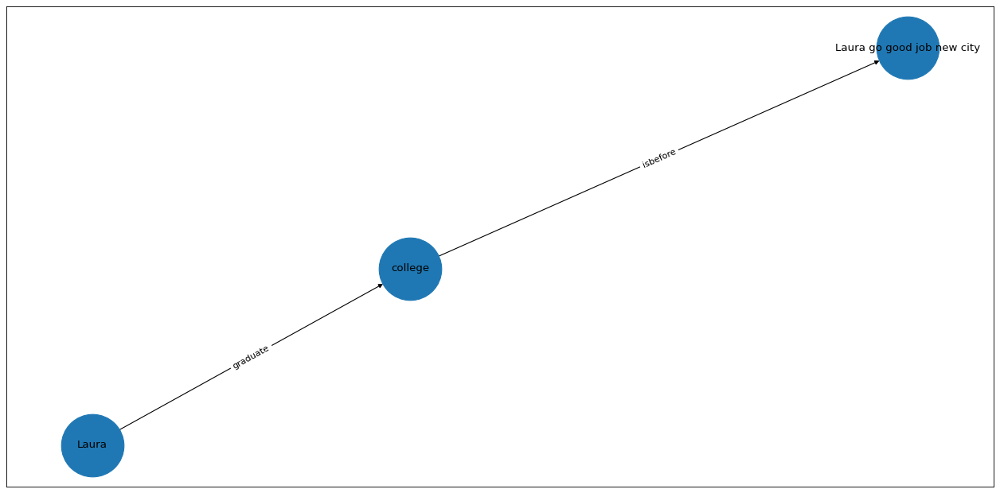

65it [00:25,  2.82it/s]

Mia PROPN
Mia PROPN
Mia PROPN
[['Mia', 'sat', 'at home in Mia living room'], ['Mia', 'sat', 'watching sports'], ['Mia', 'watching', 'sports']]


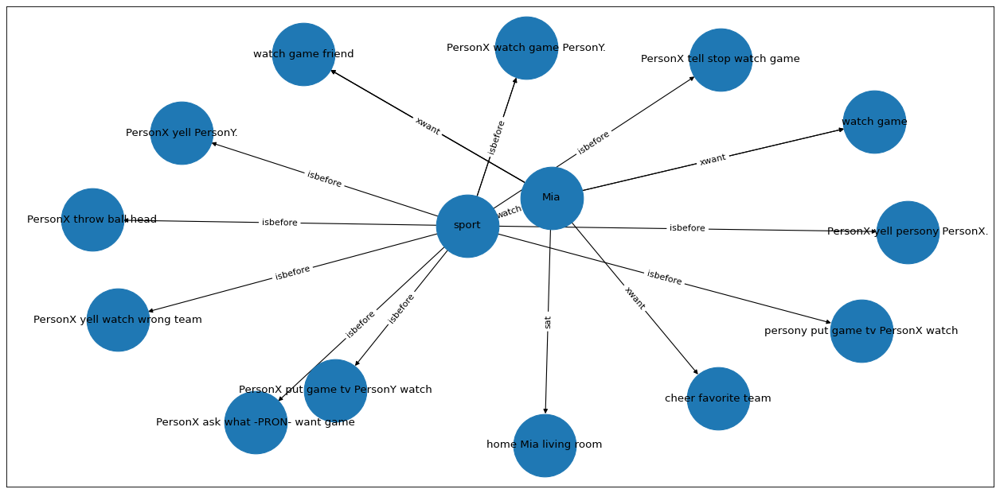

66it [00:26,  2.34it/s]

Shannon PROPN
[['Shannon', 'driving', 'in the highway']]


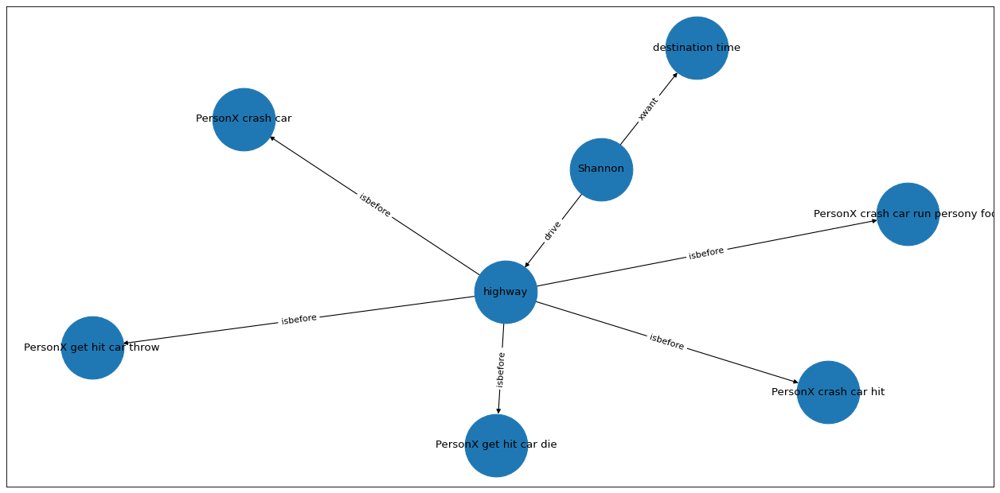

67it [00:26,  2.48it/s]

Nate VERB
Nate VERB
Nate VERB
Nate VERB
[['Nate', 'stop', 'could'], ['Nate', 'stop', "n't"], ['Nate', 'stop', 'calling Diana'], ['Nate', 'calling', 'Diana']]


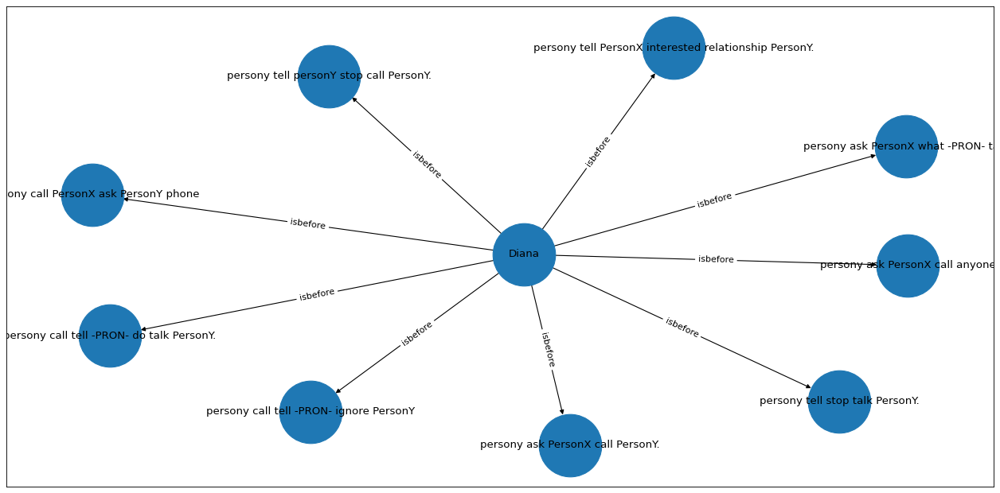

68it [00:27,  2.20it/s]

Sandy PROPN
Sandy PROPN
Sandy PROPN
[['Sandy', 'spent', 'After her divorce'], ['Sandy', 'spent', 'a lot of time'], ['Sandy', 'spent', 'alone']]


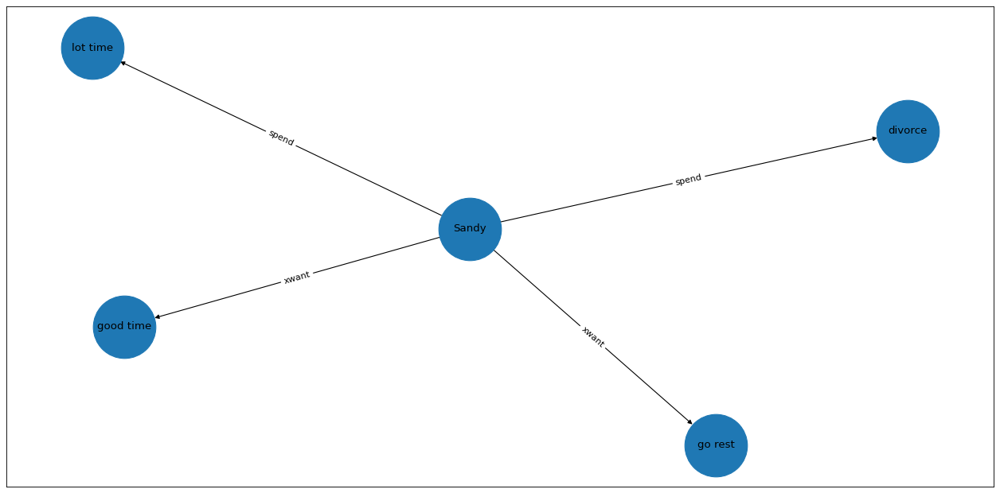

69it [00:27,  2.36it/s]

Bogart PROPN
[['Bogart', 'lived', 'on a farm']]


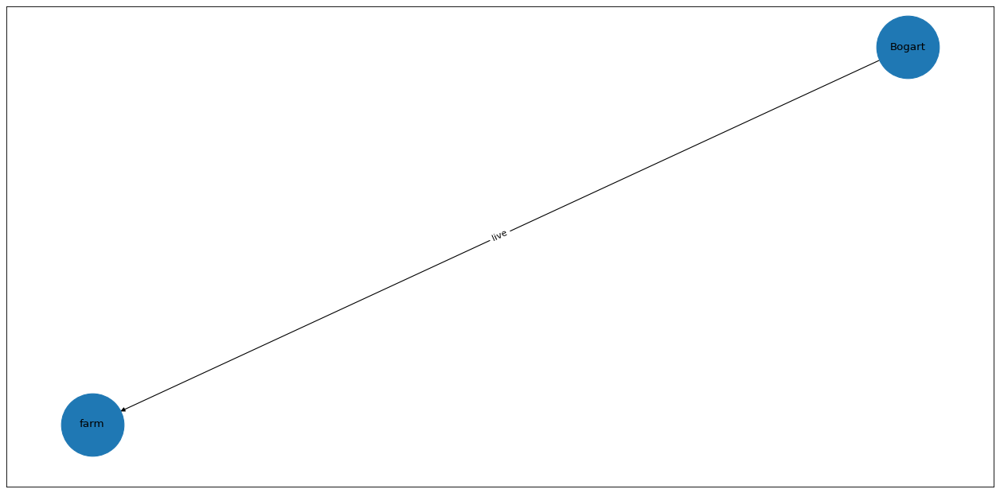

70it [00:27,  2.87it/s]

The DET
[['The preschoolers', 'going', 'on a field trip']]


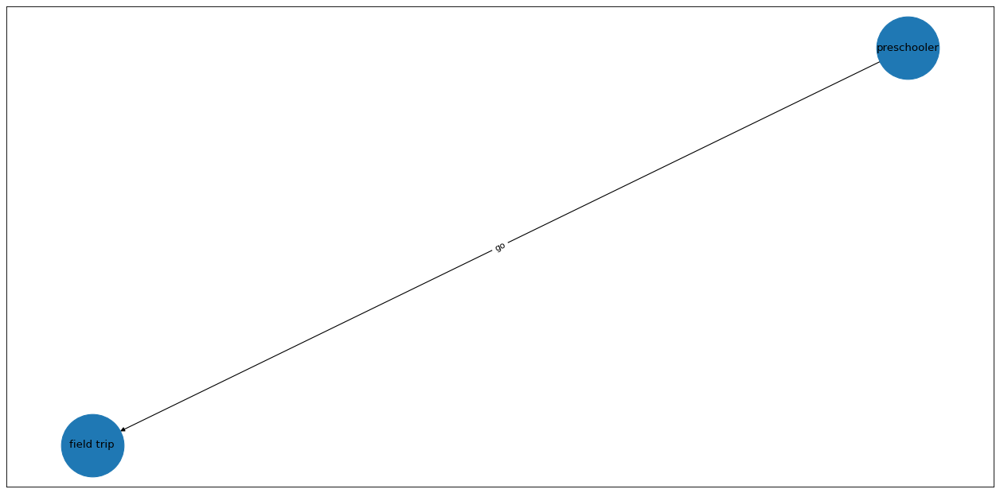

71it [00:27,  3.07it/s]

Gina PROPN
Gina PROPN
[["Gina 's crush", 'sat', 'behind Gina'], ["Gina 's crush", 'sat', 'in class']]


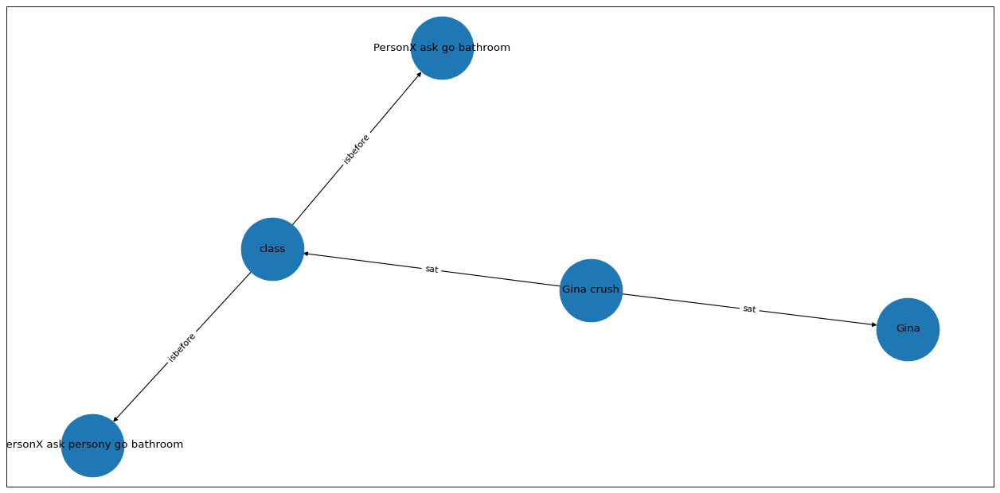

72it [00:28,  3.26it/s]

Olivia PROPN
[['Olivia', 'was', 'a ballerina']]


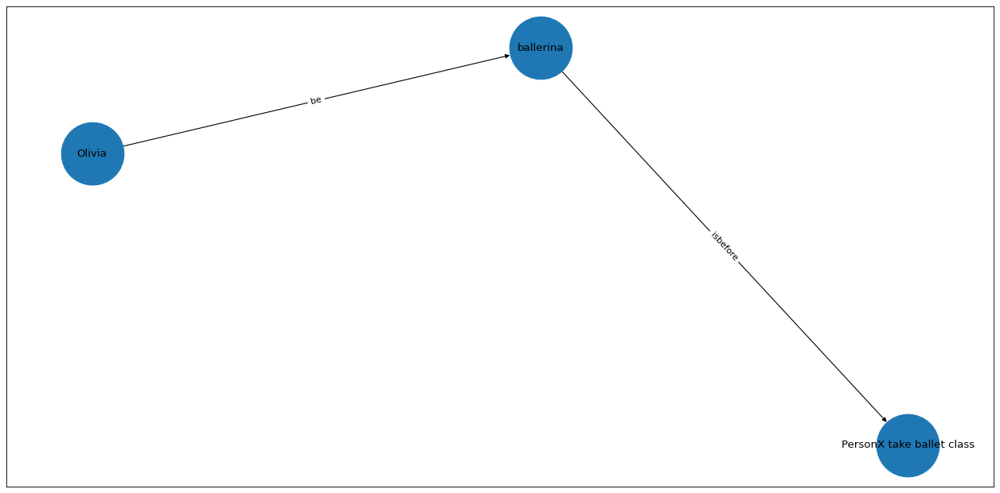

73it [00:28,  3.62it/s]

Tim PROPN
[['Tim', 'was', 'a salesman']]


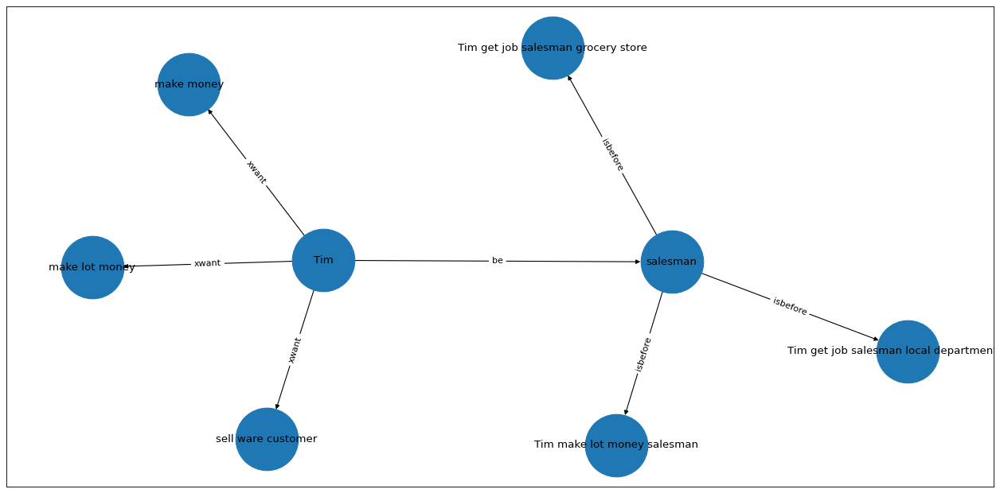

74it [00:28,  3.38it/s]

Today NOUN
everyone PRON
everyone PRON
[['Today', 'was', 'April Fools Day'], ['everyone', 'played', 'pranks'], ['everyone', 'played', 'on each other']]


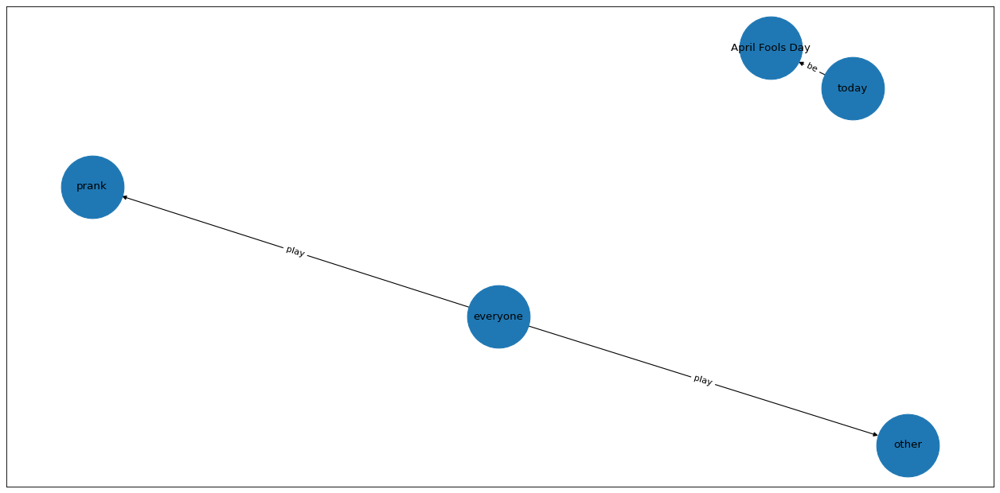

75it [00:28,  3.61it/s]

Betty PROPN
[['Betty', 'had', 'a craving for mint ice cream']]


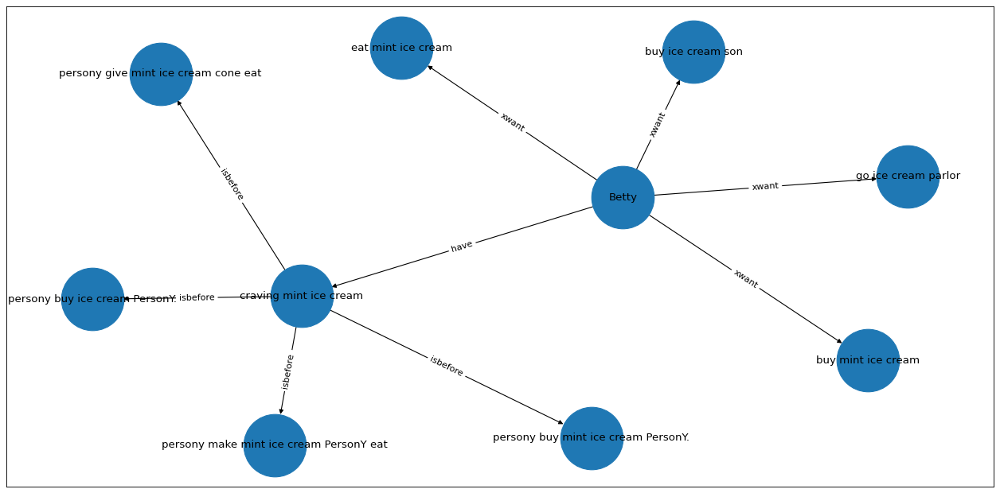

76it [00:29,  3.21it/s]

Cade PROPN
Cade PROPN
Cade PROPN
[['Cade', 'is', 'short'], ['Cade', 'gets', 'picked on at school'], ['Cade', 'picked', 'at school']]


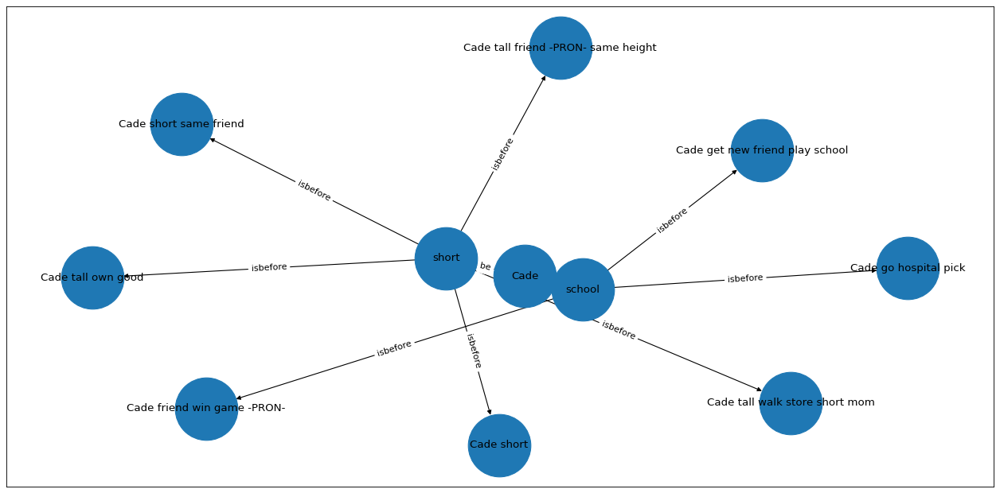

77it [00:29,  2.86it/s]

Amber PROPN
Amber PROPN
Amber PROPN
[['Amber', 'drove', 'home'], ['Amber', 'drove', 'from work'], ['Amber', 'drove', 'one night']]


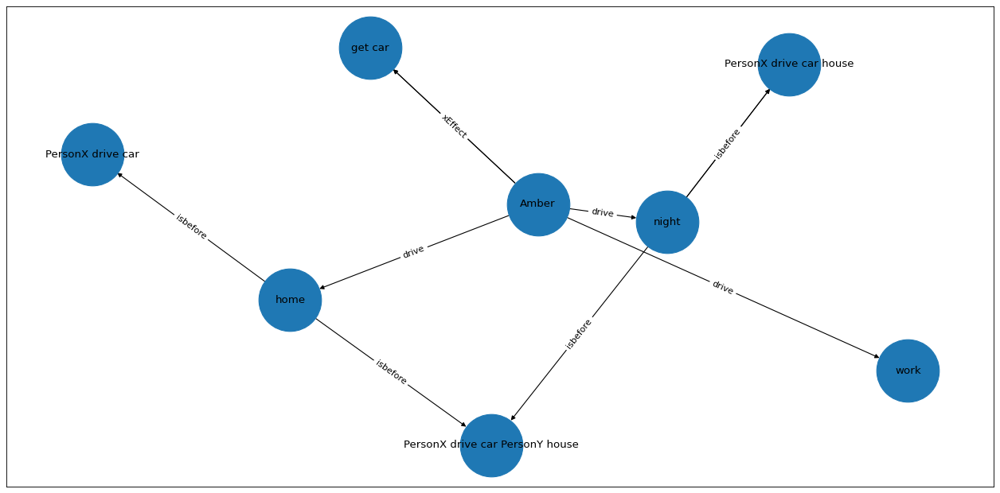

78it [00:30,  2.76it/s]

Erica PROPN
Erica PROPN
Erica PROPN
[['Erica', 'wanted', 'to help Erica mom this Thanksgiving'], ['Erica', 'help', 'Erica mom'], ['Erica', 'help', 'this Thanksgiving']]


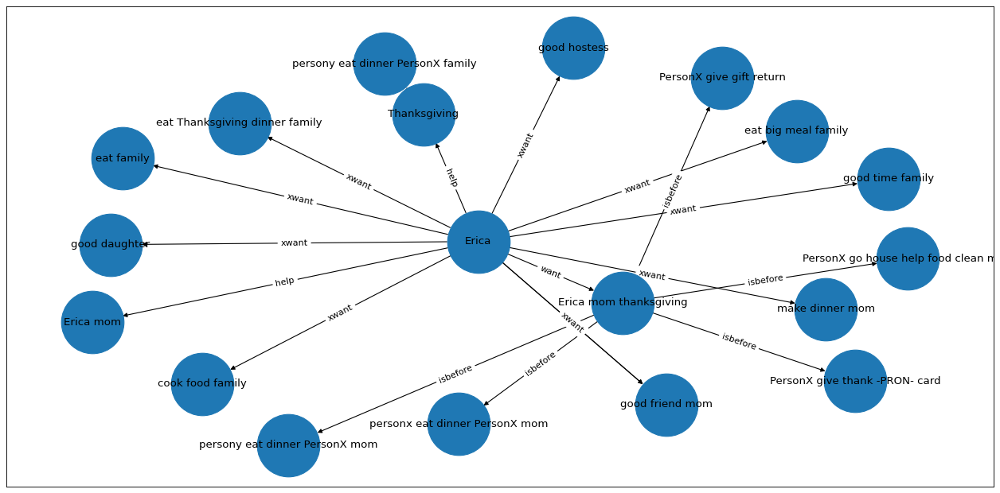

79it [00:30,  2.25it/s]

Ben PROPN
Ben PROPN
Ben PROPN
[['Ben', 'came', 'home'], ['Ben', 'came', 'one day'], ['Ben', 'found', 'a huge mess']]


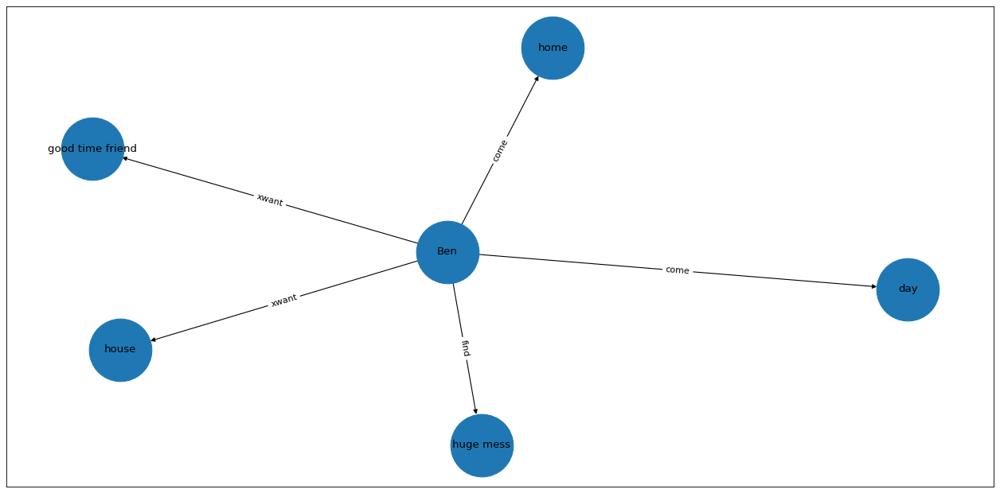

80it [00:31,  2.52it/s]

Sarah PROPN
[['Sarah', 'was', 'on a bus to Sarah work']]


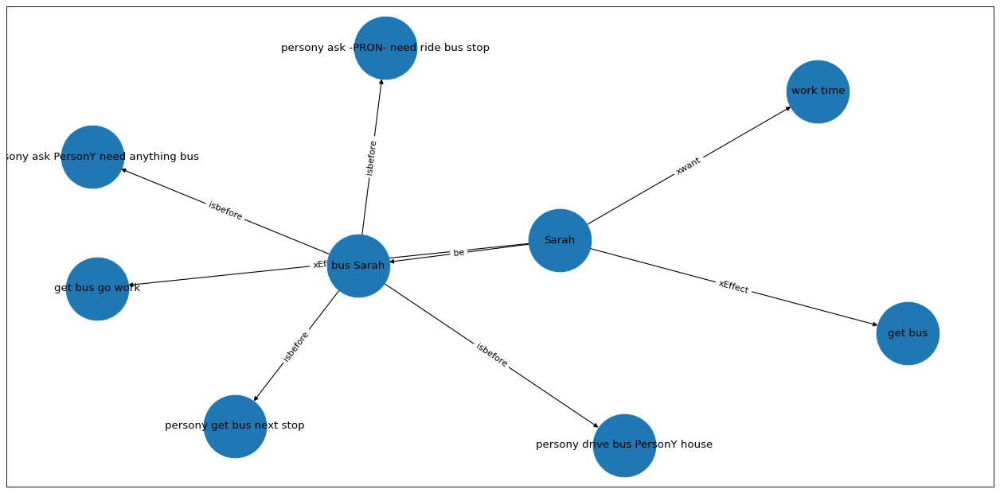

81it [00:31,  2.58it/s]

James PROPN
[['James', 'needed', 'a new pick up truck for work']]


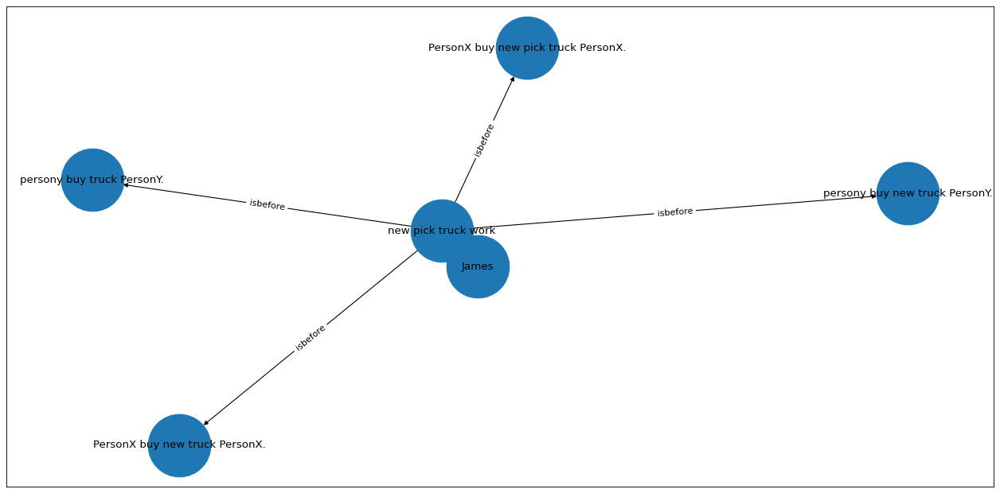

82it [00:31,  2.80it/s]

Susie NOUN
Susie NOUN
[['Susie', 'sells', 'the 31 products'], ['Susie', 'sells', 'for extra money']]


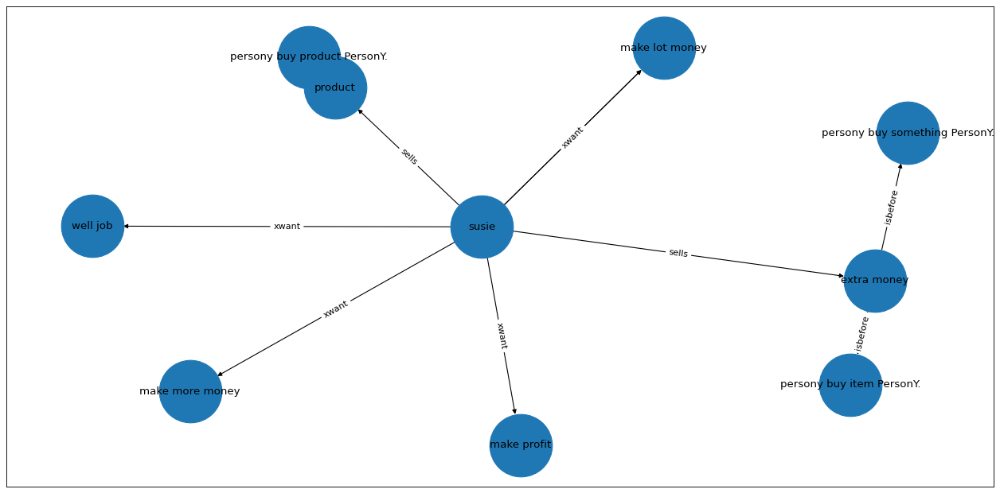

83it [00:32,  2.66it/s]

Mike PROPN
[['Mike', 'making', 'dinner']]


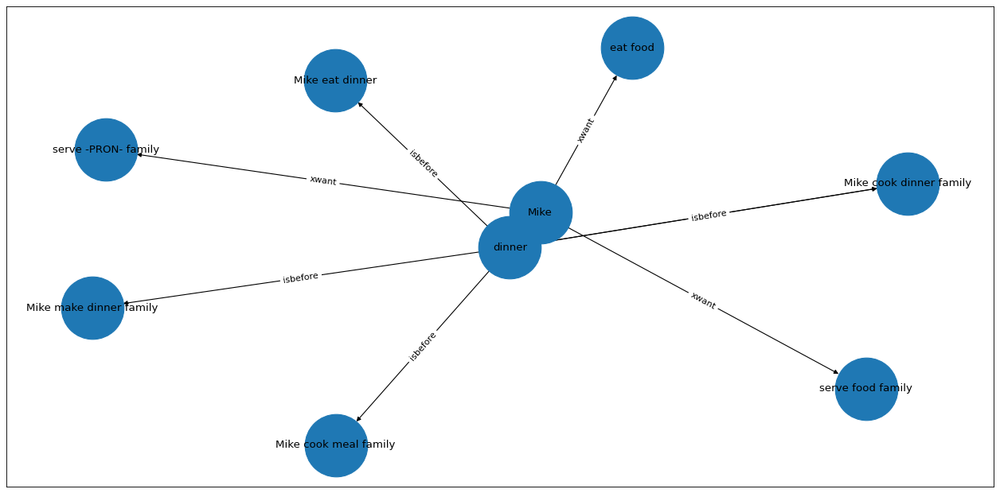

84it [00:32,  2.64it/s]

a DET
a DET
[['a lot of fighting', 'was', 'Today'], ['a lot of fighting', 'was', 'on the view']]


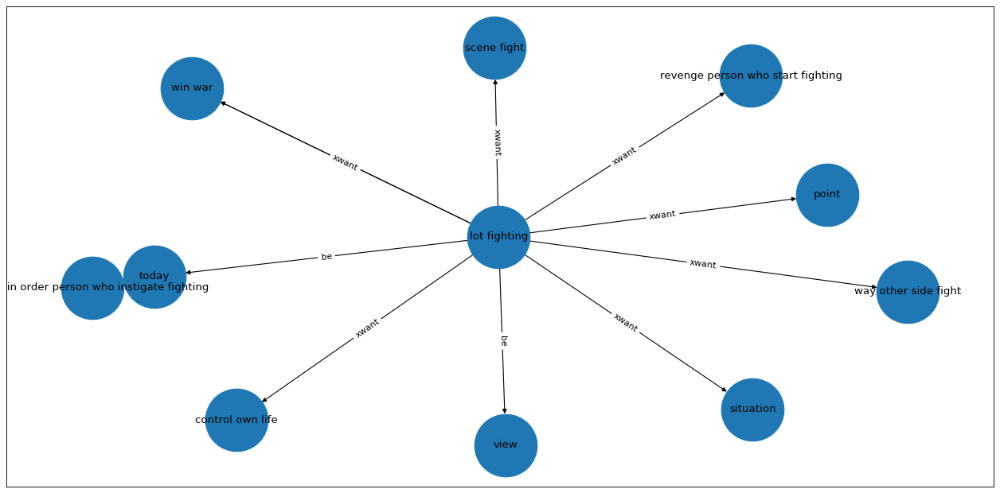

85it [00:33,  2.40it/s]

Elliott PROPN
[['Elliott and Tim', 'were', 'on a high school tennis team']]


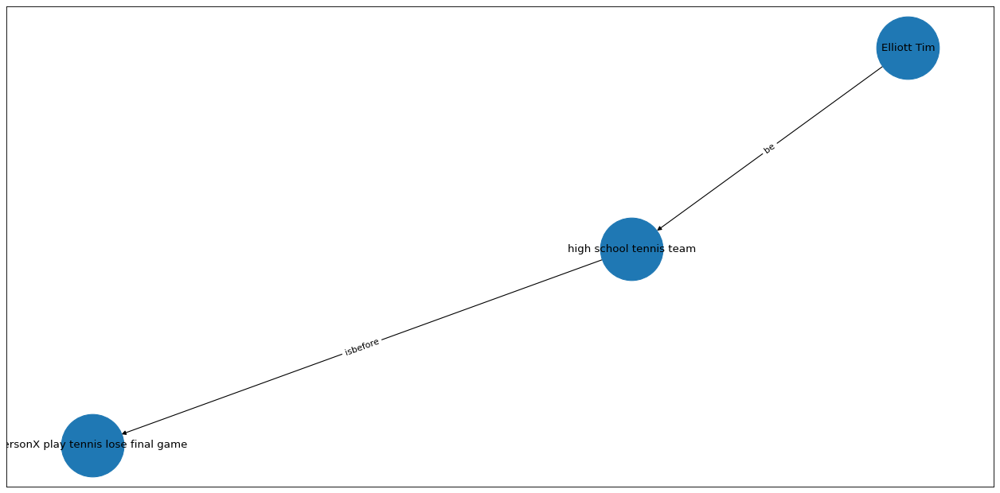

86it [00:33,  2.82it/s]

I PRON
I PRON
[['I', 'saw', 'Today'], ['I', 'saw', 'a woman with a baby']]


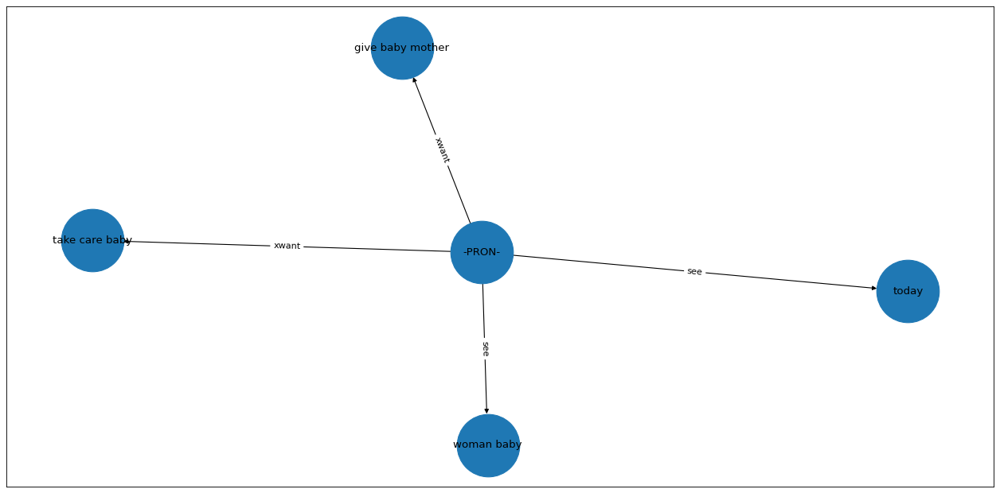

87it [00:33,  3.10it/s]

Louisa PROPN
[['Louisa and Louisa family', 'took', 'a trip to Epcot']]


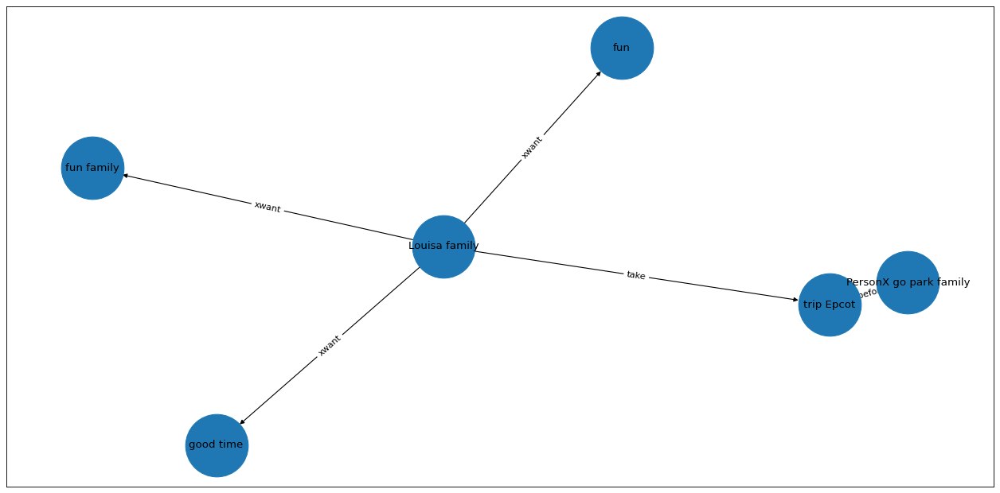

88it [00:33,  3.23it/s]

Joanie PROPN
Joanie PROPN
[["Joanie 's mom", 'signed', "Joanie 's mom"], ["Joanie 's mom", 'signed', 'for swimming lessons at a lake']]


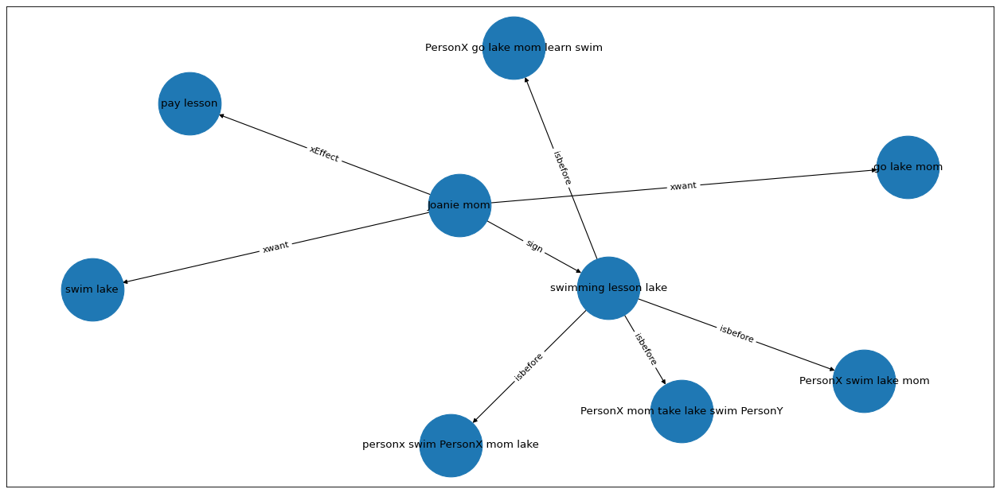

89it [00:34,  3.00it/s]

I PRON
I PRON
I PRON
[['I', 'tried', 'to start jogging last week'], ['I', 'start', 'jogging'], ['I', 'start', 'last week']]


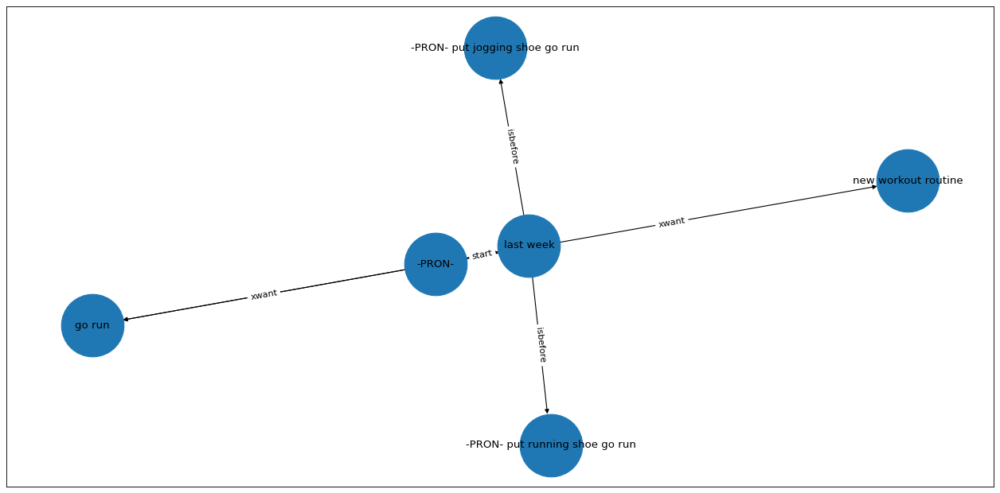

90it [00:34,  2.95it/s]

John PROPN
John PROPN
[['John', 'woke', 'sick'], ['John', 'woke', 'today']]


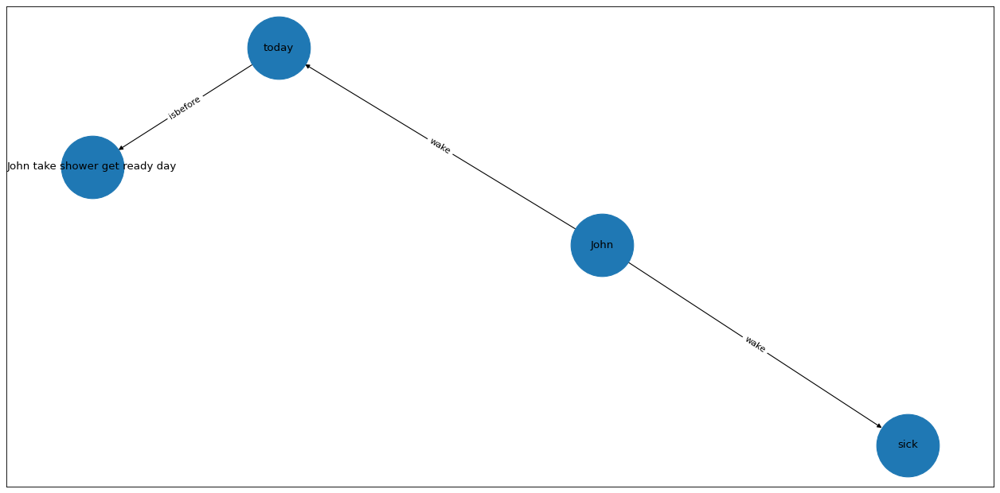

91it [00:34,  3.28it/s]

Tyrese ADJ
[['Tyrese', 'joined', 'a new gym']]


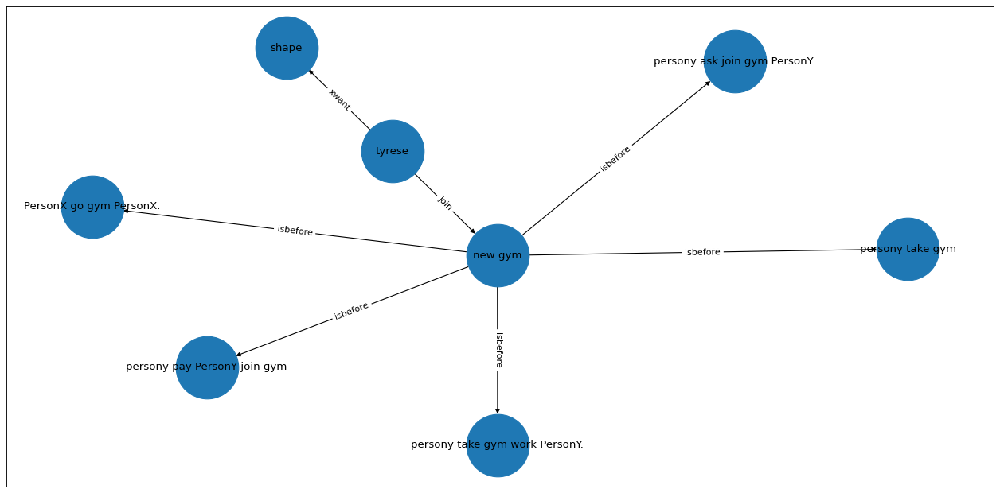

92it [00:35,  3.15it/s]

Ryder PROPN
Ryder PROPN
[['Ryder', 'needed', 'to go outside'], ['Ryder', 'go', 'outside']]


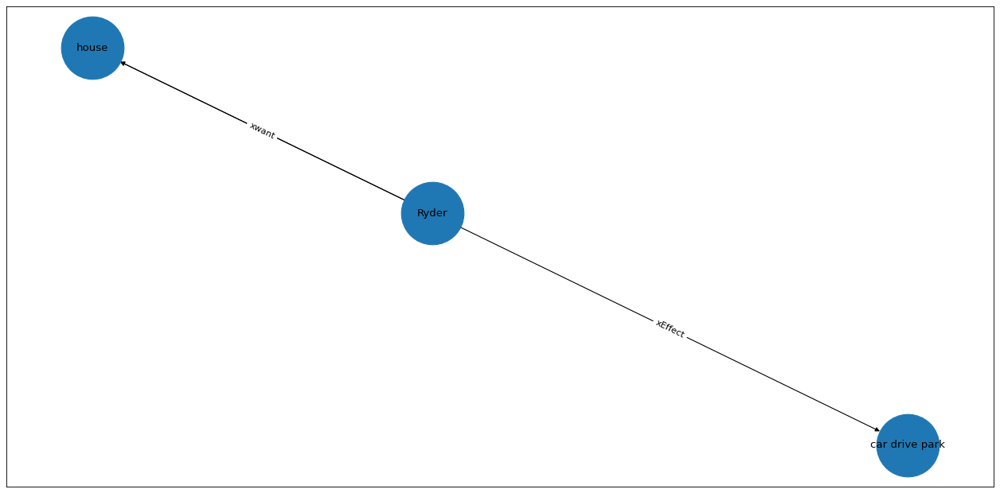

93it [00:35,  3.13it/s]

Jimmy PROPN
Jimmy PROPN
[['Jimmy', 'became', 'just'], ['Jimmy', 'became', 'a police officer in Chicago']]


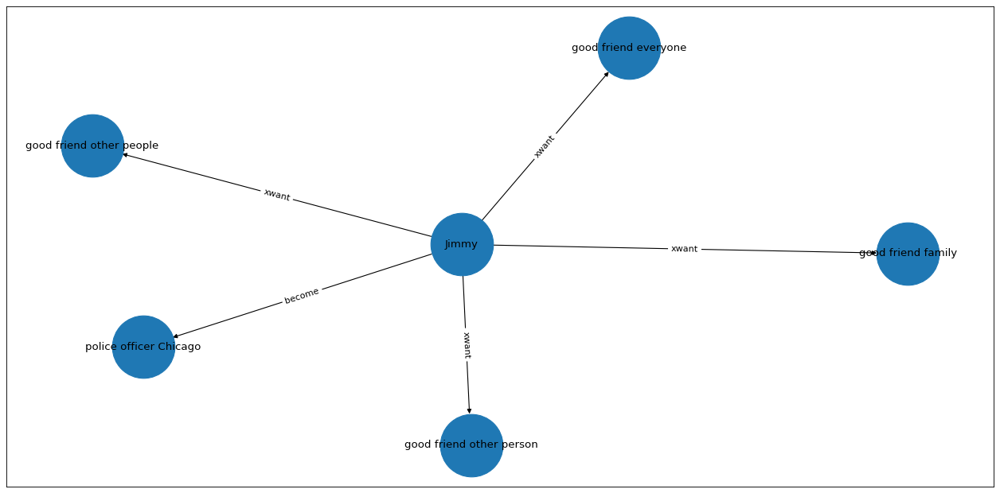

94it [00:35,  3.11it/s]

Tony PROPN
Tony PROPN
Tony PROPN
Tony PROPN
[['Tony', 'needed', 'to get gas on Tony way home'], ['Tony', 'get', 'gas'], ['Tony', 'get', 'on Tony'], ['Tony', 'get', 'way home']]


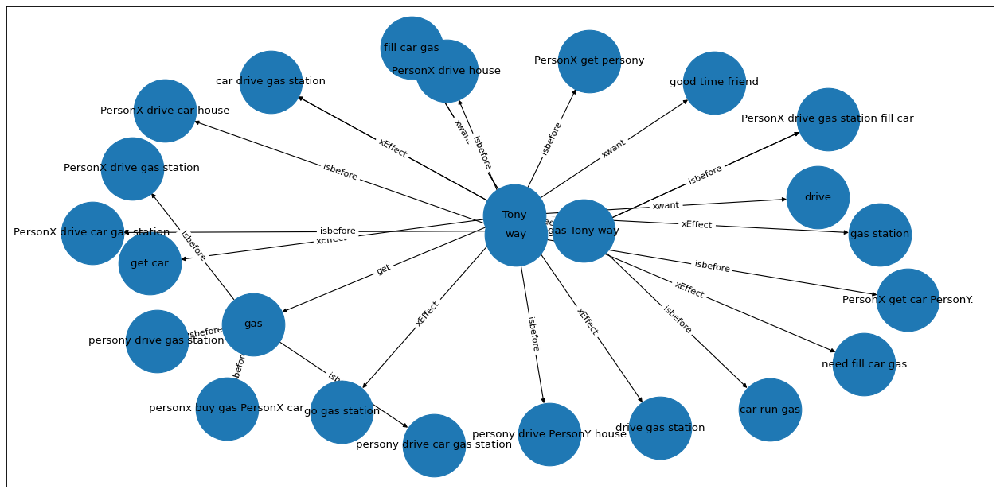

95it [00:36,  2.12it/s]

Taylor PROPN
Taylor PROPN
a DET
[['Taylor', 'started', 'working for a man named Mark'], ['Taylor', 'working', 'for a man named Mark'], ['a man', 'named', 'Mark']]


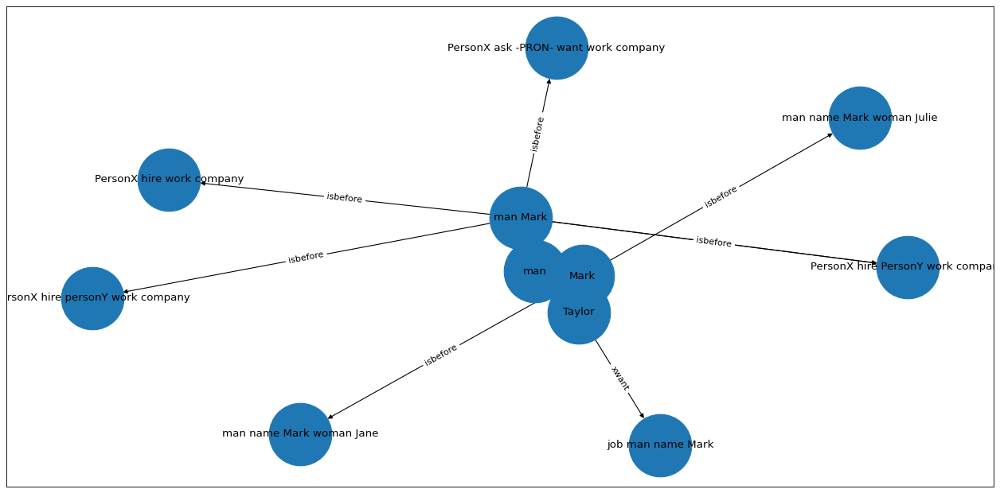

96it [00:36,  2.17it/s]

We PRON
We PRON
[['We', 'moved', 'from We condo'], ['We', 'moved', 'in 2013']]


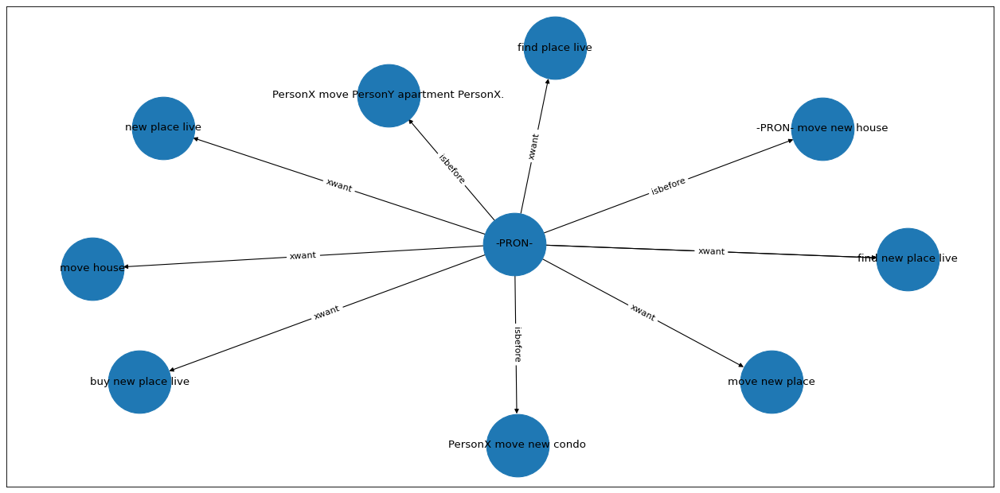

97it [00:37,  2.16it/s]

The DET
The DET
[['The girl', 'was', 'scared to go outside'], ['The girl', 'go', 'outside']]


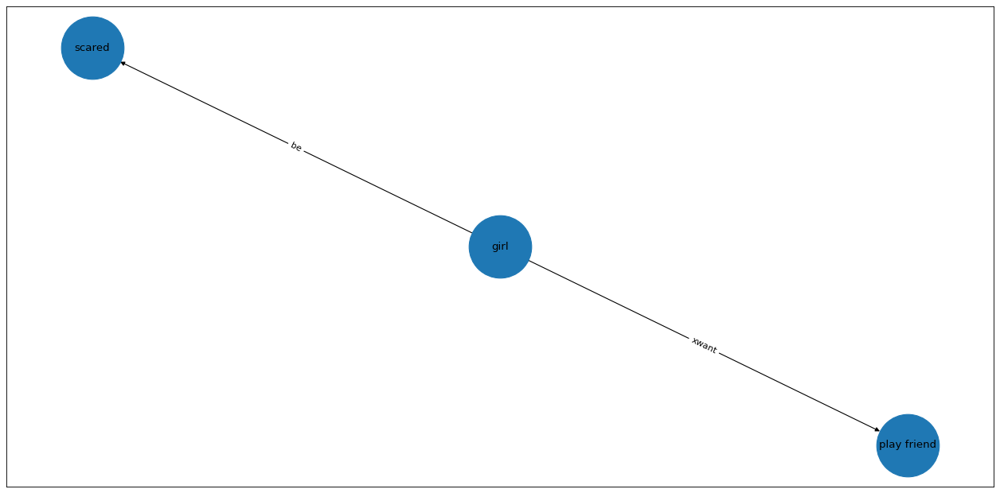

98it [00:37,  2.56it/s]

Trevor PROPN
Trevor PROPN
[['Trevor and Trevor wife', 'were', 'at home'], ['Trevor and Trevor wife', 'were', 'on Trevor day off']]


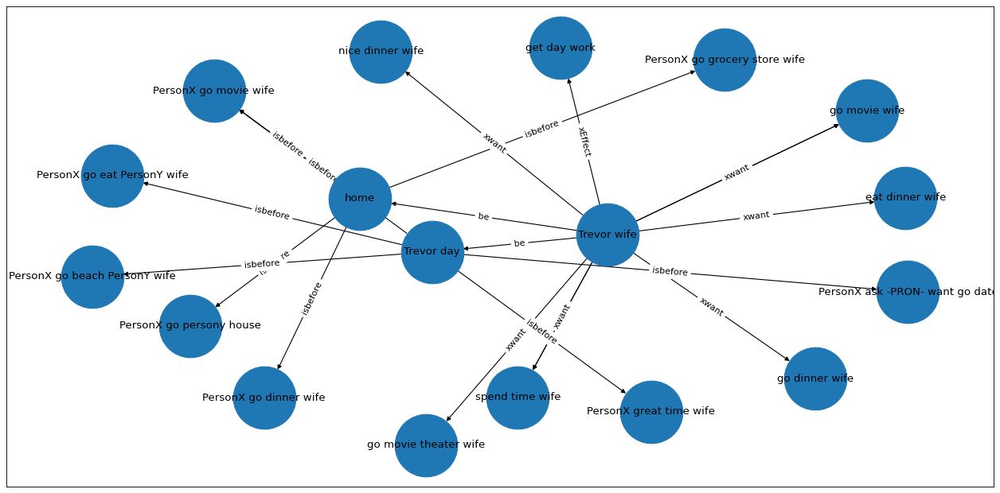

99it [00:38,  2.01it/s]

Sally PROPN
Sally PROPN
[['Sally', 'decided', 'to get a haircut'], ['Sally', 'get', 'a haircut']]


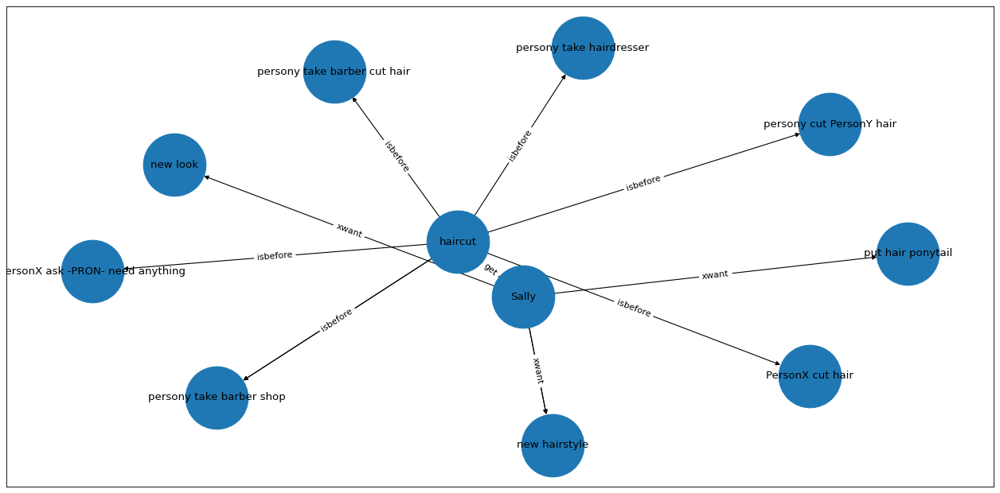

100it [00:38,  2.05it/s]

kyle PROPN
kyle PROPN
[["kyle 's mom", 'been', 'in the military'], ["kyle 's mom", 'was', "very proud of kyle 's mom"]]


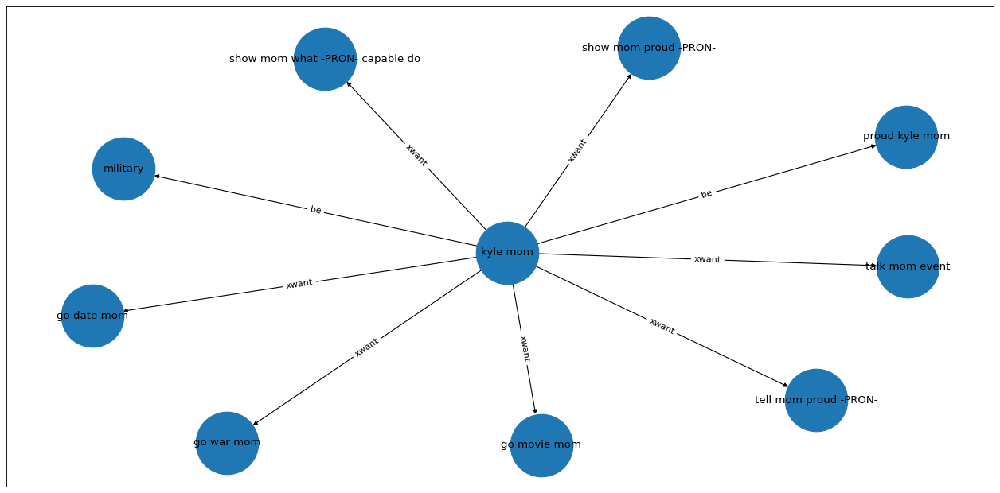

101it [00:39,  2.19it/s]

[]


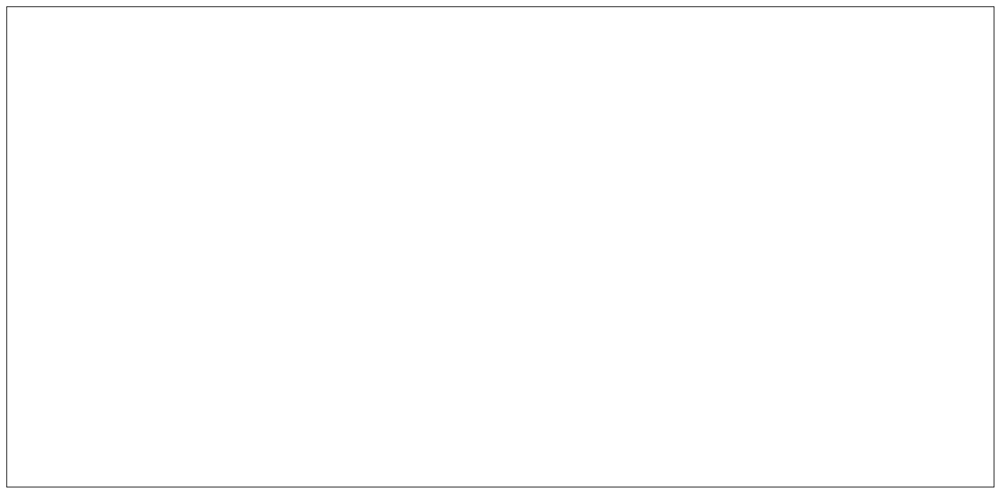

102it [00:39,  2.82it/s]

I PRON
I PRON
I PRON
[['I', 'watched', 'This year'], ['I', 'watched', 'the NBA dunk contest'], ['I', 'watched', 'with my friends']]


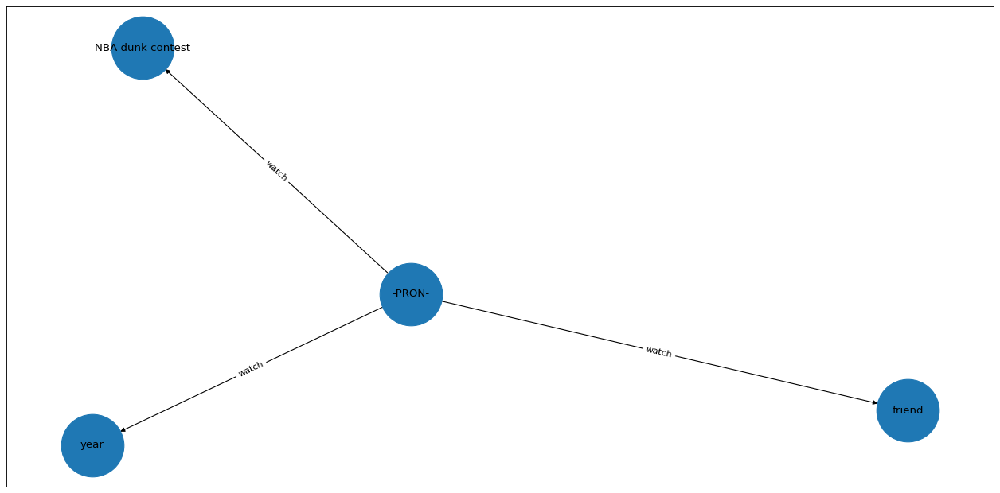

103it [00:39,  3.11it/s]

It PRON
[['It', 'was', "Tyler 's first day of Kindergarten"]]


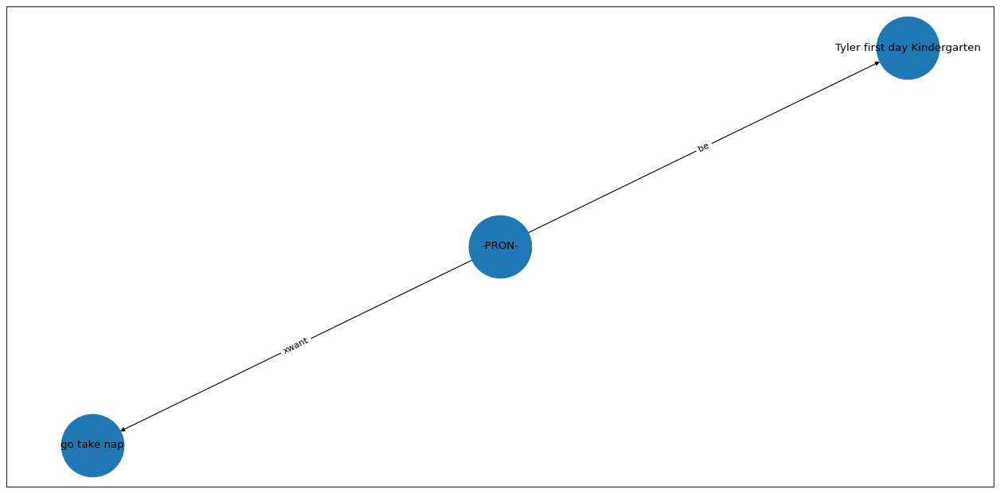

104it [00:39,  3.50it/s]

Gloria PROPN
Gloria PROPN
[['Gloria', 'wanted', 'to find a special new dress for Gloria anniversary dinner'], ['Gloria', 'find', 'a special new dress for Gloria anniversary dinner']]


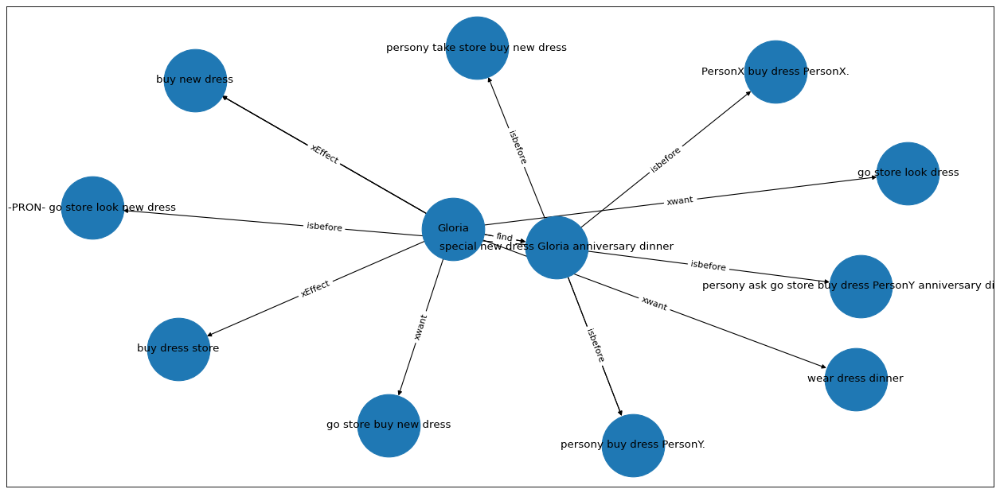

105it [00:40,  2.83it/s]

I PRON
I PRON
[['I', 'wanted', 'to run a computer program'], ['I', 'run', 'a computer program']]


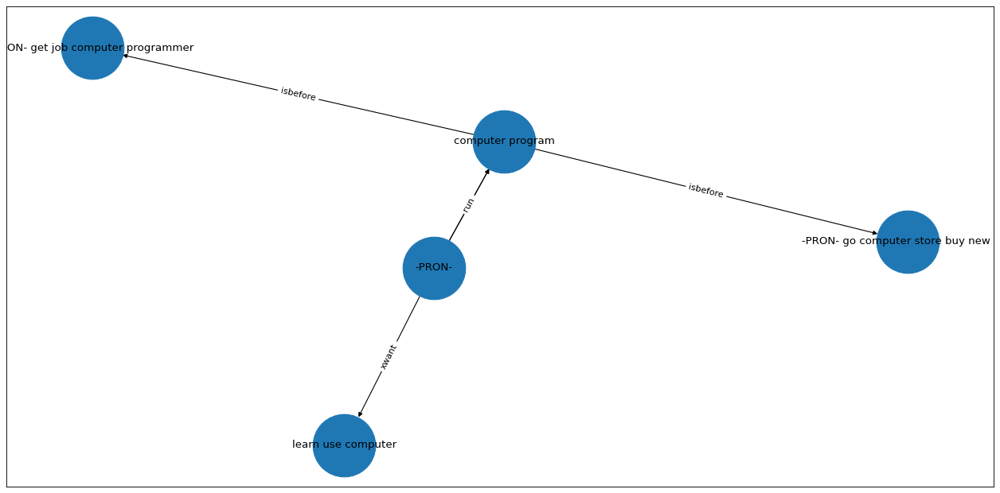

106it [00:40,  3.02it/s]

Roxy PROPN
Roxy PROPN
Roxy PROPN
Roxy PROPN
[['Roxy and Sam', 'had', 'everything Roxy and Sam needed to make a huge sand castle'], ['Roxy and Sam', 'needed', 'everything'], ['Roxy and Sam', 'needed', 'to make a huge sand castle'], ['Roxy and Sam', 'make', 'a huge sand castle']]


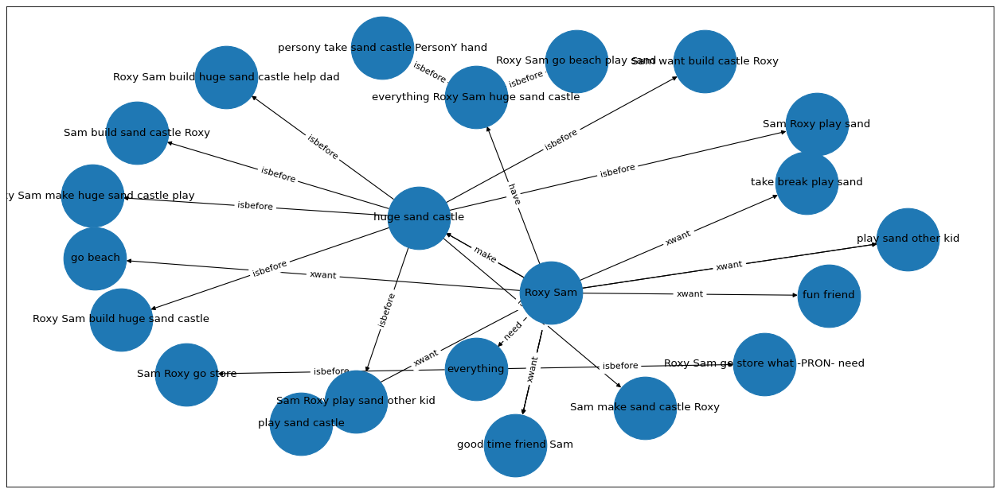

107it [00:41,  2.16it/s]

Bailey PROPN
[['Bailey', 'needed', 'a haircut']]


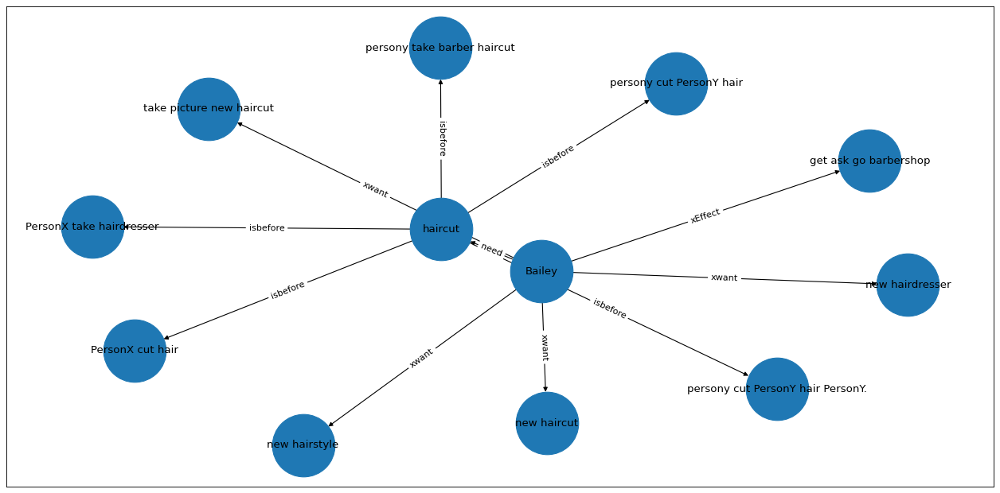

108it [00:41,  2.21it/s]

[]


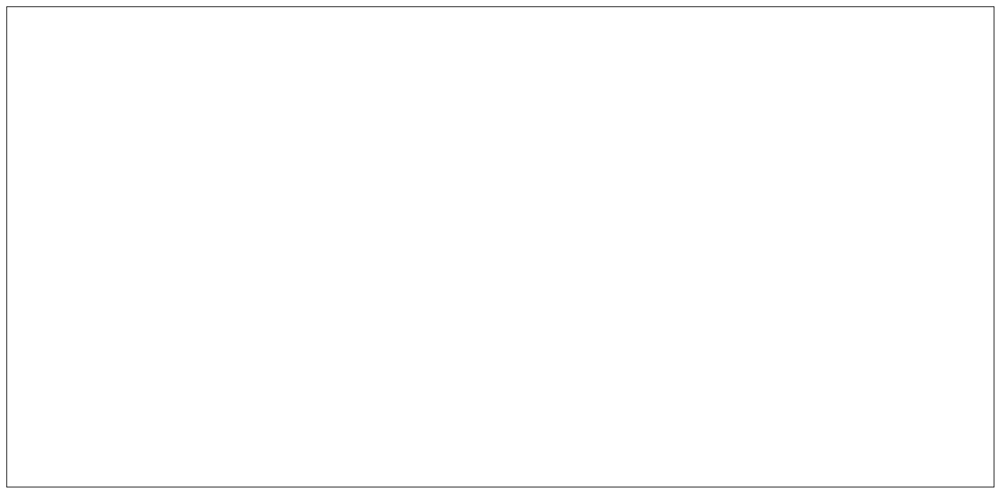

109it [00:41,  2.84it/s]

Jake PROPN
[['Jake', 'biking', 'at the park']]


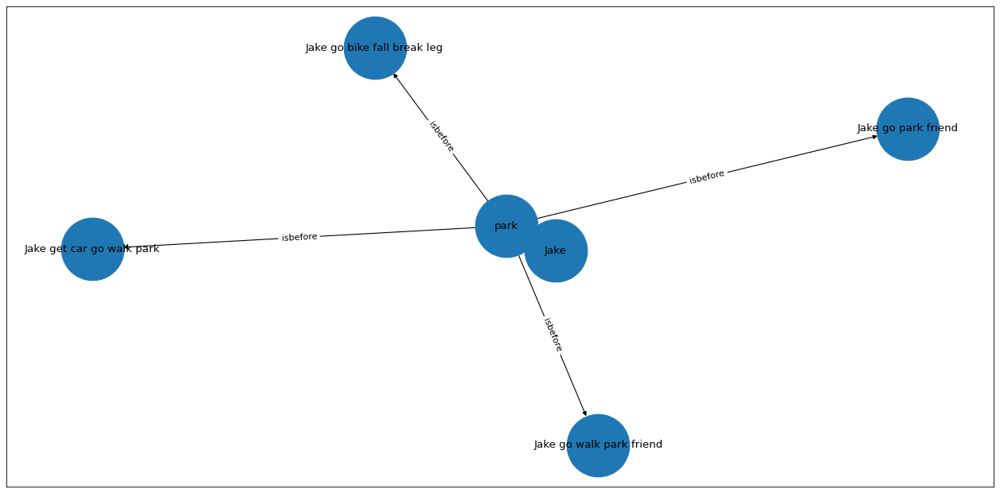

110it [00:42,  2.99it/s]

Katie NOUN
[['Katie', 'went', "to a girl 's camp across the lake from a boy 's camp"]]


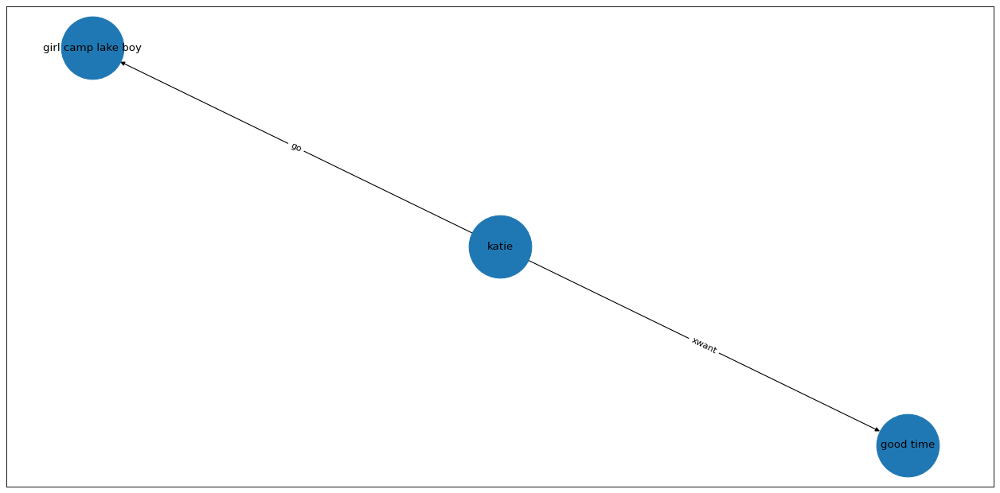

111it [00:42,  3.39it/s]

Fiona NOUN
Fiona NOUN
[['Fiona', 'loves', 'eating contests'], ['Fiona', 'eating', 'contests']]


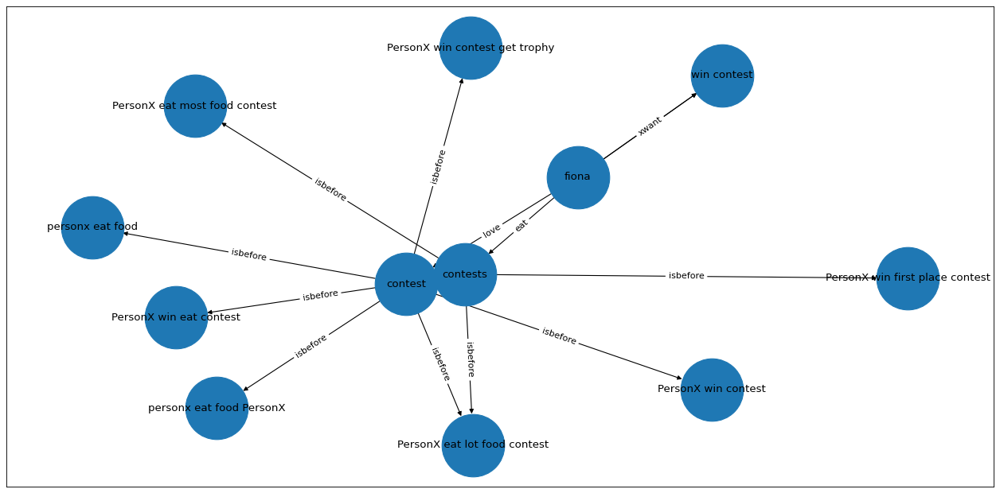

112it [00:42,  2.85it/s]

Teddy PROPN
[['Teddy', 'going', 'on a big trip']]


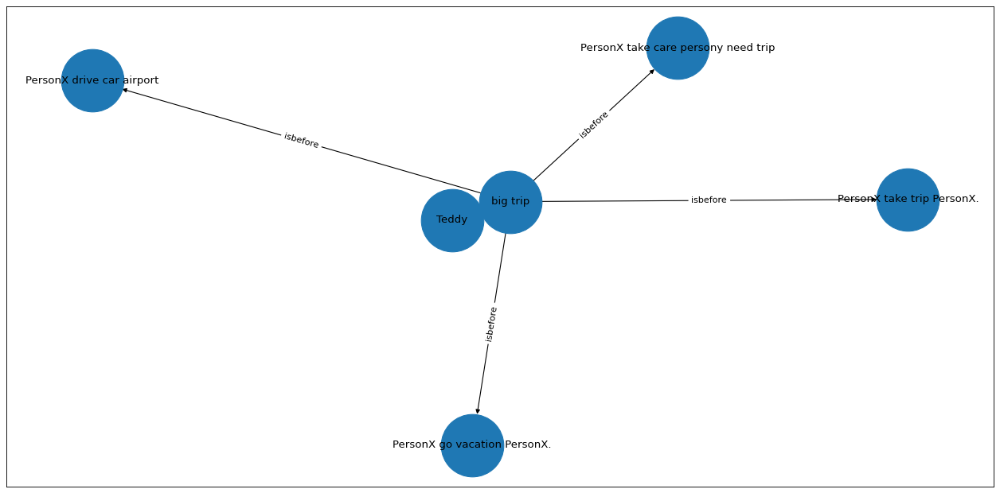

113it [00:43,  2.77it/s]

John PROPN
[['John', 'is', 'a big fan of Game of Thrones']]


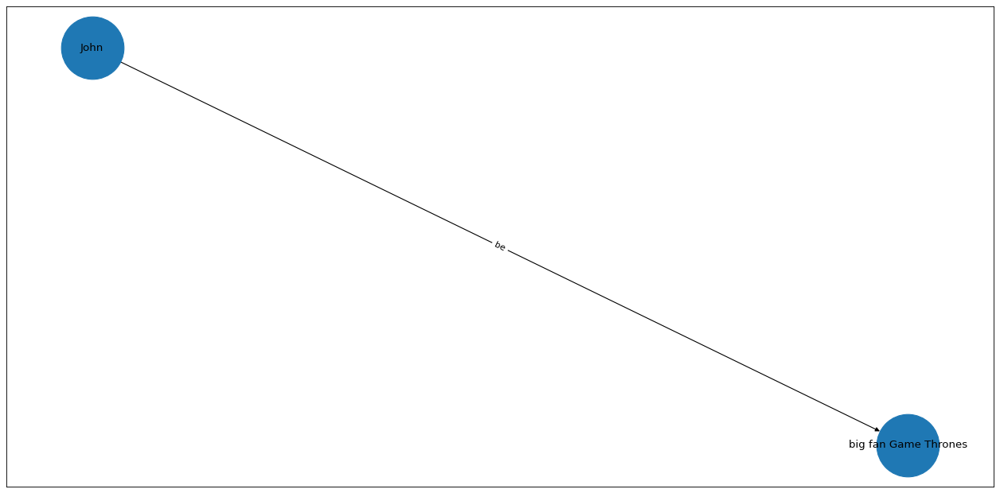

114it [00:43,  3.25it/s]

George PROPN
George PROPN
[['George', 'was', 'at the hotel'], ['George', 'was', 'last night']]


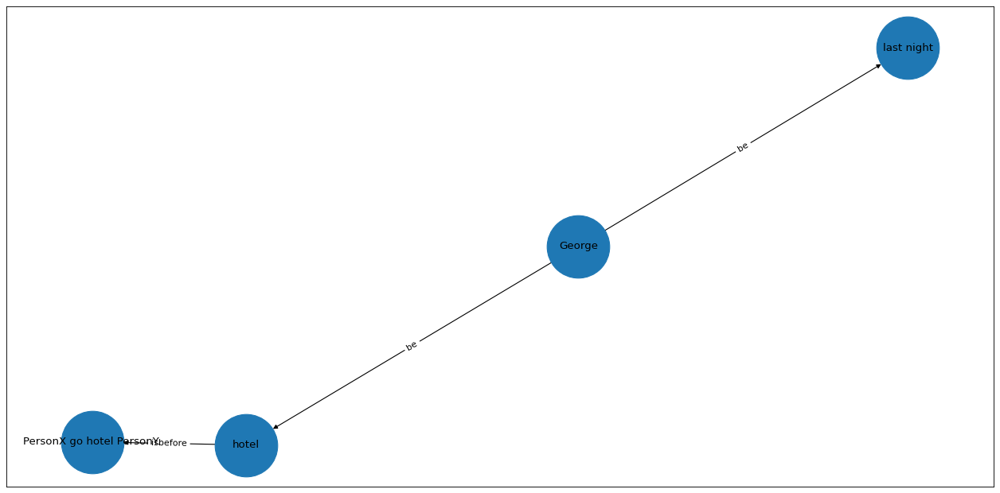

115it [00:43,  3.49it/s]

I PRON
I PRON
I PRON
I PRON
[['I', 'let', 'One afternoon'], ['I', 'let', 'my dog , Pandy'], ['I', 'let', 'outside'], ['I', 'let', 'to play']]


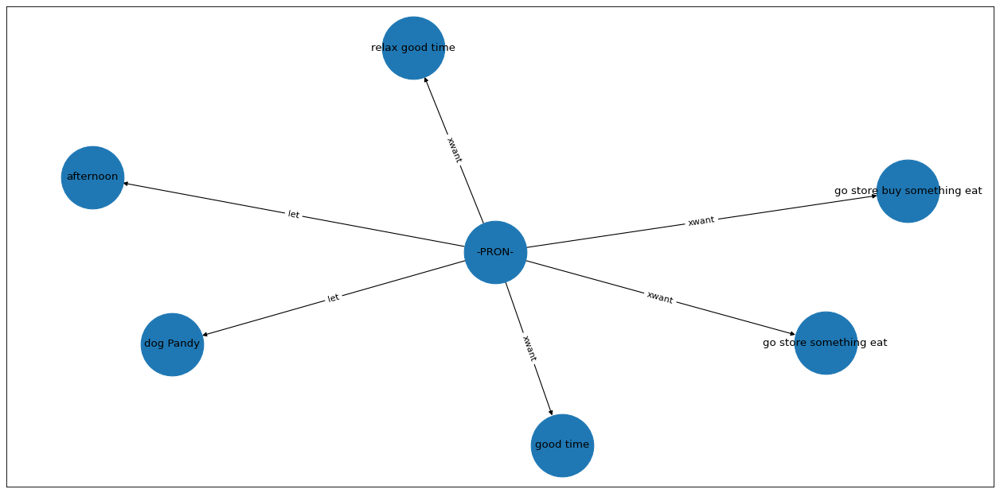

116it [00:44,  3.28it/s]

Allie PROPN
[['Allie', 'go', 'on a trip to the islands']]


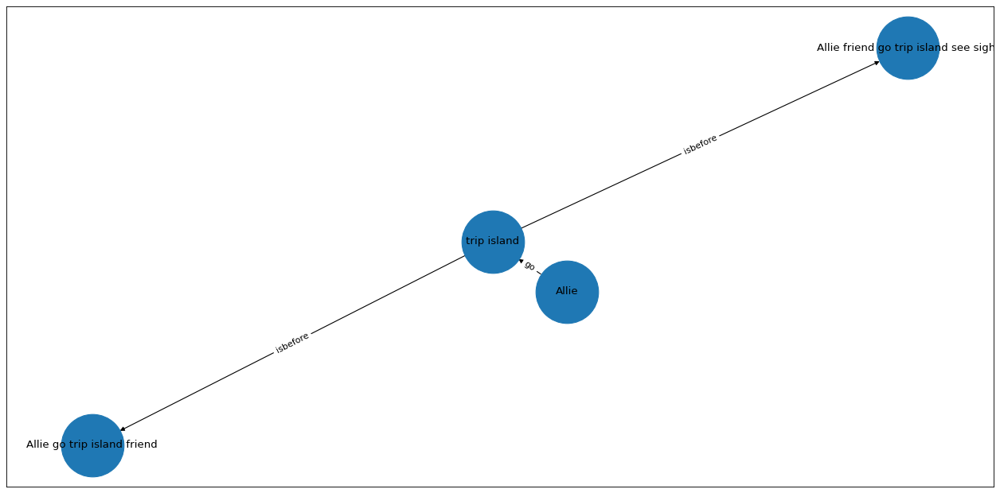

117it [00:44,  3.51it/s]

Dakota PROPN
[['Dakota', 'was', 'a senior in high school with mediocre grades']]


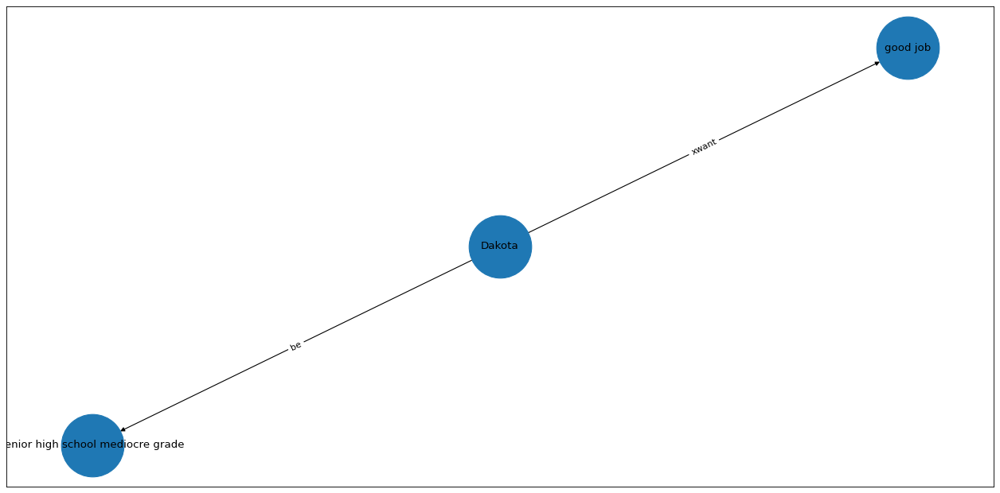

118it [00:44,  3.81it/s]

The DET
[['The baby monkey', 'was', 'the newest addition to the zoo']]


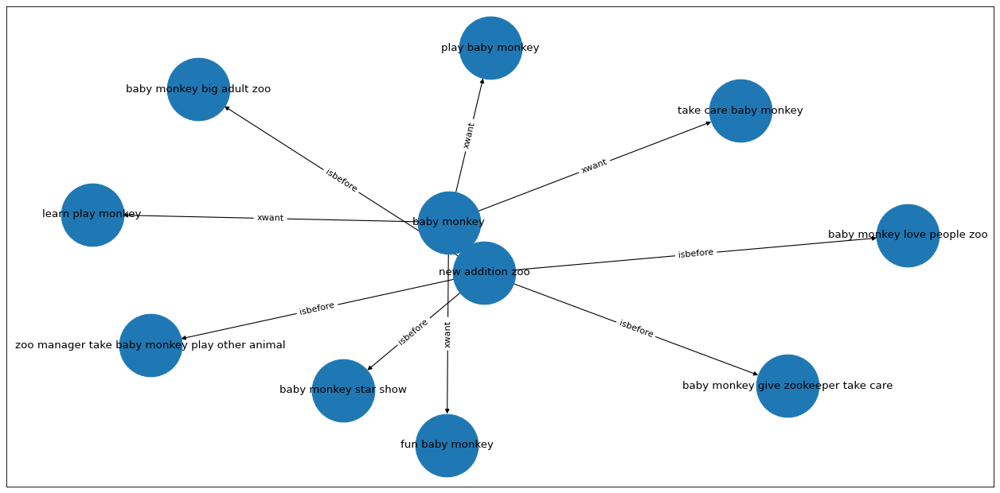

119it [00:44,  3.22it/s]

Jason PROPN
Jason PROPN
[['Jason', 'wants', 'to see a good movie'], ['Jason', 'see', 'a good movie']]


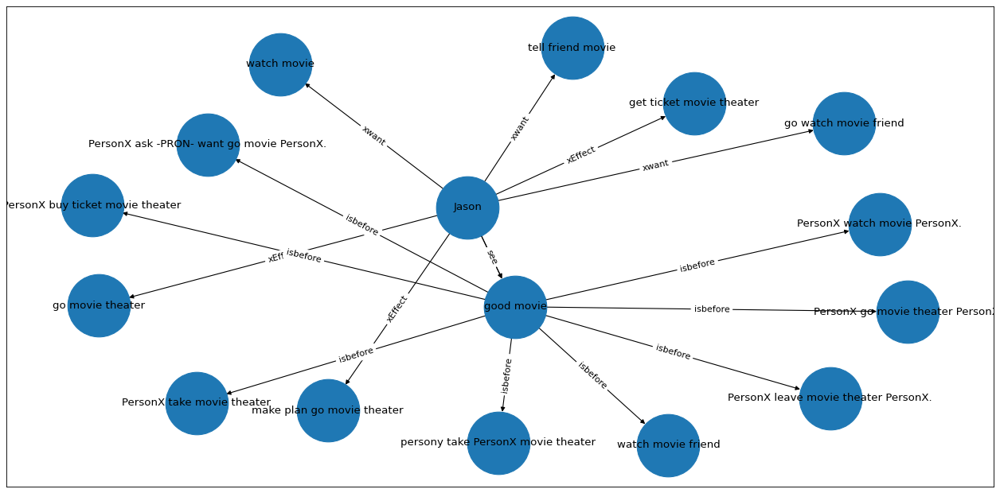

120it [00:45,  2.56it/s]

Mitch NOUN
Mitch NOUN
Mitch NOUN
[['Mitch friend', 'gave', "For Mitch 's birthday"], ['Mitch friend', 'gave', 'Mitch'], ['Mitch friend', 'gave', 'a history book']]


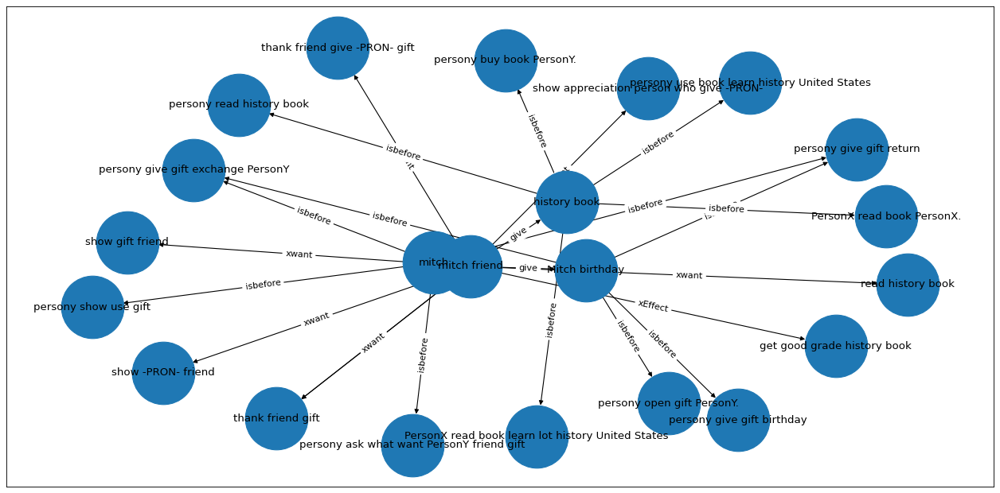

121it [00:46,  1.99it/s]

Joy PROPN
[['Joy', 'running', 'a bath']]


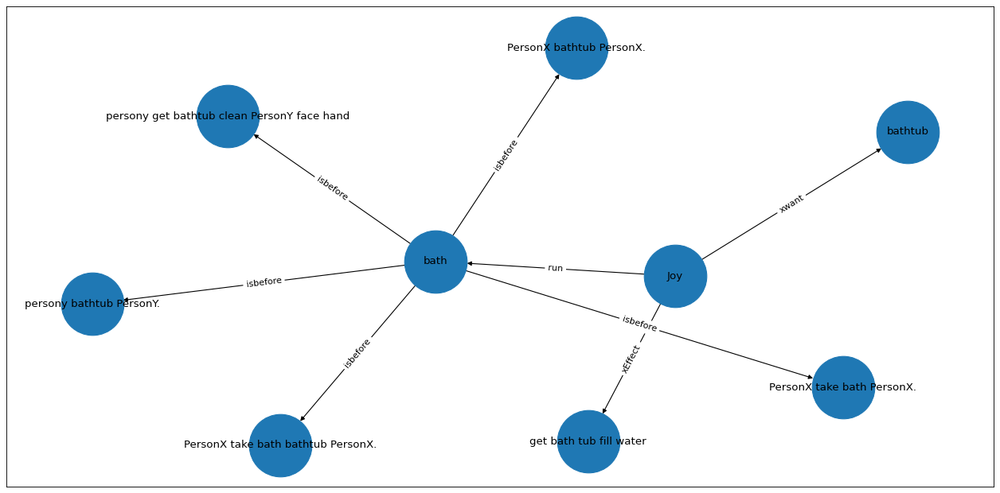

122it [00:46,  2.15it/s]

A DET
[['A large storm', 'coming', "into Jim 's hometown"]]


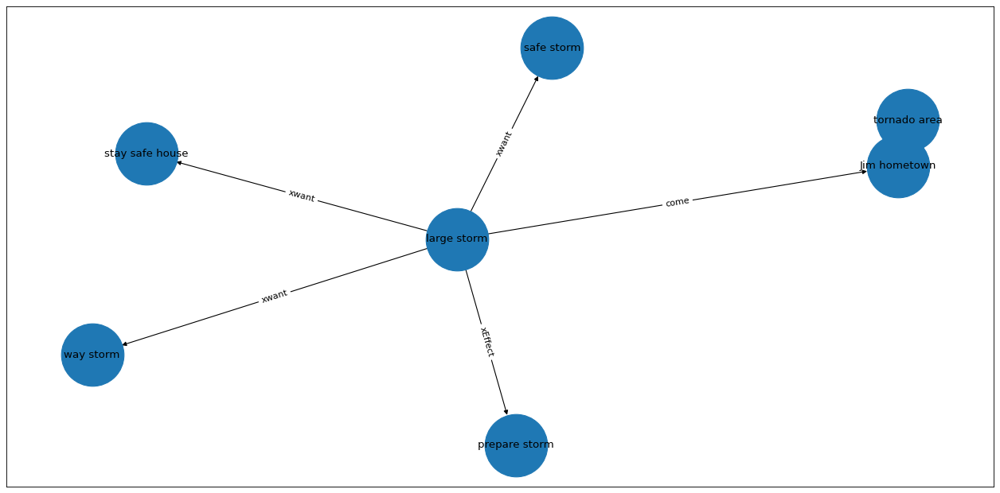

123it [00:46,  2.38it/s]

Polly ADV
Polly ADV
Polly ADV
Polly ADV
[['Polly', 'was', 'worried'], ['Polly', 'was', 'when Polly house cat escaped into the yard'], ['Polly house cat', 'escaped', 'when'], ['Polly house cat', 'escaped', 'into the yard']]


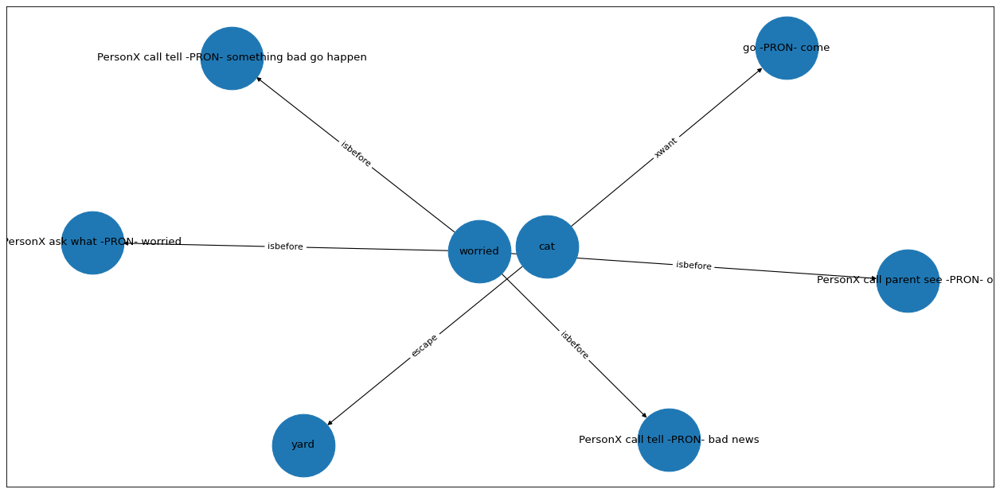

124it [00:47,  2.47it/s]

Candace NOUN
Candace NOUN
[['Candace', 'make', 'a pinhole camera'], ['Candace', 'make', 'for art class']]


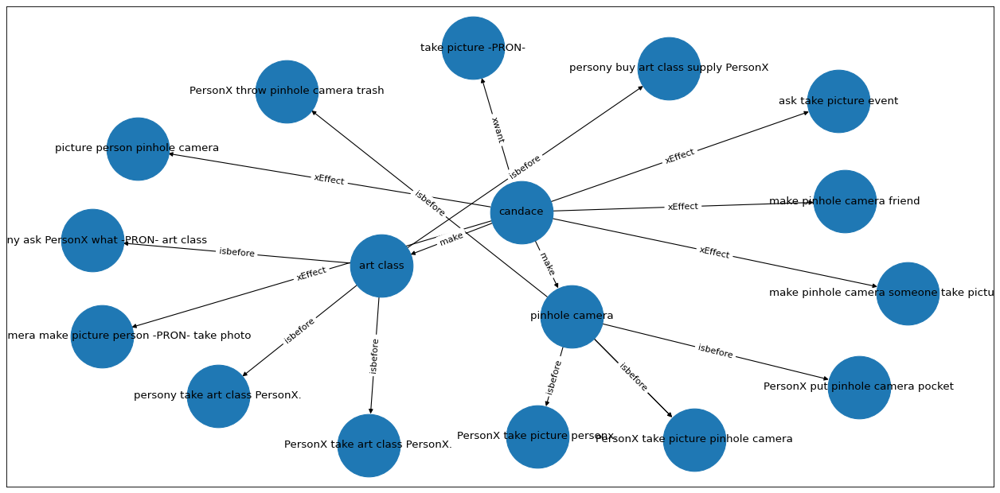

125it [00:47,  2.13it/s]

Tia ADJ
Tia ADJ
[['Tia', 'found', 'a newt'], ['Tia', 'found', 'by the creek']]


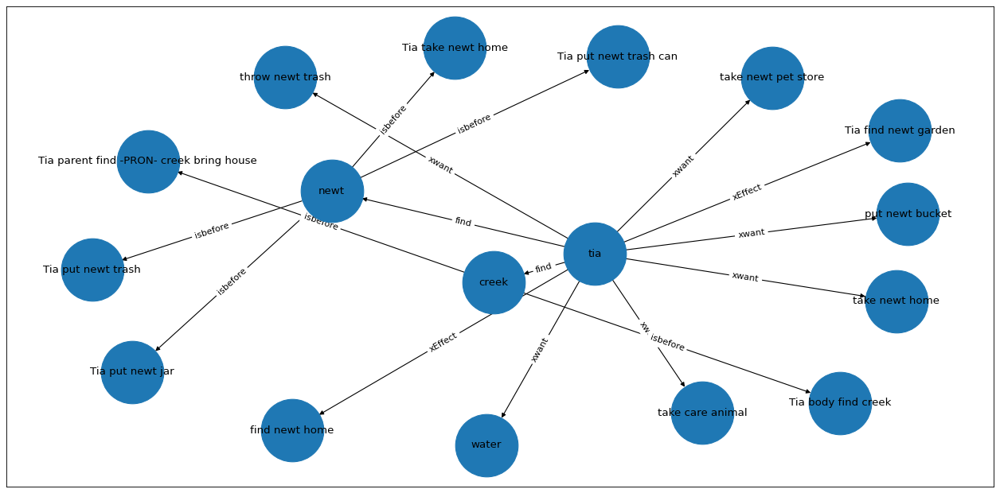

126it [00:48,  2.01it/s]

Gary PROPN
Gary PROPN
[['Gary', 'invited', 'Gary friend Tom'], ['Gary', 'invited', 'over']]


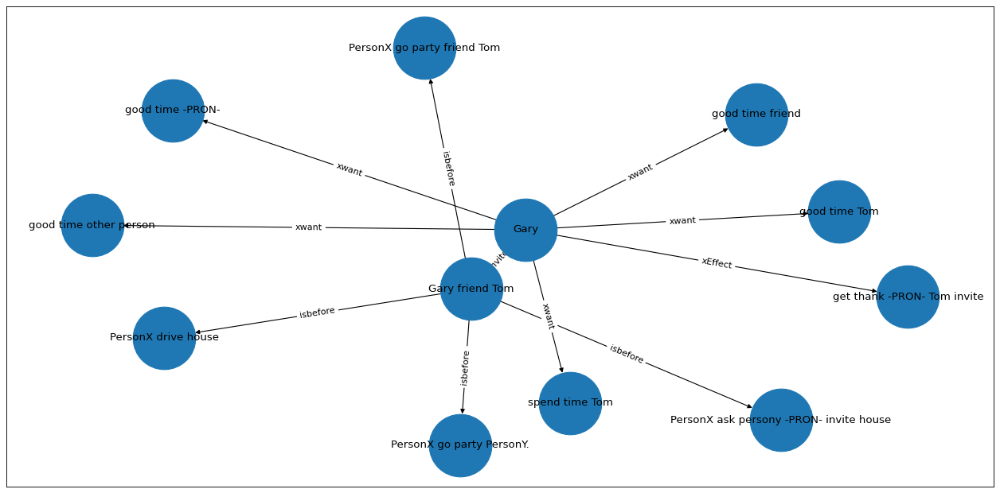

127it [00:49,  1.95it/s]

Josh PROPN
[['Josh', 'was', 'hungry']]


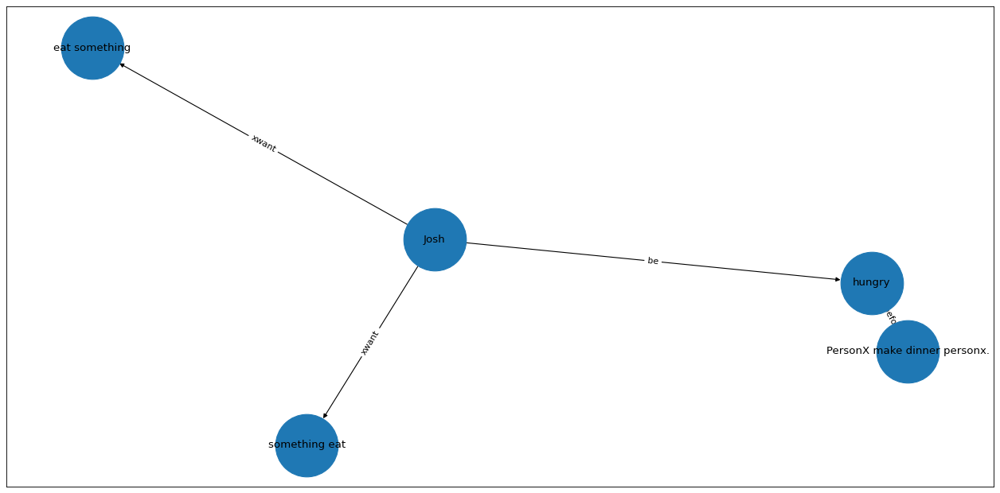

128it [00:49,  2.27it/s]

Roderich PROPN
Roderich PROPN
[['Roderich', 'realized', 'Roderich piano needed tuning'], ['Roderich piano', 'needed', 'tuning']]


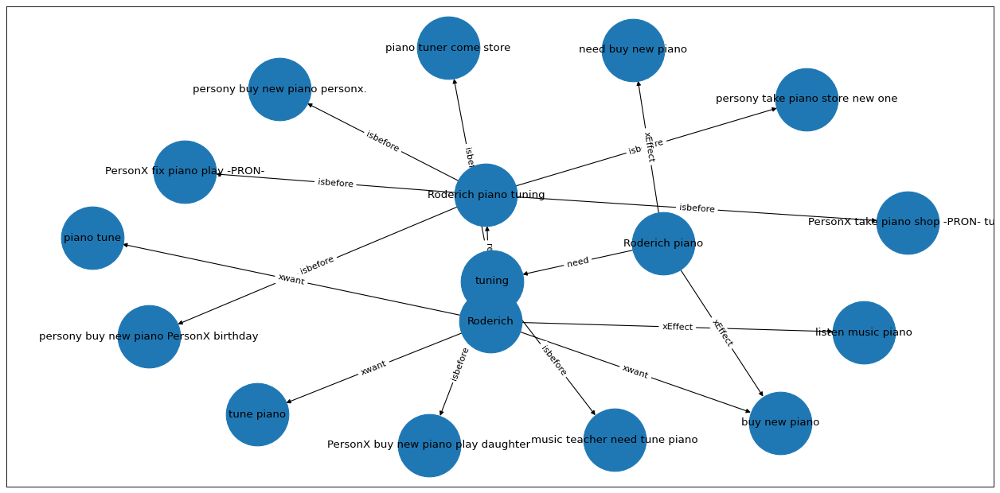

129it [00:49,  2.06it/s]

Rachel PROPN
Rachel PROPN
[['Rachel', 'walking', 'through a hotel'], ['Rachel', 'walking', 'with Rachel suitcase']]


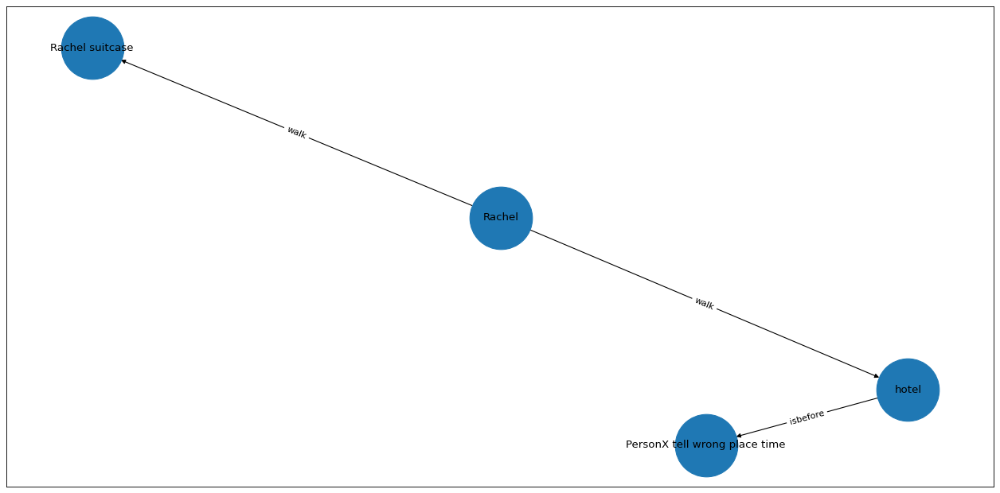

130it [00:50,  2.41it/s]

I PRON
[['I', 'shopping', 'for a painting of Chinatown']]


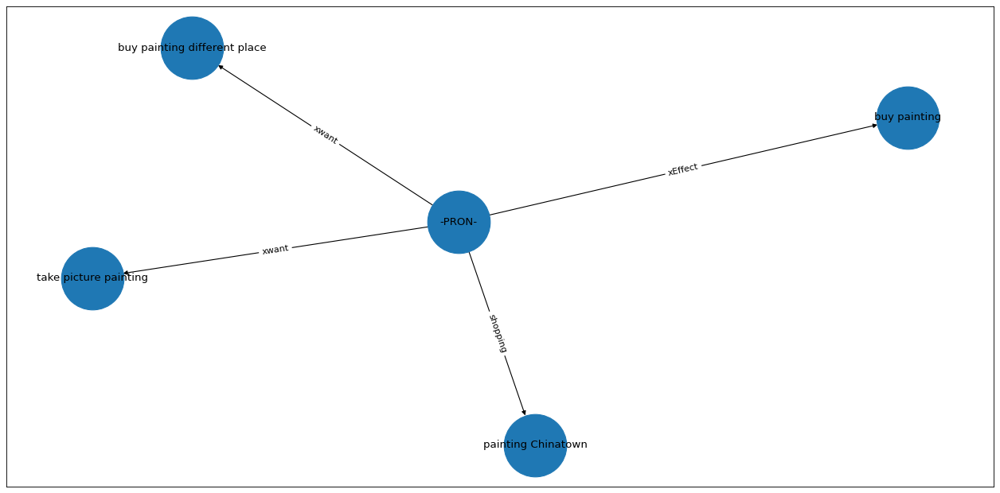

131it [00:50,  2.67it/s]

Leia PROPN
Leia PROPN
[['Leia', 'been', 'always'], ['Leia', 'been', 'courteous to Leia fellow employees']]


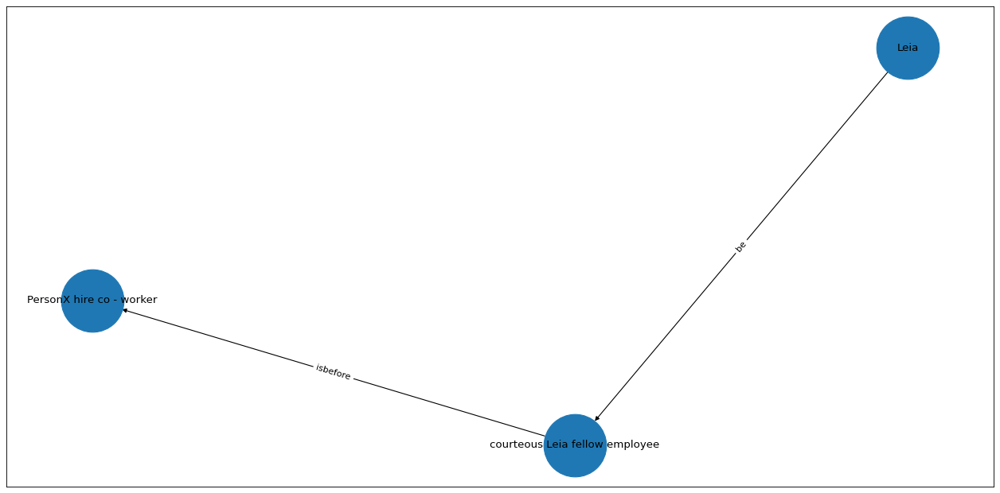

132it [00:50,  3.00it/s]

James PROPN
James PROPN
James PROPN
James PROPN
[['James', 'wanted', 'to entered a soap box car derby'], ['James', 'entered', 'a soap box car derby'], ['James', 'have', "n't"], ['James', 'have', 'a car']]


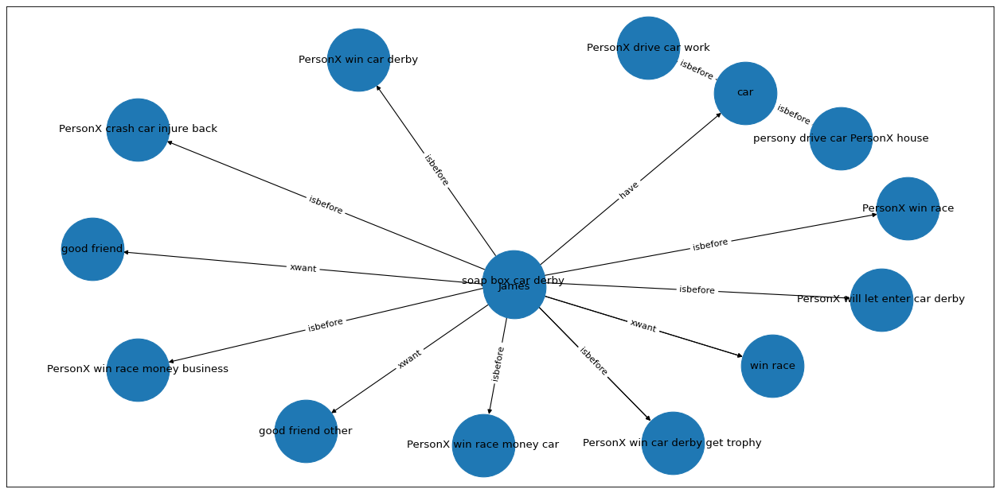

133it [00:51,  2.38it/s]

Zippy PROPN
[['Zippy', 'was', 'a brown cat in my neighborhood']]


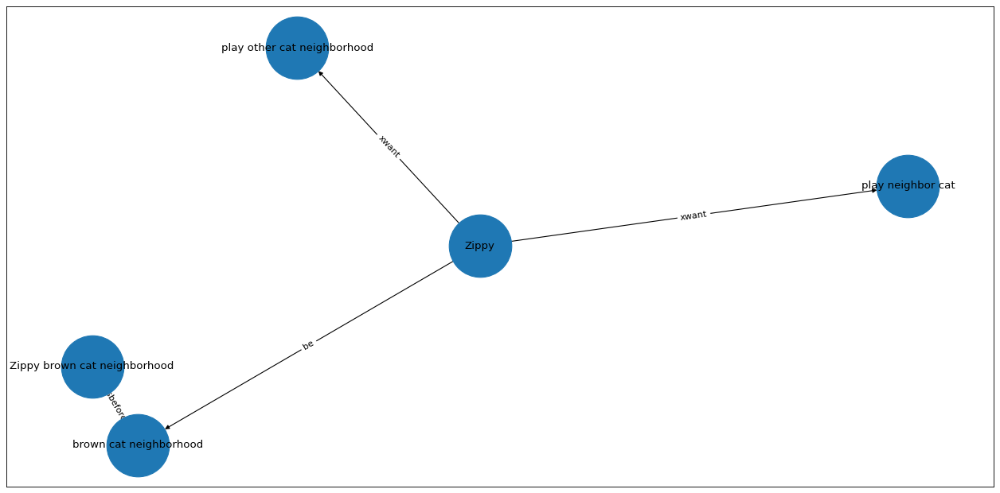

134it [00:51,  2.65it/s]

Jonas PROPN
it PRON
it PRON
[['Jonas', 'felt', 'depressed that it has been very cold lately'], ['it', 'been', 'very cold'], ['it', 'been', 'lately']]


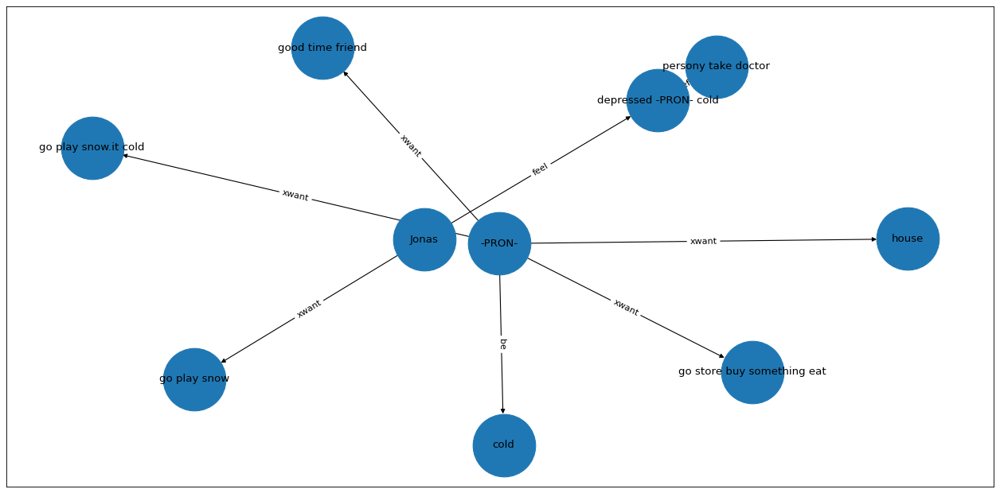

135it [00:52,  2.54it/s]

The DET
[['The Smith family', 'went', 'to a buffet']]


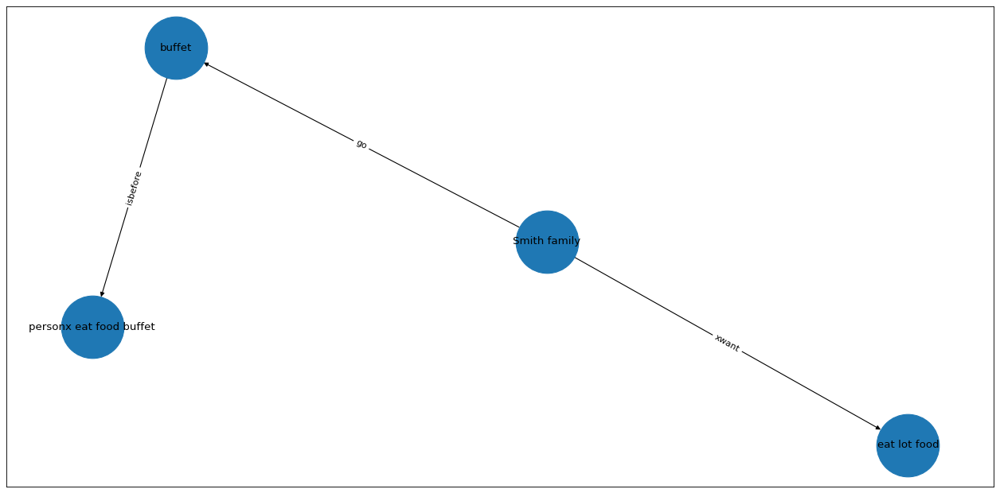

136it [00:52,  2.83it/s]

by ADP
a DET
[['by a boy in class named Dave', 'harassed', 'Gina'], ['a boy in class', 'named', 'Dave']]


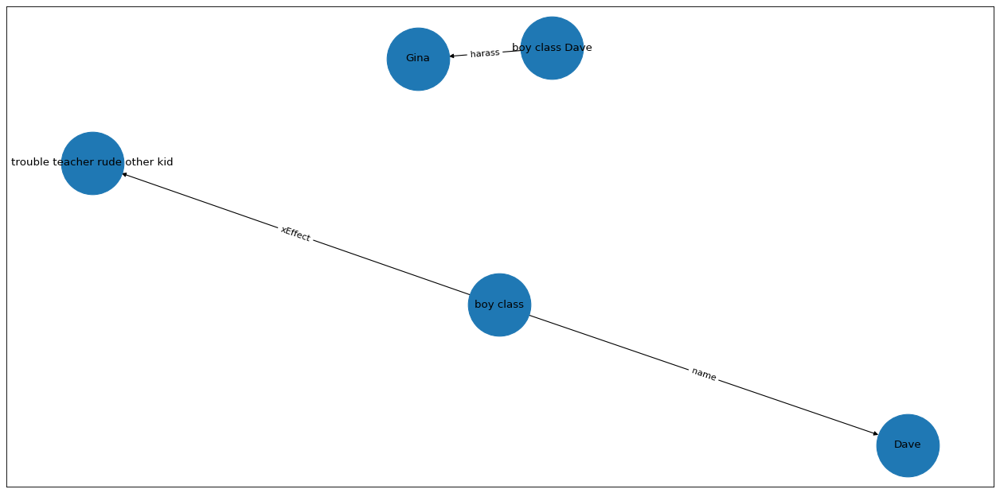

137it [00:52,  3.08it/s]

I PRON
I PRON
I PRON
I PRON
my DET
[['I', 'retrieved', 'just'], ['I', 'retrieved', 'my marbles'], ['I', 'retrieved', "from Sally 's house"], ['I', 'retrieved', 'when my marbles happened'], ['my marbles', 'happened', 'when']]


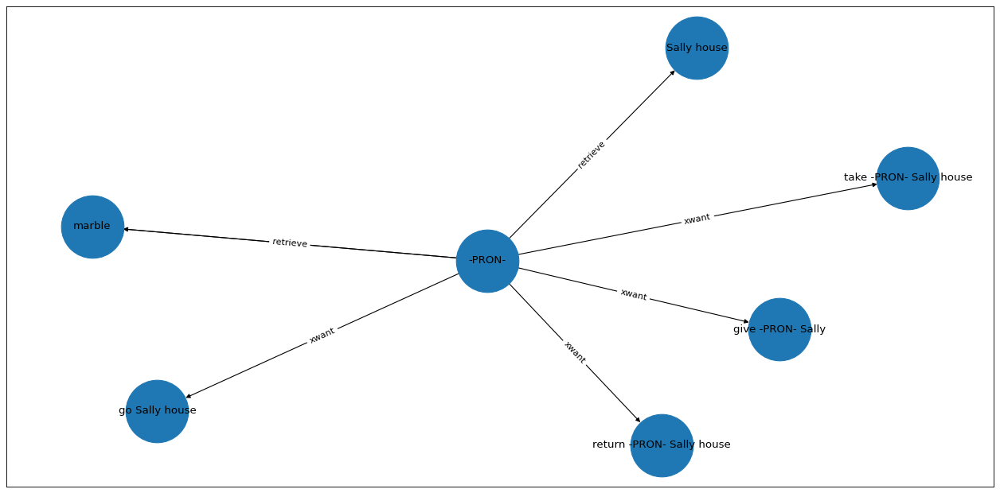

138it [00:52,  2.91it/s]

Lucy PROPN
Lucy PROPN
Lucy PROPN
Lucy PROPN
Lucy PROPN
[['Lucy', 'wanted', 'to go to the pool'], ['Lucy', 'go', 'to the pool'], ['Lucy grandma', 'let', 'would'], ['Lucy grandma', 'let', "n't"], ['Lucy grandma', 'let', 'Lucy']]


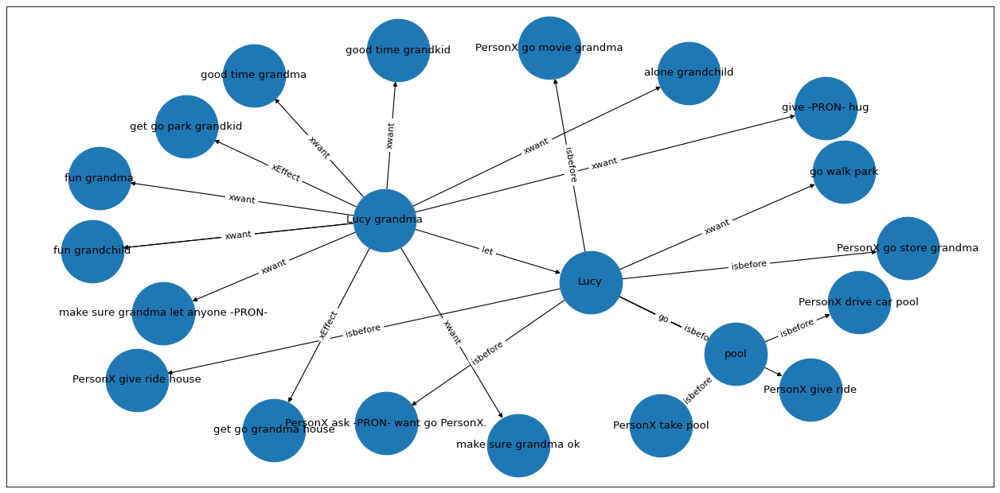

139it [00:53,  2.00it/s]

Marcus PROPN
Marcus PROPN
Marcus PROPN
Marcus PROPN
[['Marcus', 'liked', 'never'], ['Marcus', 'liked', 'reading'], ['Marcus', 'liked', 'much'], ['Marcus', 'reading', 'much']]


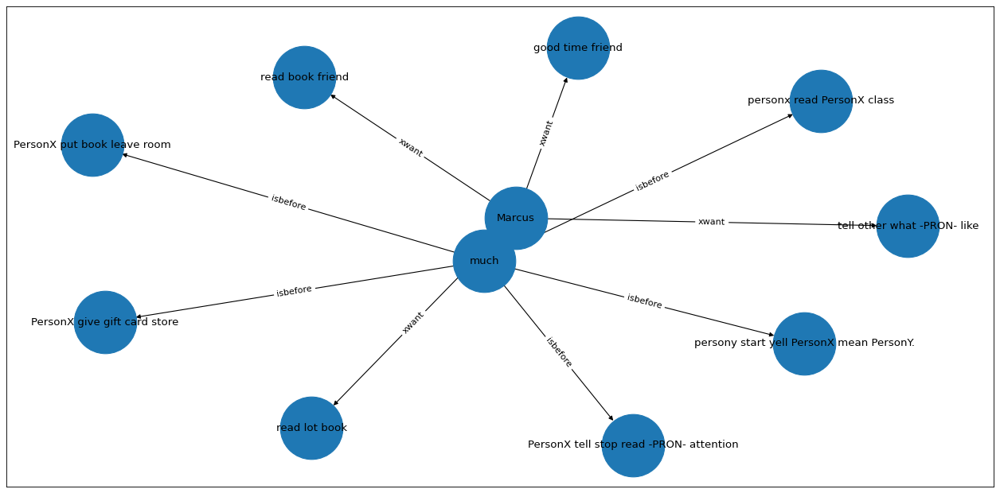

140it [00:54,  1.93it/s]

They PRON
it PRON
it PRON
[['They', 'said', 'it was going to be warm today'], ['it', 'be', 'warm'], ['it', 'be', 'today']]


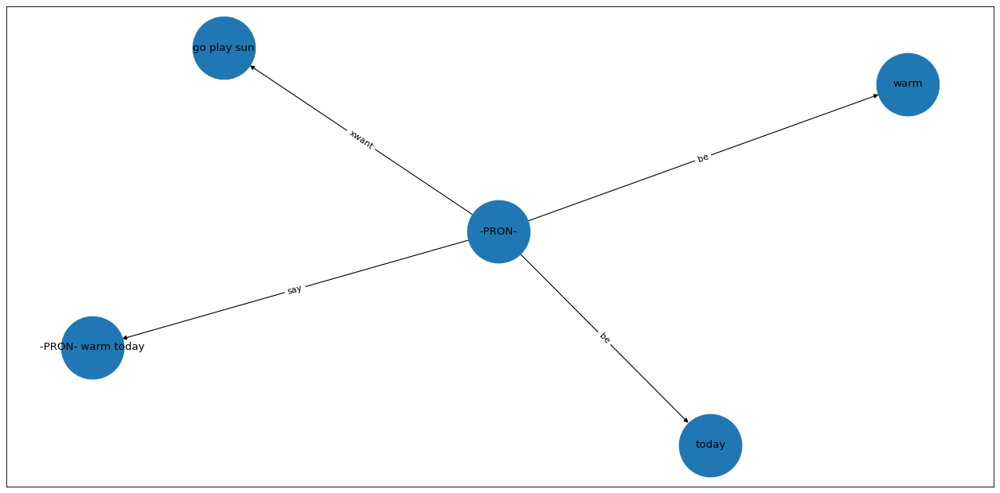

141it [00:54,  2.11it/s]

John PROPN
[['John', 'was', 'very focused on the grill']]


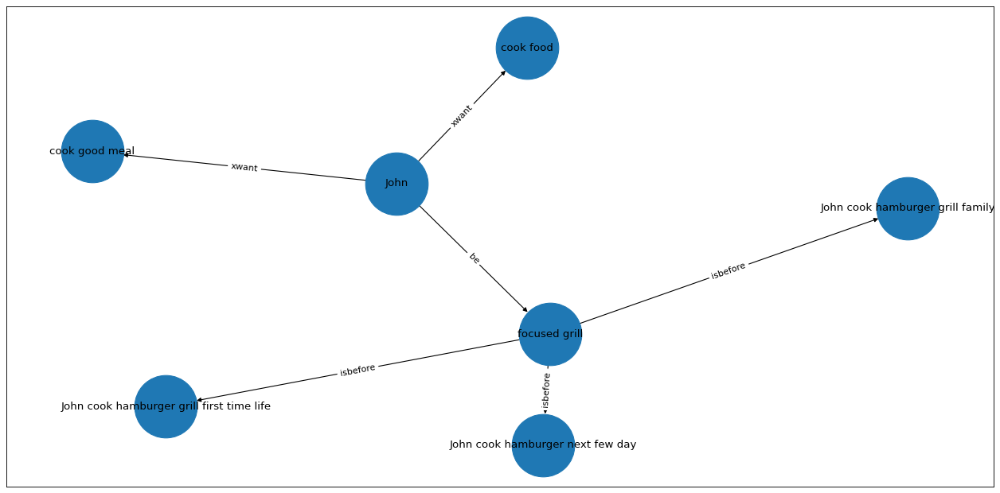

142it [00:55,  2.30it/s]

Jim PROPN
Jim PROPN
[['Jim', 'wanted', 'to learn how to paint'], ['Jim', 'learn', 'how to paint']]


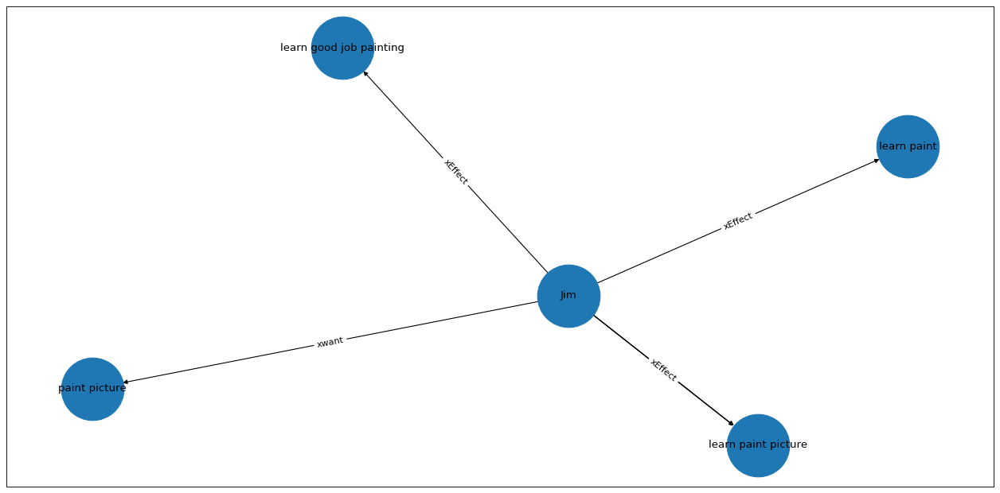

143it [00:55,  2.18it/s]

The DET
[['The lion trainer', 'opened', "the lion 's ' cage"]]


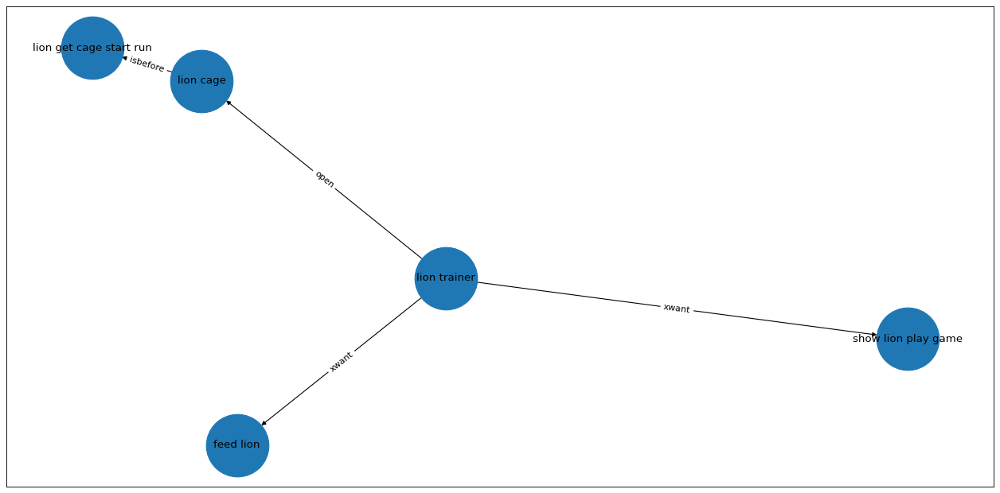

144it [00:55,  2.38it/s]

I PRON
I PRON
I PRON
[['I', 'went', 'to start my car last friday'], ['I', 'start', 'my car'], ['I', 'start', 'last friday']]


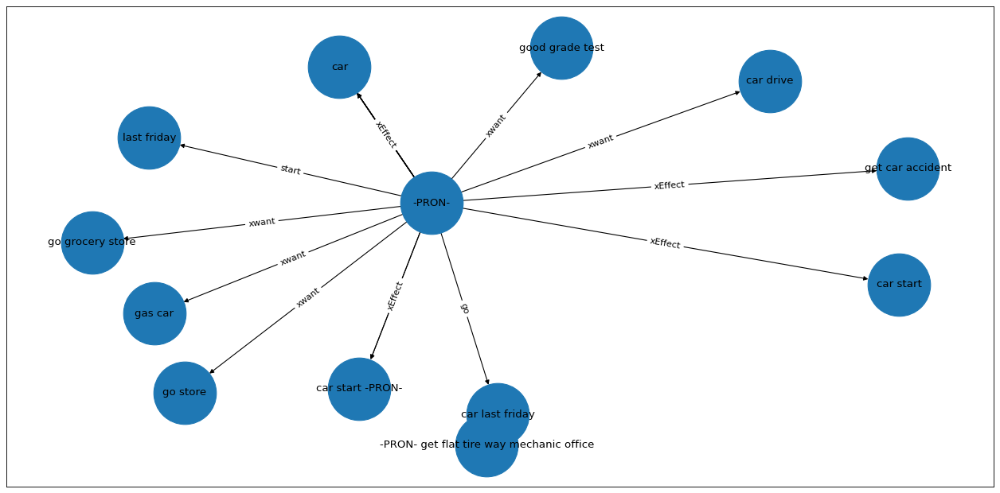

145it [00:56,  1.99it/s]

Claudette PROPN
[['Claudette', 'was', "George 's third wife"]]


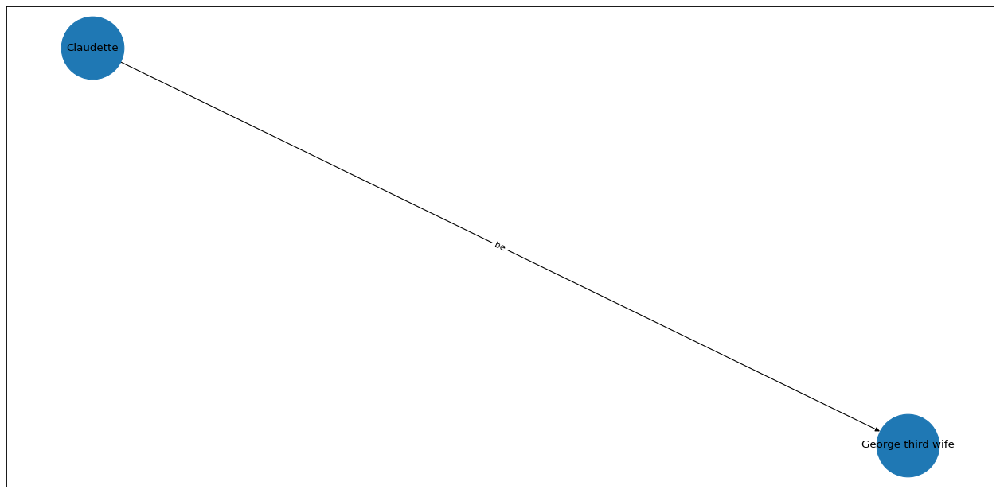

146it [00:56,  2.42it/s]

Sandy PROPN
Sandy PROPN
[['Sandy', 'watching', 'a video'], ['Sandy', 'watching', 'on Youtube']]


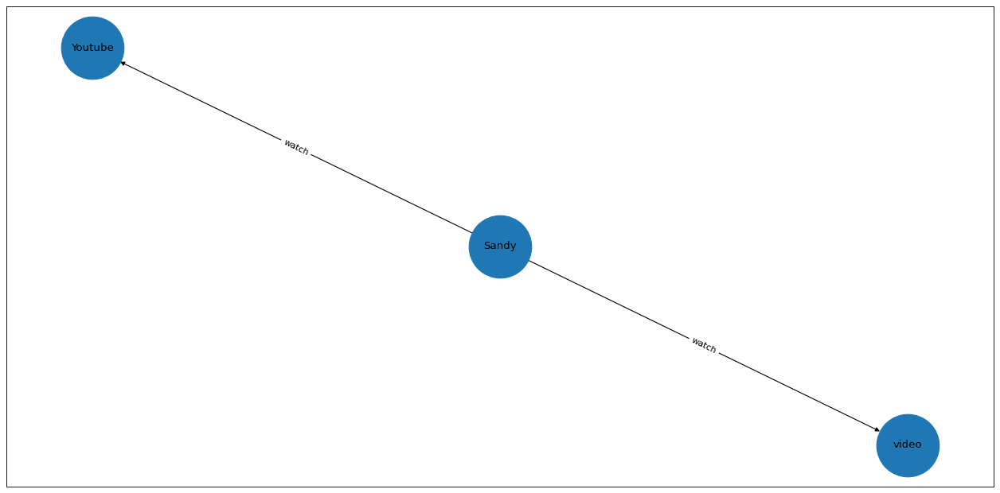

147it [00:57,  2.78it/s]

Sean PROPN
[['Sean', 'was', 'on Sean computer']]


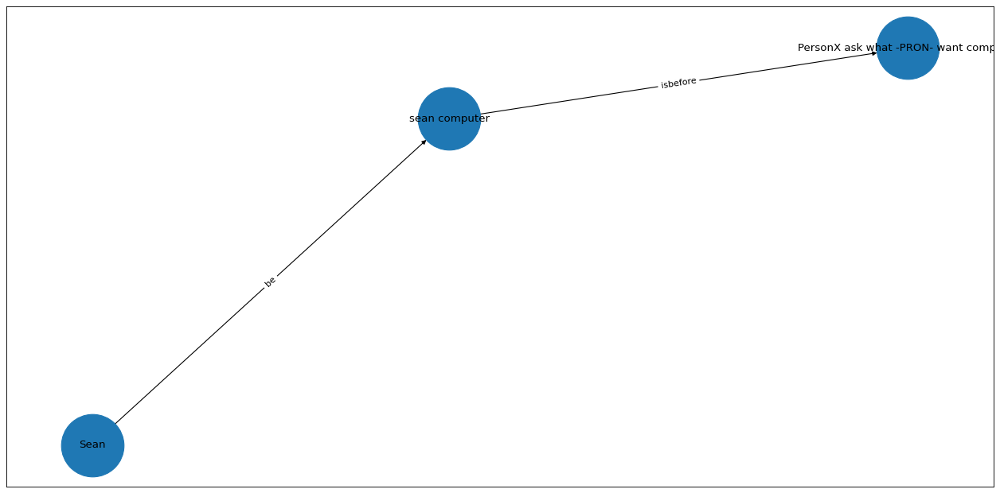

148it [00:57,  3.11it/s]

Schmidt PROPN
Schmidt PROPN
[['Schmidt', 'take', 'the bus'], ['Schmidt', 'take', 'to work']]


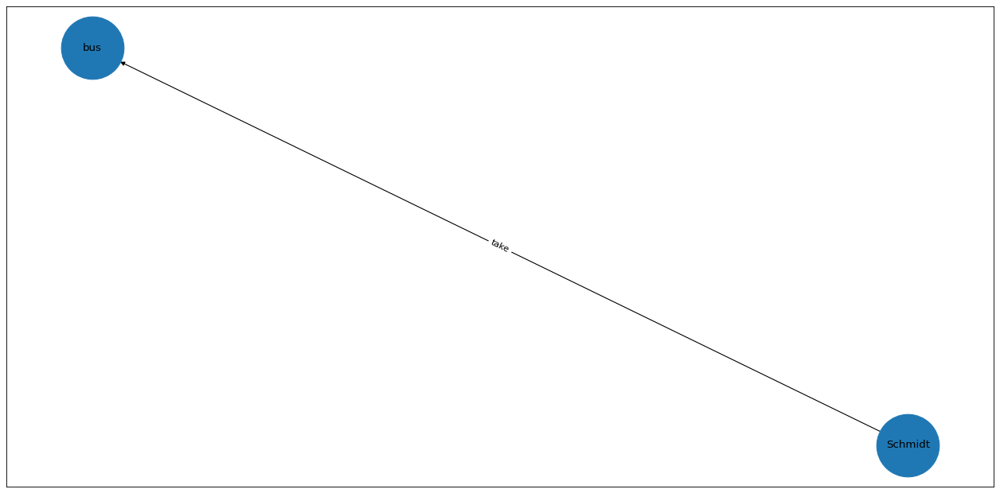

149it [00:57,  3.34it/s]

The DET
The DET
Mick NOUN
the DET
[['The carpenter', 'told', 'Mick'], ['The carpenter', 'told', 'to make sure the baseboard was straight'], ['Mick', 'make', 'sure the baseboard was straight'], ['the baseboard', 'was', 'straight']]


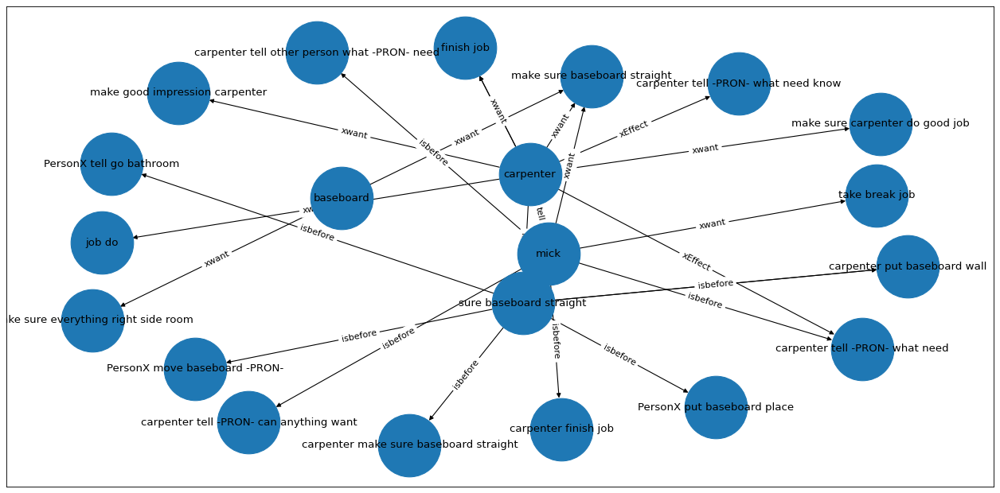

150it [00:58,  2.07it/s]

I PRON
[['I', 'buy', 'coffee']]


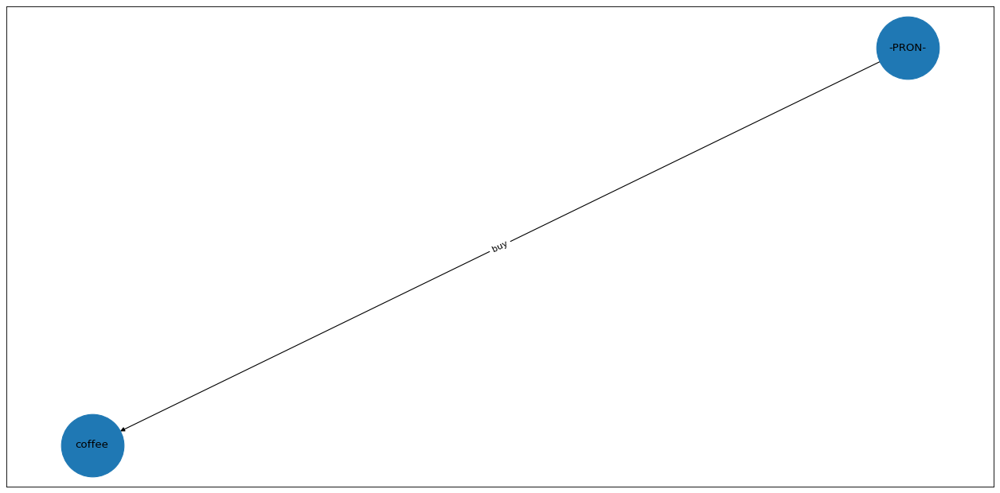

151it [00:58,  2.50it/s]

We PRON
We PRON
We PRON
[['We', 'had', 'dinner'], ['We', 'had', 'in Brooklyn'], ['We', 'had', 'tonight']]


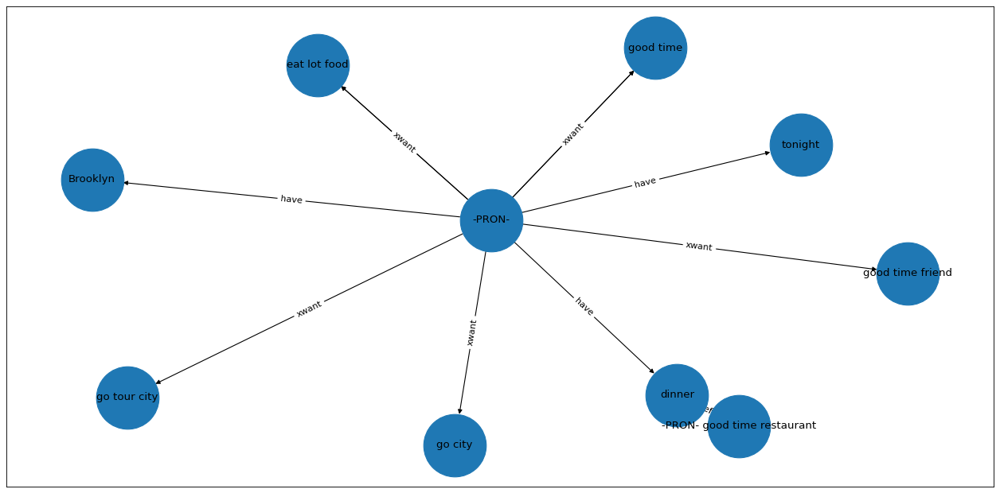

152it [00:59,  2.34it/s]

Bob PROPN
Bob PROPN
Bob PROPN
Bob PROPN
Bob PROPN
[['Bob', 'went', 'to the store'], ['Bob', 'went', 'to get supplies'], ['Bob', 'went', 'before the storm'], ['Bob', 'get', 'supplies'], ['Bob', 'get', 'before the storm']]


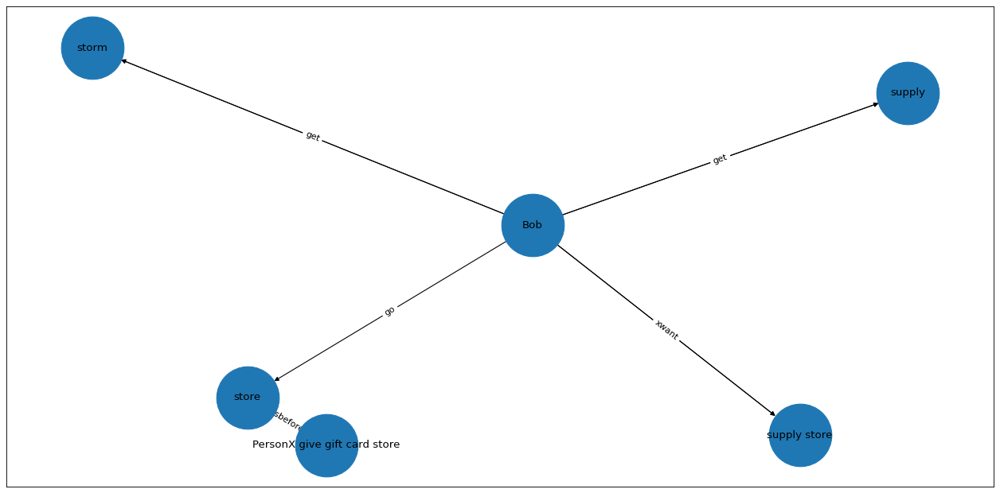

153it [00:59,  2.36it/s]

Carol PROPN
Carol PROPN
[['Carol', 'had', 'a bunch of obsolete computer manuals Carol had no use for'], ['Carol', 'had', 'no use for']]


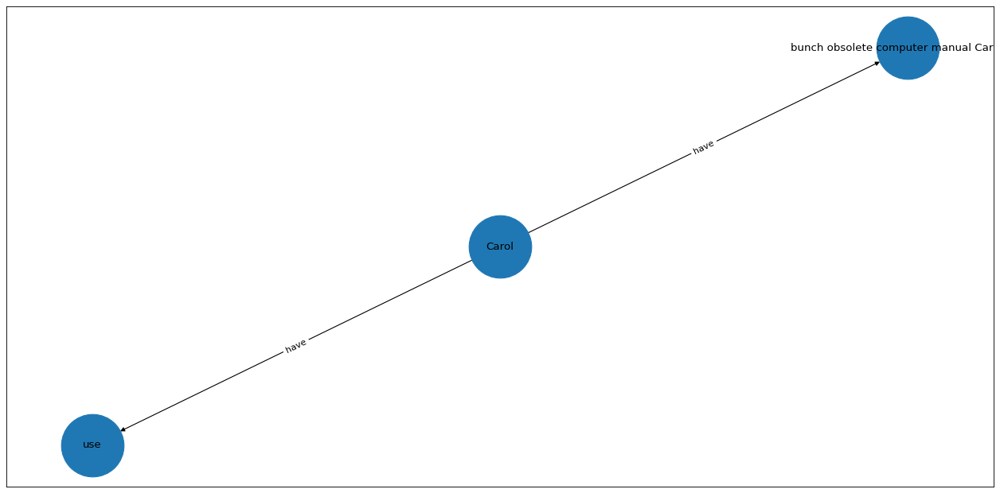

154it [00:59,  2.69it/s]

Ashley PROPN
Ashley PROPN
[['Ashley', 'wants', 'to switch careers'], ['Ashley', 'switch', 'careers']]


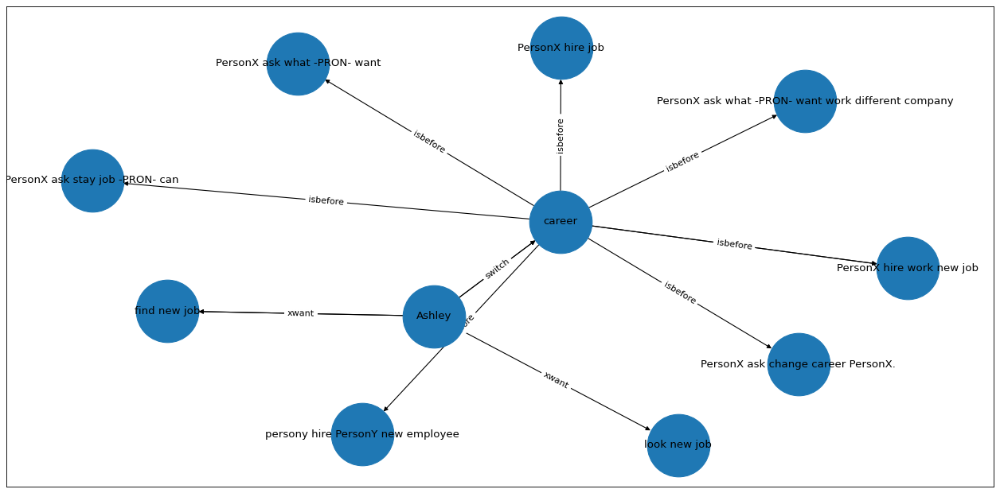

155it [01:00,  2.29it/s]

I PRON
I PRON
[['I', 'hunt', 'always'], ['I', 'hunt', 'for the best deals']]


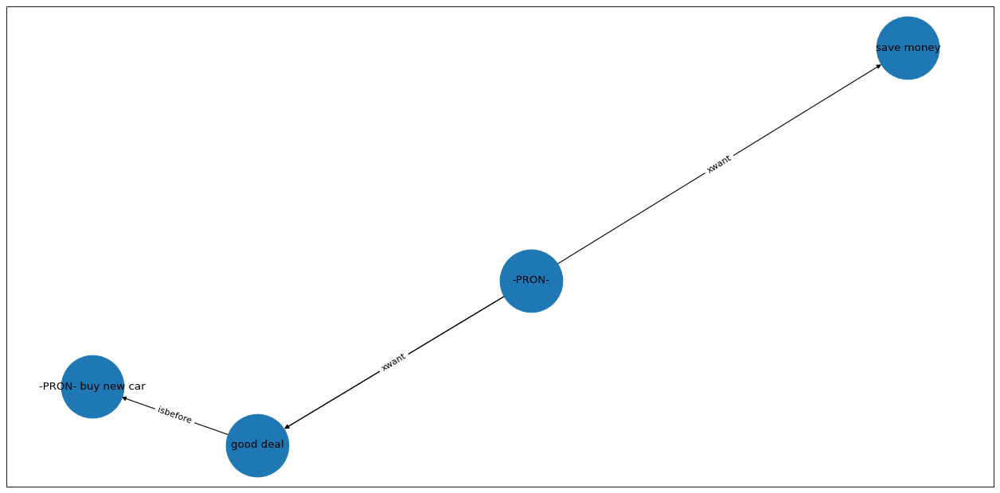

156it [01:00,  2.35it/s]

The DET
The DET
The DET
The DET
[['The innkeeper', 'have', "n't"], ['The innkeeper', 'have', 'any space in The innkeeper inn'], ['The innkeeper', 'have', 'when The innkeeper came'], ['The innkeeper', 'came', 'when']]


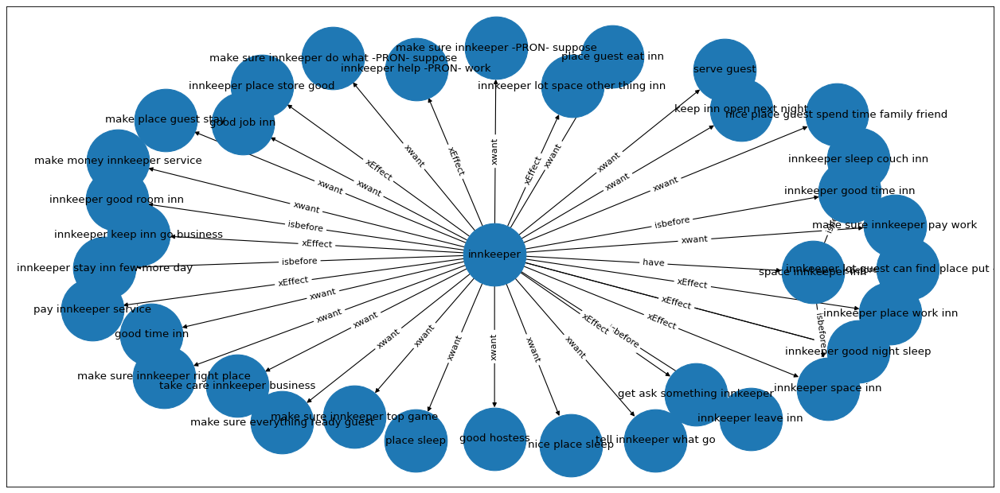

157it [01:02,  1.31it/s]

Jared PROPN
[['Jared', 'had', 'a piano']]


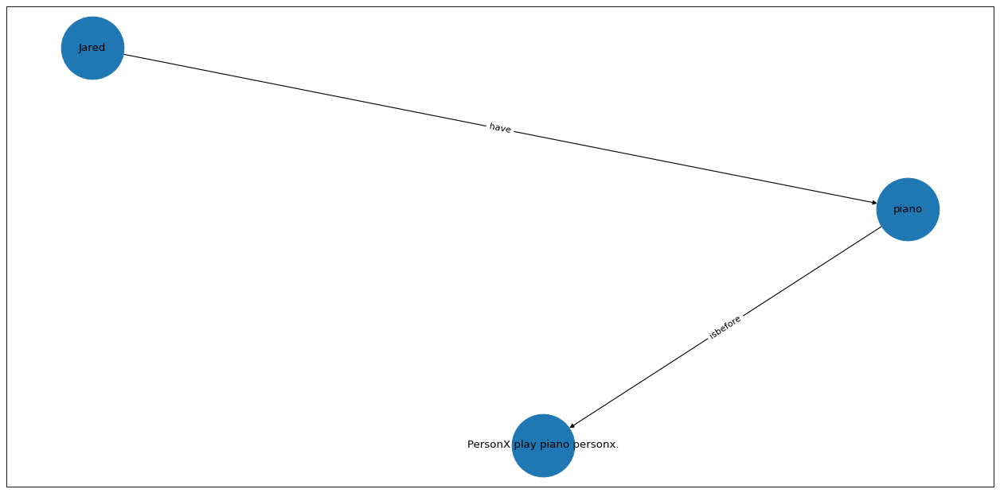

158it [01:02,  1.63it/s]

Aria PROPN
her DET
[['Aria', 'found', 'her favorite band was playing tonight'], ['her favorite band', 'playing', 'tonight']]


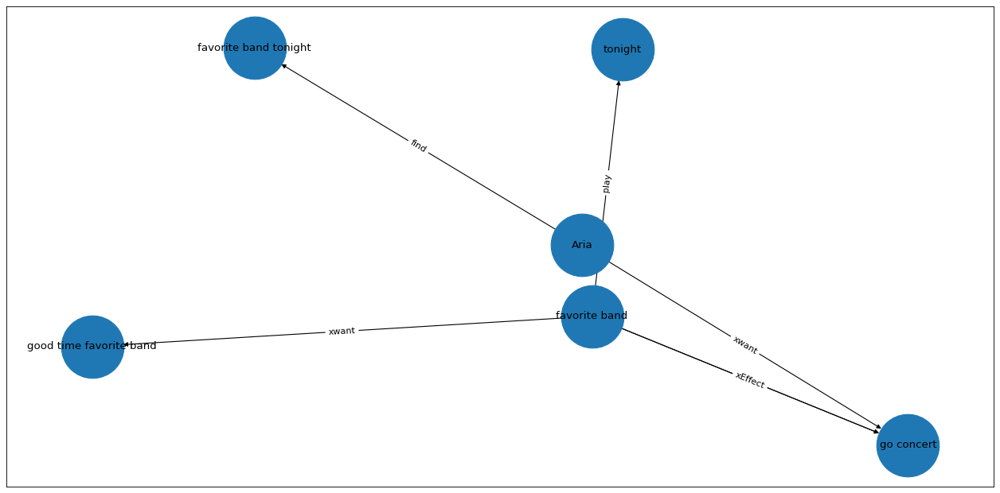

159it [01:02,  1.85it/s]

I PRON
I PRON
[['I', 'got', 'on the sled'], ['I', 'got', 'at the top of the hill']]


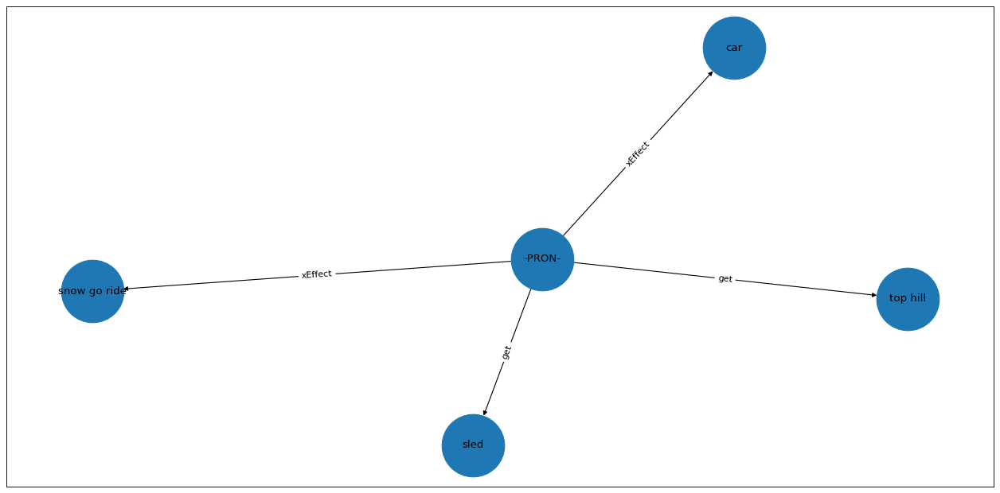

160it [01:03,  2.11it/s]

I PRON
I PRON
[['I', 'make', 'an apple pie'], ['I', 'make', 'for Thanksgiving']]


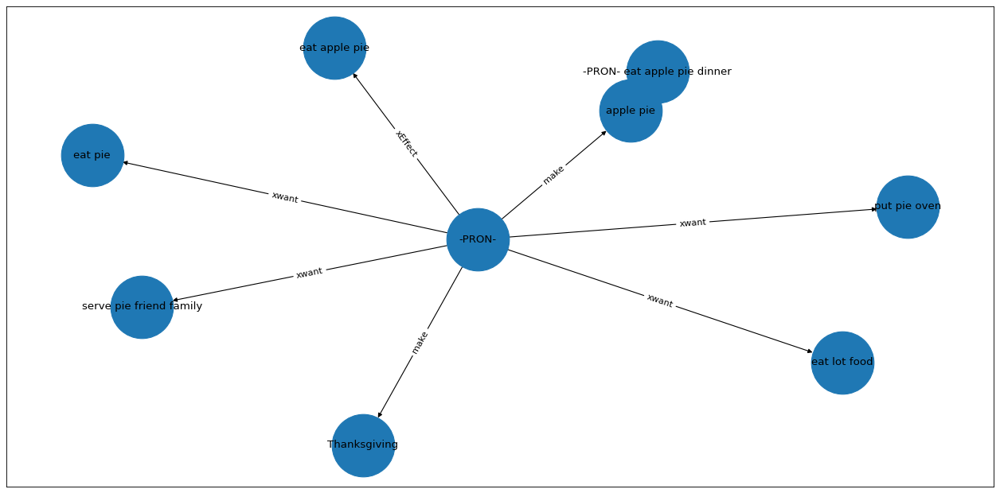

161it [01:03,  2.13it/s]

The DET
The DET
The DET
among ADP
[['The bartender', 'started', 'a joke contest'], ['The bartender', 'started', 'one night'], ['The bartender', 'started', 'among the guests'], ['among the guests', 'contest', 'joke']]


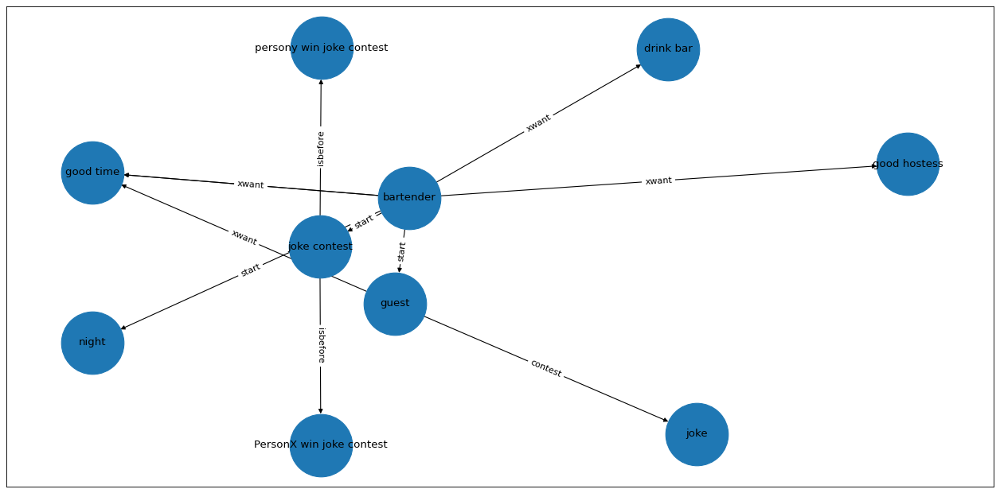

162it [01:04,  2.00it/s]

The DET
The DET
[['The teacher', 'gave', 'us'], ['The teacher', 'gave', 'an assignment']]


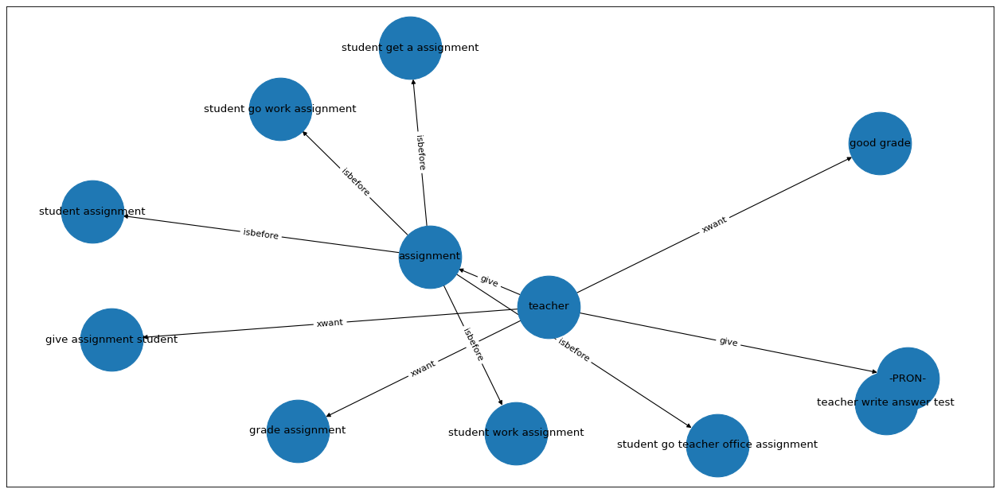

163it [01:04,  1.91it/s]

Amy PROPN
Amy PROPN
Amy PROPN
[['Amy', 'wore', 'flip flops'], ['Amy', 'wore', 'indoors'], ['Amy', 'wore', 'all year long']]


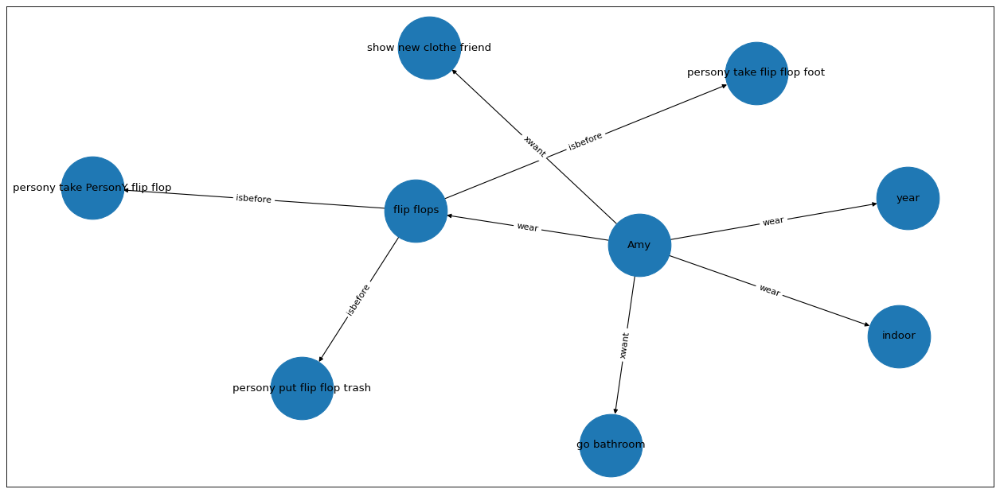

164it [01:05,  1.99it/s]

A DET
[['A man', 'having', 'a panic attack']]


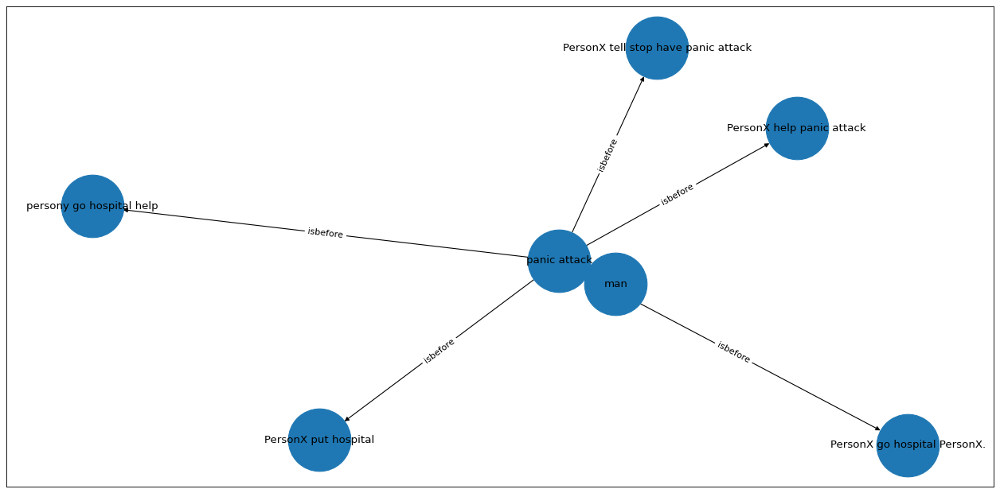

165it [01:05,  2.10it/s]

Andy PROPN
Andy PROPN
[['Andy', 'hosted', 'a checker party at Andy house'], ['Andy', 'hosted', 'with dress requirements']]


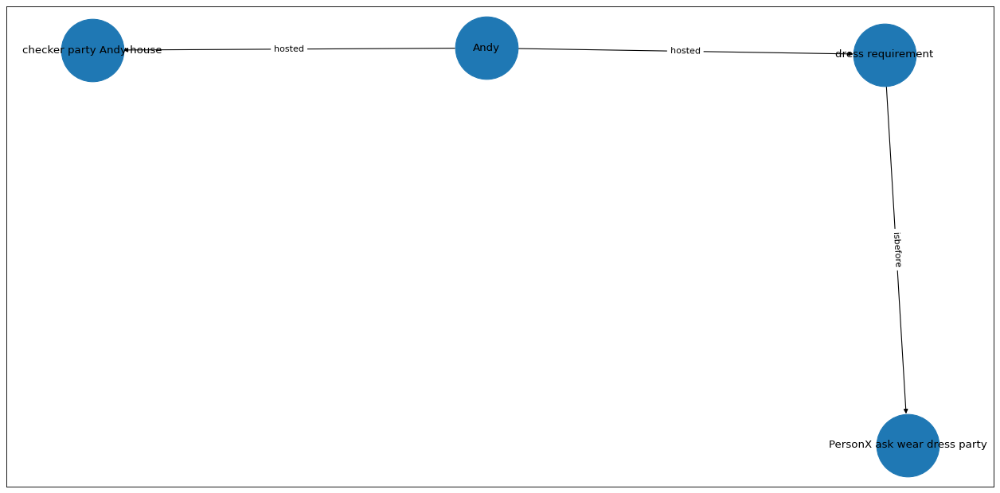

166it [01:06,  2.34it/s]

My DET
[['My dad and I', 'flew', 'to Canada']]


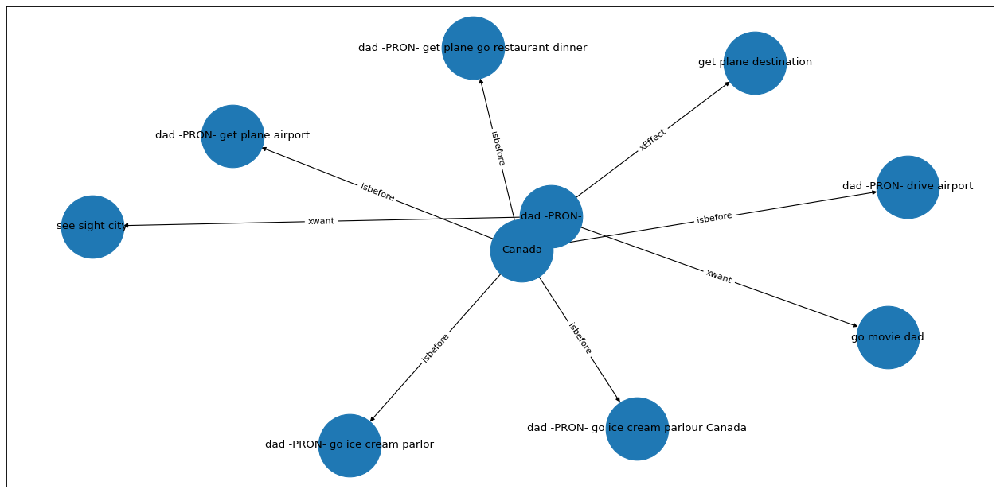

167it [01:06,  2.17it/s]

Mary PROPN
Mary PROPN
[['Mary and Cindy', 'work', 'together'], ['Mary and Cindy', 'work', 'in the office']]


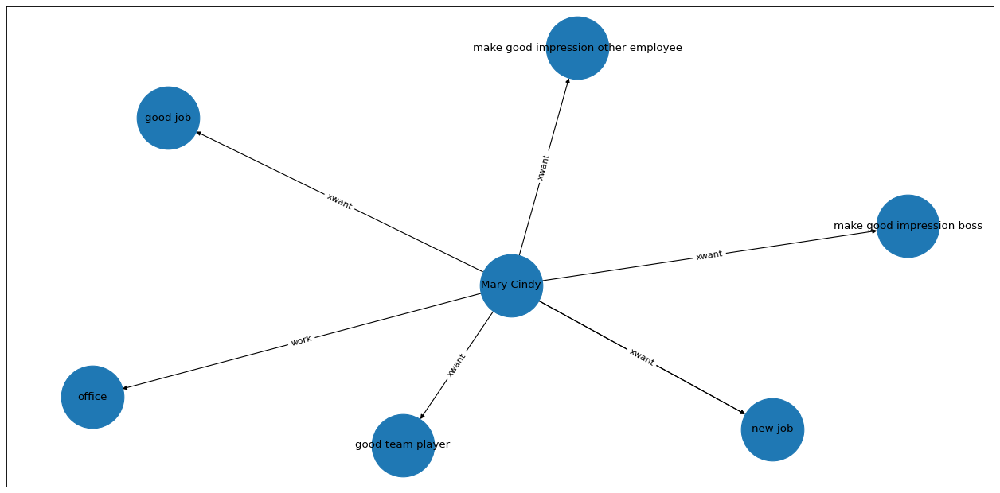

168it [01:07,  2.08it/s]

I PRON
I PRON
[['I', 'got', 'One Christmas'], ['I', 'got', 'a basket of chocolates for my mom']]


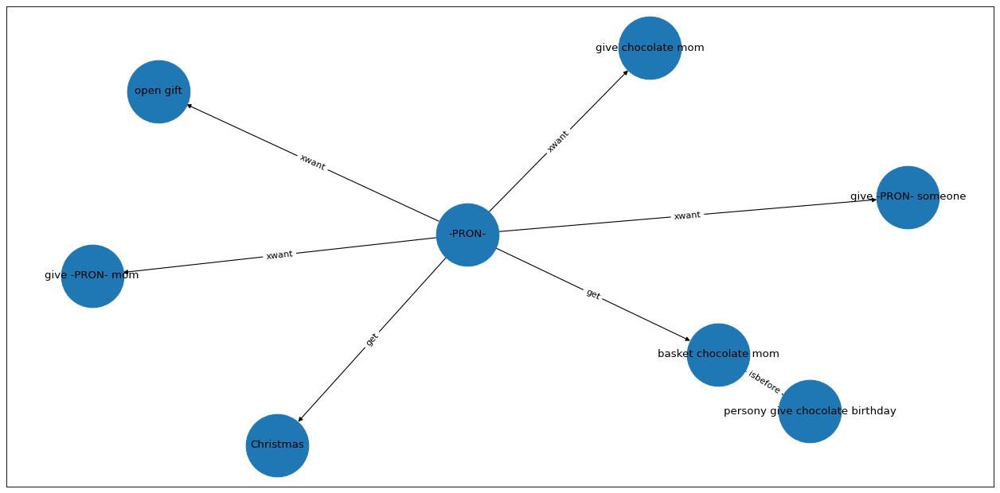

169it [01:07,  1.99it/s]

Lucy PROPN
[['Lucy', 'shopping', 'for fabric']]


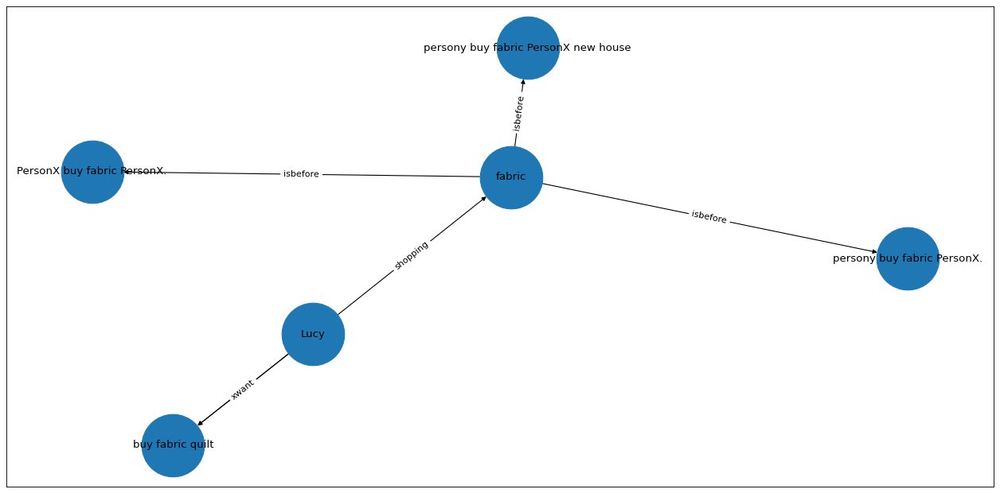

170it [01:08,  2.08it/s]

Abel PROPN
Abel PROPN
[['Abel', 'worked', 'hard'], ['Abel', 'worked', 'mowing lawns for extra money']]


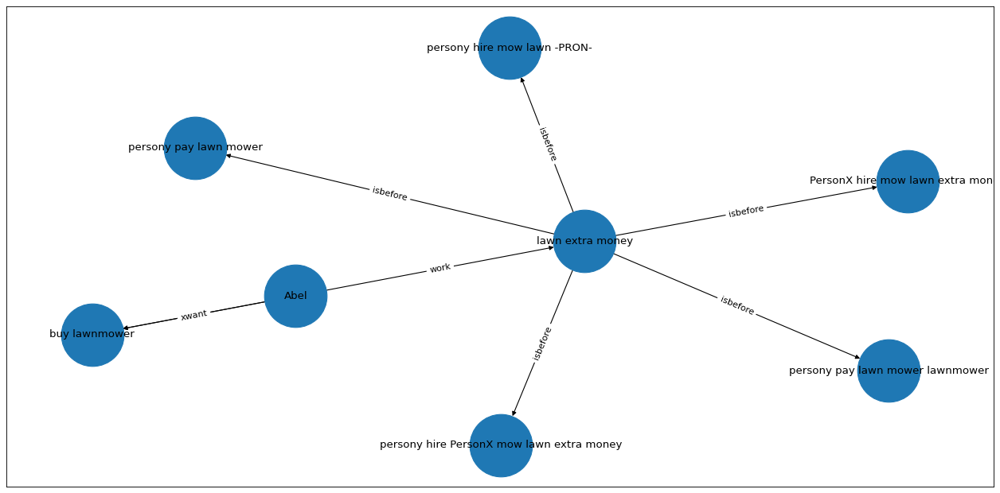

171it [01:08,  1.99it/s]

we PRON
we PRON
[['we', 'have', 'In Fort Worth'], ['we', 'have', 'an event call hit the bricks']]


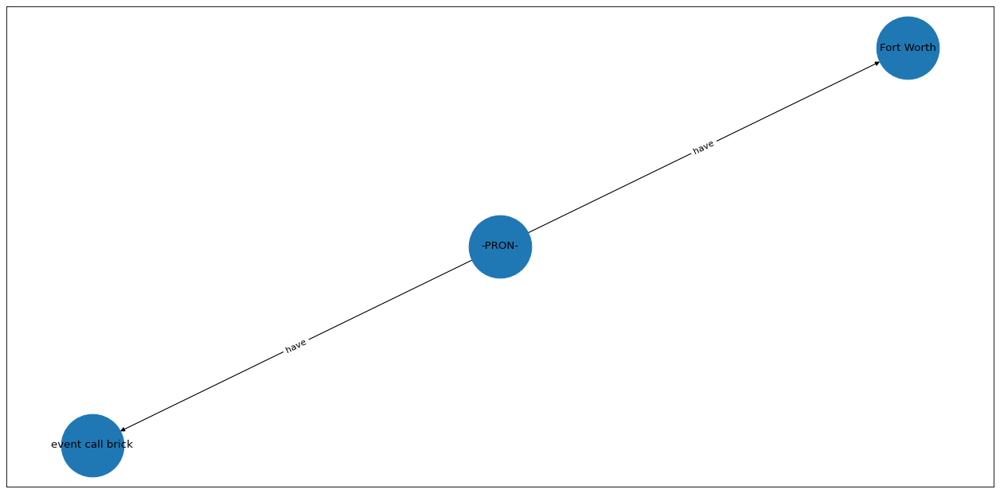

172it [01:08,  2.30it/s]

My DET
My DET
[['My family', 'went', 'to the beach'], ['My family', 'went', 'for vacation']]


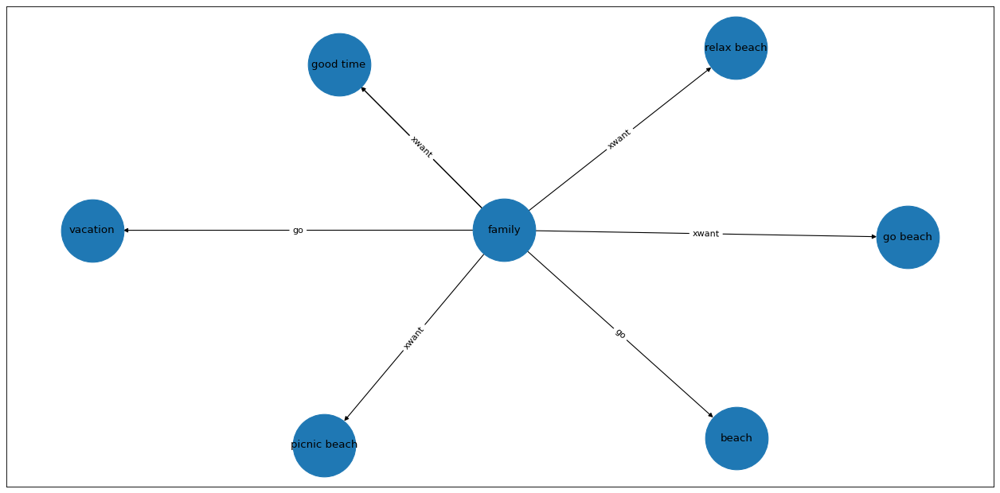

173it [01:09,  2.27it/s]

Amy PROPN
Amy PROPN
Ray PROPN
Ray PROPN
[['Amy', 'accepted', 'finally'], ['Amy', 'accepted', "Amy crush Ray was n't interested in Amy"], ['Ray', 'was', "n't"], ['Ray', 'was', 'interested in Amy']]


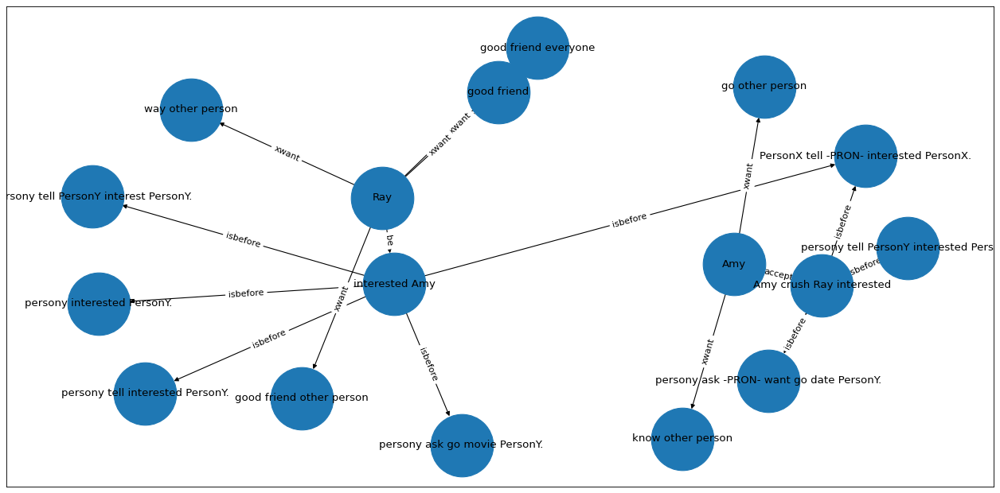

174it [01:10,  1.72it/s]

John PROPN
John PROPN
John PROPN
[['John', 'received', 'Every year for Christmas'], ['John', 'received', 'a fruit basket'], ['John', 'received', 'from Christmas']]


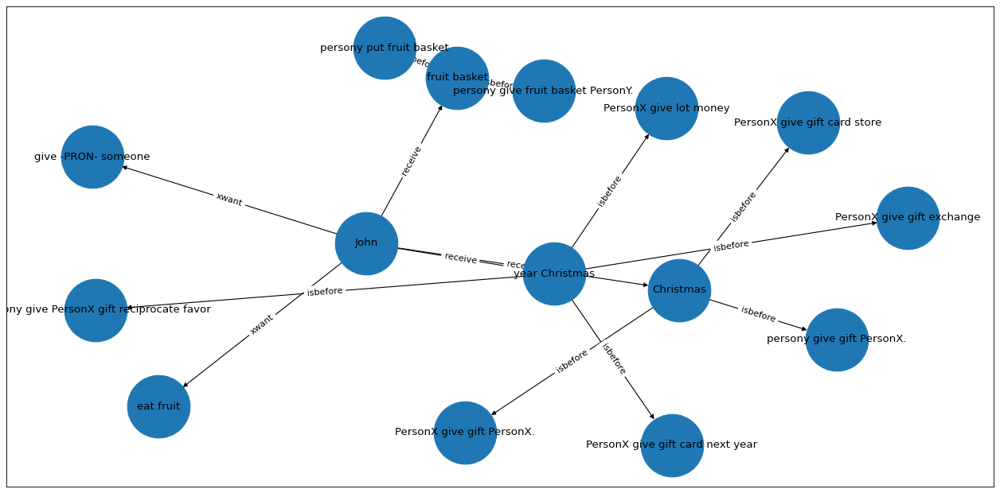

175it [01:11,  1.59it/s]

The DET
The DET
[['The Lake Family', 'goes', 'on a road trip'], ['The Lake Family', 'goes', 'each summer']]


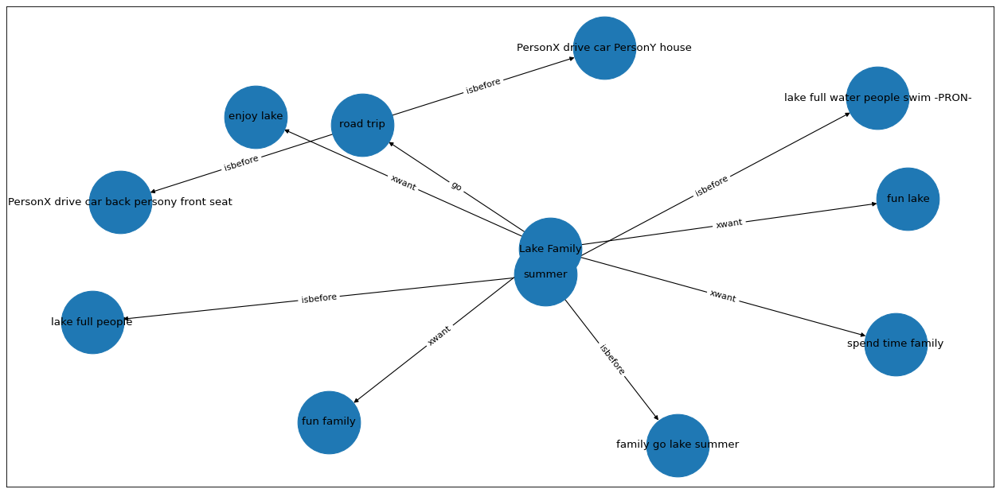

176it [01:11,  1.61it/s]

The DET
The DET
what PRON
[['The chef', 'know', "n't"], ['The chef', 'know', "what to make for this week 's special"], ['what', 'make', "for this week 's special"]]


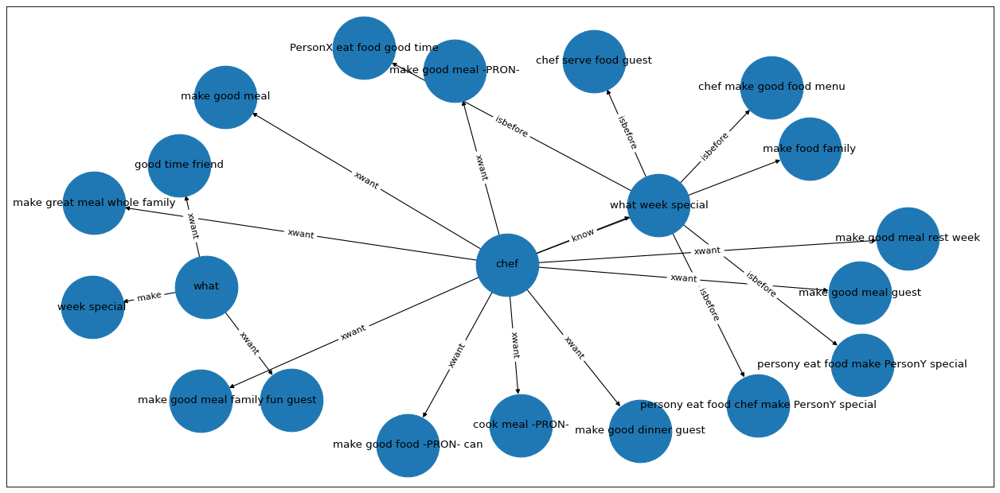

177it [01:12,  1.41it/s]

Michael PROPN
[['Michael', 'was', 'in love with Cindy']]


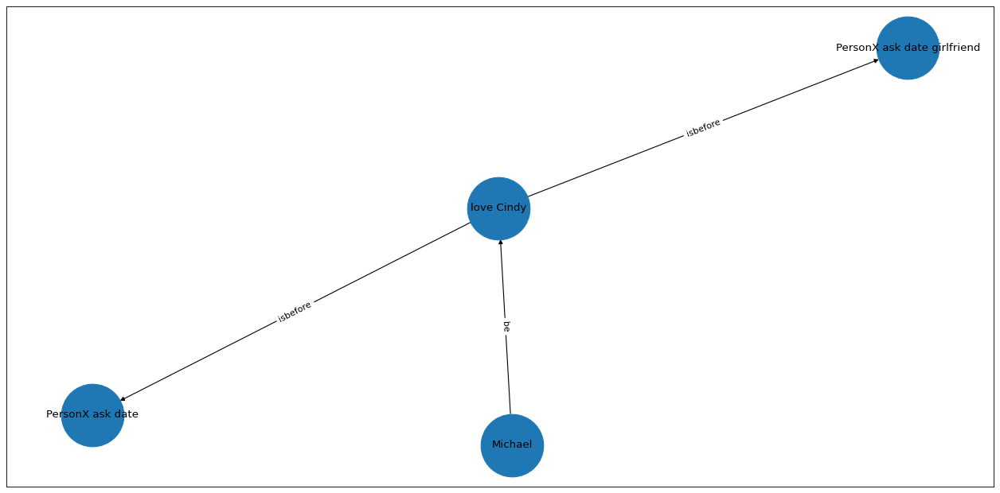

178it [01:12,  1.69it/s]

Jasmine PROPN
Jasmine PROPN
the DET
[['Jasmine', 'know', "n't"], ['Jasmine', 'know', 'how to play the guitar'], ['the guitar', 'play', 'how']]


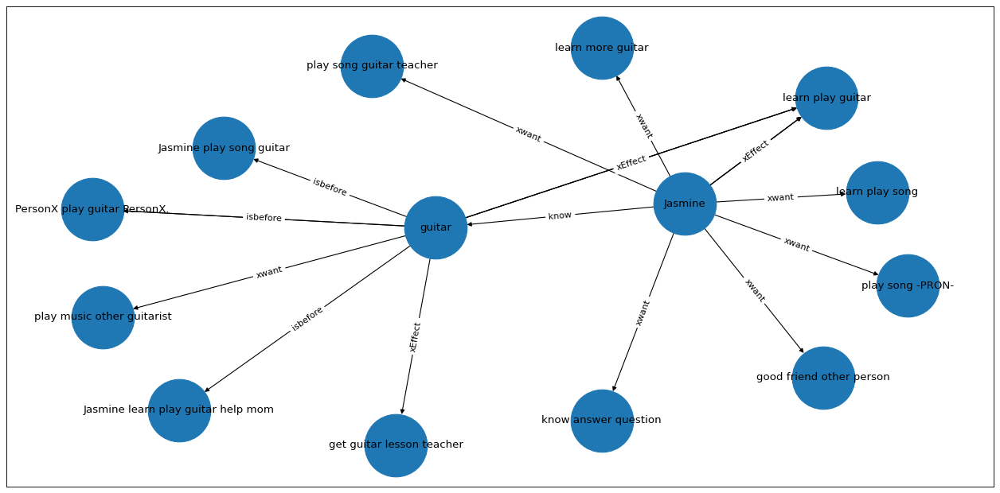

179it [01:13,  1.49it/s]

Sam PROPN
[["Sam 's school", 'having', 'a canned food drive']]


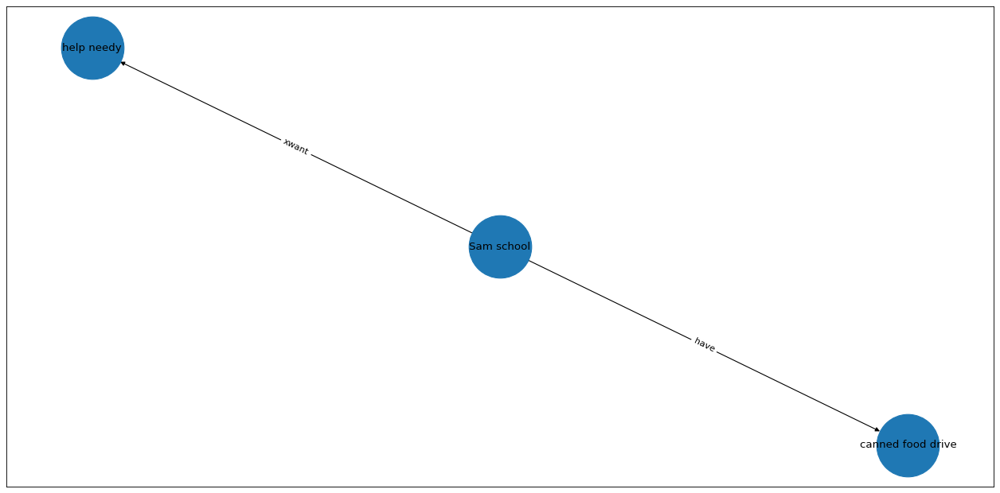

180it [01:14,  1.81it/s]

Bob PROPN
Bob PROPN
[['Bob', 'got', 'drunk'], ['Bob', 'got', 'at the Christmas party']]


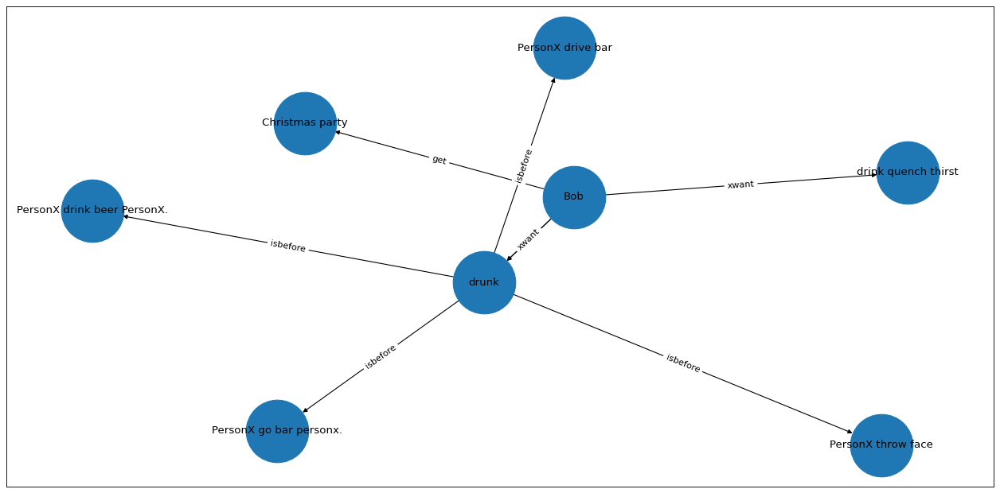

181it [01:14,  1.88it/s]

Penelope NOUN
Penelope NOUN
[['Penelope', 'felt', 'never'], ['Penelope', 'felt', 'a strong connection to Penelope grandmother']]


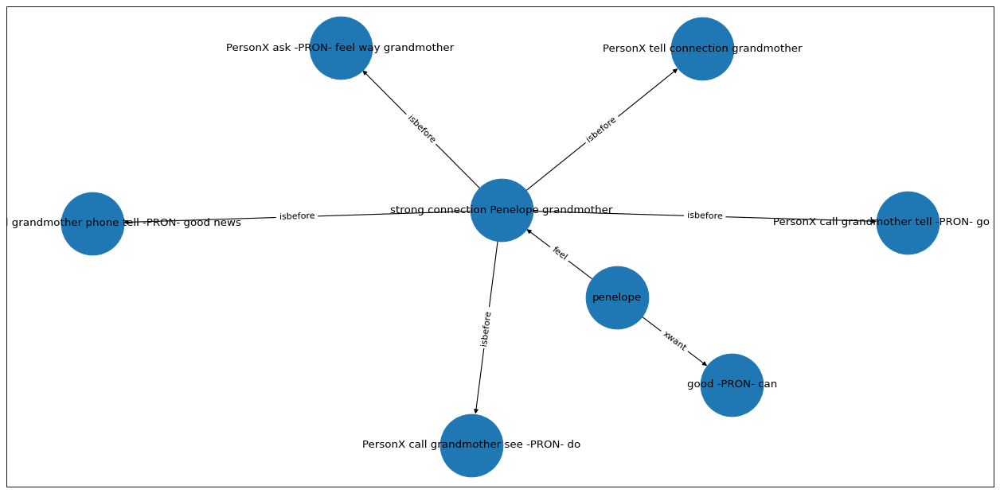

182it [01:15,  1.78it/s]

Mark PROPN
Mark PROPN
a DET
[['Mark', 'was', 'convinced there was a ghost in Mark house'], ['Mark', 'convinced', 'there was a ghost in Mark house'], ['a ghost', 'was', 'in Mark house']]


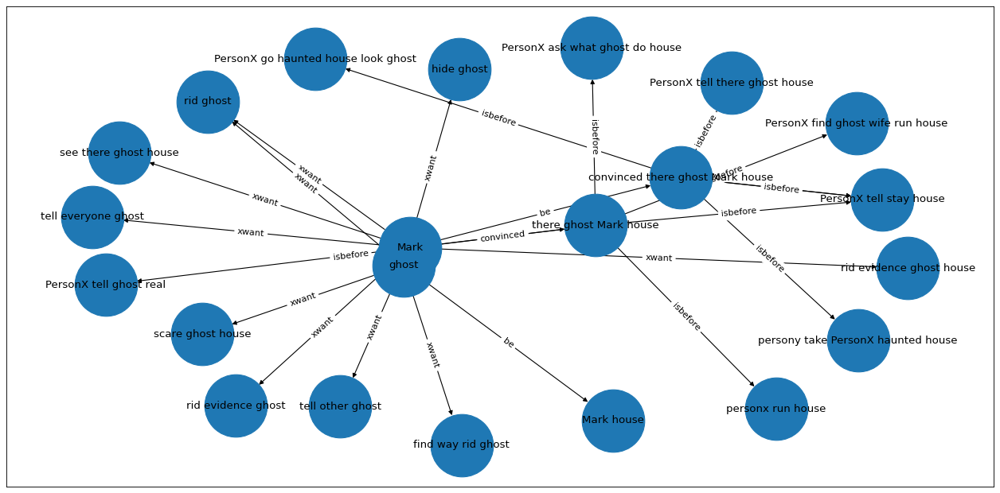

183it [01:16,  1.41it/s]

Billy PROPN
Billy PROPN
Billy PROPN
[['Billy', 'saw', 'One day'], ['Billy', 'saw', 'a magician'], ['Billy', 'saw', 'at a birthday party']]


183it [01:17,  2.37it/s]


KeyboardInterrupt: 

In [36]:
graphs = []
reduced_triples = []
for idx, row in tqdm(new_events_df.iloc[:10000].iterrows()):
    graph = nx.MultiDiGraph()
    plt.figure(figsize=(20, 10), dpi=80)
    graph_triples = []
    for f in range(1,2):
        triples_f = row[f'triples{f}']

        if isinstance(triples_f, float):
            continue
        triples_f = ast.literal_eval(triples_f)
        for triple in triples_f:
#             print (triple)
            verb = nlp(triple[1].strip())
            head_lemma = nlp(triple[0].strip())
            print(head_lemma[0].text, head_lemma[0].pos_)
            head = " ".join(list(dict.fromkeys([lemmatize(token) for token in head_lemma if token.pos_ in ['NOUN', 'ADJ', 'PROPN', 'PRON']])))
            tail_lemma = nlp(triple[2].strip())
            tail = " ".join(list(dict.fromkeys([lemmatize(token) for token in tail_lemma if token.pos_ in ['NOUN', 'ADJ', 'PROPN', 'PRON']])))
            if head and tail:
                graph_triples.append([head, tail, verb[0].lemma_])
                graph.add_edge(head, tail, rel=verb[0].lemma_)
        if f < 5:
            pruned_triples = []
            pruned_comet = row[f'pruned_comet{f}']
            if isinstance(pruned_comet, float):
                continue
            pruned_comet = ast.literal_eval(pruned_comet)
            for p in pruned_comet:
                comet_events = list(p[2])
    #             print(comet_events)
                for i in range(len(comet_events)):
                    if p[1] in ['xWant','xEffect']:
                        pruned_triples.append([p[0][0], p[1], comet_events[i]])
                    else:
                        pruned_triples.append([p[0][2], p[1], comet_events[i]])
            for triple in pruned_triples:
    #             print (triple)
                verb = nlp(triple[1].strip())
                head_lemma = nlp(triple[0].strip())
#                 print(head_lemma[0].text, head_lemma[0].pos_)
                head = " ".join(list(dict.fromkeys([lemmatize(token) for token in head_lemma if token.pos_ in ['NOUN', 'ADJ', 'PROPN', 'PRON']])))
                tail_lemma = nlp(triple[2].strip())
                tail = " ".join(list(dict.fromkeys([lemmatize(token) for token in tail_lemma if token.pos_ in ['VERB', 'NOUN', 'ADJ', 'PROPN', 'PRON']])))
                if head and tail:
                    graph.add_edge(head, tail, rel=verb[0].lemma_)
        print(triples_f)

    
#     graphs.append(graph)
    
    pos=nx.spring_layout(graph)
    nx.draw_networkx(graph, pos, node_size=5000)
    labels = dict([((fe,se,),e['rel'])
        for fe,se,e in graph.edges(data=True)])
    nx.draw_networkx_edge_labels(graph, pos, edge_labels=labels)
    plt.show()    
    

In [46]:
graphs = []
reduced_triples = []
for idx, row in tqdm(new_events_df.iloc[:10].iterrows()):
    graph = nx.MultiDiGraph()
    plt.figure(figsize=(20, 10), dpi=80)
    graph_triples = {}
    subgraphs = []
    for f in range(1,6):
        triples_f = row[f'triples{f}']

        if isinstance(triples_f, float):
            continue
        triples_f = ast.literal_eval(triples_f)
        for triple in triples_f:
#             print (triple)
            verb = nlp(triple[1].strip())
            head_lemma = nlp(triple[0].strip())
#             print(head_lemma[0].text, head_lemma[0].pos_)
            head = " ".join(list(dict.fromkeys([lemmatize(token) for token in head_lemma])))
            tail_lemma = nlp(triple[2].strip())
            tail = " ".join(list(dict.fromkeys([lemmatize(token) for token in tail_lemma])))
            if head and tail:
                graph.add_edge(head, tail, rel=verb[0].lemma_)
        if f < 5:
            pruned_triples = []
            pruned_comet = row[f'sentence_{f}']
            if isinstance(pruned_comet, float):
                continue
            pruned_comet = ast.literal_eval(pruned_comet)
            for p in pruned_comet:
                comet_events = list(p[2])
    #             print(comet_events)
                for i in range(len(comet_events)):
                    if p[1] in ['xWant','xEffect']:
                        pruned_triples.append([p[0][0], p[1], comet_events[i]])
                    else:
                        pruned_triples.append([p[0][2], p[1], comet_events[i]])
            for triple in pruned_triples:
    #             print (triple)
                verb = nlp(triple[1].strip())
                head_lemma = nlp(triple[0].strip())
#                 print(head_lemma[0].text, head_lemma[0].pos_)
                head = " ".join(list(dict.fromkeys([lemmatize(token) for token in head_lemma])))
                tail_lemma = nlp(triple[2].strip())
                tail = " ".join(list(dict.fromkeys([lemmatize(token) for token in tail_lemma])))
                if head and tail:
                    graph.add_edge(head, tail, rel=verb[0].lemma_)
        graph_triples[f] = graph.edges(data=True)
        subgraphs.append(graph)
    
    graphs.append(subgraphs)
    
#     print(graph.edges(data=True))
#     pos=nx.spring_layout(graph)
#     nx.draw_networkx(graph, pos, node_size=5000)
#     labels = dict([((fe,se,),e['rel'])
#         for fe,se,e in graph.edges(data=True)])
#     nx.draw_networkx_edge_labels(graph, pos, edge_labels=labels)
#     plt.show()    
    

10it [01:07,  6.77s/it]


<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

In [47]:
new_events_graphs = new_events_df.iloc[:10]

In [48]:
for i in range(1,6):
    new_events_graphs[f'graph_{i}'] = [g[i-1] for g in graphs]

In [50]:
new_events_graphs['graph_1'][0]

In [52]:
new_events_graphs.to_pickle('../../generated/graph_construction/sample_ROCStories_graphs.pkl')

In [53]:
ez = pd.read_pickle('../../generated/graph_construction/sample_ROCStories_graphs.pkl')

In [61]:
graph = ez['graph_1'][0]

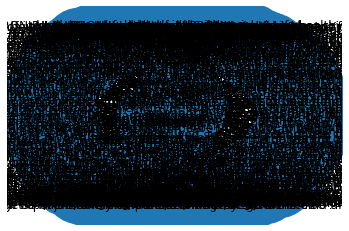

In [62]:
pos=nx.spring_layout(graph)
nx.draw_networkx(graph, pos, node_size=5000)
labels = dict([((fe,se,),e['rel'])
    for fe,se,e in graph.edges(data=True)])
nx.draw(graph, pos)
plt.show() 

In [63]:
graphs = []
reduced_triples = []
for idx, row in tqdm(new_events_df.iloc[:10].iterrows()):
    graph = nx.MultiDiGraph()
    plt.figure(figsize=(20, 10), dpi=80)
    graph_triples = {}
    subgraphs = []
    for f in range(1,6):
        triples_f = row[f'triples{f}']

        if isinstance(triples_f, float):
            continue
        triples_f = ast.literal_eval(triples_f)
        for triple in triples_f:
#             print (triple)
            verb = nlp(triple[1].strip())
            head_lemma = nlp(triple[0].strip())
#             print(head_lemma[0].text, head_lemma[0].pos_)
            head = " ".join(list(dict.fromkeys([lemmatize(token) for token in head_lemma])))
            tail_lemma = nlp(triple[2].strip())
            tail = " ".join(list(dict.fromkeys([lemmatize(token) for token in tail_lemma])))
            if head and tail:
                graph.add_edge(head, tail, rel=verb[0].lemma_)
        if f < 5:
            pruned_triples = []
            pruned_comet = row[f'pruned_comet{f}']
            if isinstance(pruned_comet, float):
                continue
            pruned_comet = ast.literal_eval(pruned_comet)
            for p in pruned_comet:
                comet_events = list(p[2])
    #             print(comet_events)
                for i in range(len(comet_events)):
                    if p[1] in ['xWant','xEffect']:
                        pruned_triples.append([p[0][0], p[1], comet_events[i]])
                    else:
                        pruned_triples.append([p[0][2], p[1], comet_events[i]])
            for triple in pruned_triples:
    #             print (triple)
                verb = nlp(triple[1].strip())
                head_lemma = nlp(triple[0].strip())
#                 print(head_lemma[0].text, head_lemma[0].pos_)
                head = " ".join(list(dict.fromkeys([lemmatize(token) for token in head_lemma])))
                tail_lemma = nlp(triple[2].strip())
                tail = " ".join(list(dict.fromkeys([lemmatize(token) for token in tail_lemma])))
                if head and tail:
                    graph.add_edge(head, tail, rel=verb[0].lemma_)
        graph_triples[f] = graph.edges(data=True)
        subgraphs.append(graph)
    
    graphs.append(subgraphs)
    
#     print(graph.edges(data=True))
#     pos=nx.spring_layout(graph)
#     nx.draw_networkx(graph, pos, node_size=5000)
#     labels = dict([((fe,se,),e['rel'])
#         for fe,se,e in graph.edges(data=True)])
#     nx.draw_networkx_edge_labels(graph, pos, edge_labels=labels)
#     plt.show()    
    

10it [00:04,  2.02it/s]


<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

<Figure size 1600x800 with 0 Axes>

In [64]:
for i in range(1,6):
    new_events_graphs[f'pruned_graph_{i}'] = [g[i-1] for g in graphs]

In [65]:
new_events_graphs.to_pickle('../../generated/graph_construction/sample_ROCStories_graphs.pkl')

In [66]:
ez = pd.read_pickle('../../generated/graph_construction/sample_ROCStories_graphs.pkl')

In [67]:
graph = ez['pruned_graph_1'][0]

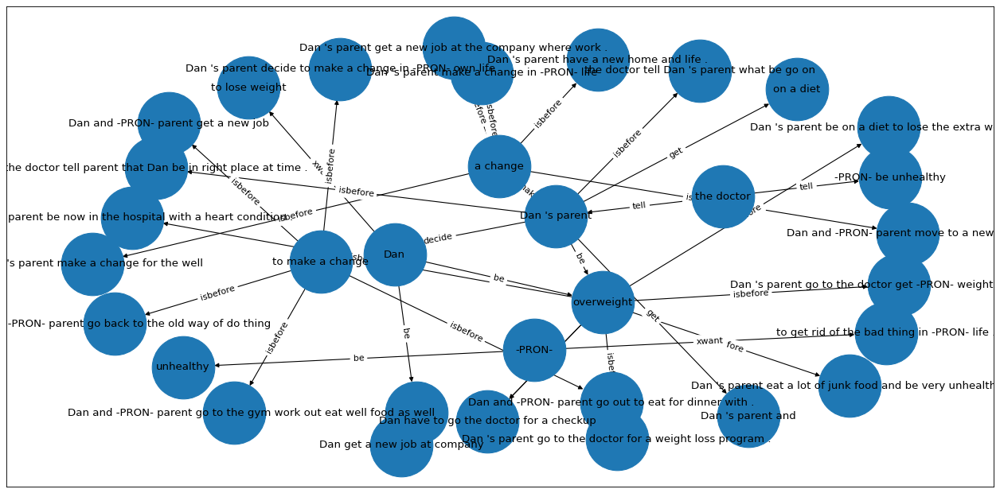

In [70]:
plt.figure(figsize=(20, 10), dpi=80)
pos=nx.spring_layout(graph)
nx.draw_networkx(graph, pos, node_size=5000)
labels = dict([((fe,se,),e['rel'])
    for fe,se,e in graph.edges(data=True)])
nx.draw_networkx_edge_labels(graph, pos, edge_labels=labels)
plt.show() 